# Week9: GAN

## 实验要求与基本流程

### 实验要求
1. 结合理论课内容，深入理解GAN(Generative Adversarial Networks,生成对抗网络)的原理与训练过程.了解GAN网络结构的演变过程与几个基本的GAN的原理(如DCGAN,wGAN等.)
2. 阅读实验指导书的实验内容,按照提示运行以及补充实验代码,或者简要回答问题.提交作业时,保留实验结果.


### 实验流程
* GAN的网络结构与训练
* DCGAN
* LSGAN
* WGAN
* WGAN-GP

## GAN(Generative Adversarial Networks)

让我们先来看一个只是用线性层的生成对抗网络(GAN),来简单了解一下GAN的基本网络结构与训练过程.

这个GAN网络结构分为两部分,生成器网络Generator和判别器网络Discriminator.
- 生成器Generator将随机生成的噪声z通过多个线性层生成图片,注意生成器的最后一层是Tanh,所以我们生成的图片的取值范围为\[-1,1\],同理,我们会将真实图片归一化(normalize)到\[-1,1\].
- 而判别器Discriminator是一个二分类器,通过多个线性层得到一个概率值来判别图片是"真实"或者是"生成"的,所以在Discriminator的最后是一个sigmoid,来得到图片是"真实"的概率.

在所有的网络结构中我们都使用了LeakyReLU作为激活函数,除了G与D的最后一层,同时,我们在层与层之间我们还加入了BatchNormalization.

In [1]:
import torch

torch.cuda.set_device(2)

In [2]:
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
class Generator(nn.Module):
    def __init__(self, image_size=32, latent_dim=100, output_channel=1):
        """
        image_size: image with and height
        latent dim: the dimension of random noise z
        output_channel: the channel of generated image, for example, 1 for gray image, 3 for RGB image
        """
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.output_channel = output_channel
        self.image_size = image_size
        
        # Linear layer: latent_dim -> 128 -> 256 -> 512 -> 1024 -> output_channel * image_size * image_size -> Tanh
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Linear(1024, output_channel * image_size * image_size),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), self.output_channel, self.image_size, self.image_size)
        return img


class Discriminator(nn.Module):
    def __init__(self, image_size=32, input_channel=1):
        """
        image_size: image with and height
        input_channel: the channel of input image, for example, 1 for gray image, 3 for RGB image
        """
        super(Discriminator, self).__init__()
        self.image_size = image_size
        self.input_channel = input_channel
        
        # Linear layer: input_channel * image_size * image_size -> 1024 -> 512 -> 256 -> 1 -> Sigmoid
        self.model = nn.Sequential(
            nn.Linear(input_channel * image_size * image_size, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        out = self.model(img_flat)
        return out

### 数据集
在训练我们的GAN网络之前, 先介绍一下本次实验可训练GAN的数据集,我们提供了两个数据集来供大家进行尝试数据集.
- MNIST手写体3类数据集,这里为了加快我们的训练速度,我们提供了一个简化版本的只包含数字0,2的2类MNIST数据集,每类各1000张.图片为28\*28的单通道灰度图(我们将其resize到32\*32),对于GAN而言,我们不需要测试集.我们本次实验主要使用该数据集作为主要的训练数据集.


- 室内家具数据集.为了加快我们的训练速度,我们将其做了删减处理,仅包含chair等一个类,共500张.图片为32\*32的3通道彩色图片.



下面是两个加载数据集的函数.注意我们将所有图片normalize到了\[-1,1\]之间.


In [4]:
def load_mnist_data():
    """
    load mnist(0,1,2) dataset 
    """
    
    transform = torchvision.transforms.Compose([
        # transform to 1-channel gray image since we reading image in RGB mode
        transforms.Grayscale(1),
        # resize image from 28 * 28 to 32 * 32
        transforms.Resize(32),
        transforms.ToTensor(),
        # normalize with mean=0.5 std=0.5
        transforms.Normalize(mean=(0.5, ), 
                             std=(0.5, ))
        ])
    
    train_dataset = torchvision.datasets.ImageFolder(root='./data/mnist', transform=transform)
    
    return train_dataset

def load_furniture_data():
    """
    load furniture dataset 
    """
    transform = torchvision.transforms.Compose([
        transforms.ToTensor(),
        # normalize with mean=0.5 std=0.5
        transforms.Normalize(mean=(0.5, 0.5, 0.5), 
                             std=(0.5, 0.5, 0.5))
        ])
    train_dataset = torchvision.datasets.ImageFolder(root='./data/household_furniture', transform=transform)
    return train_dataset

(*无需阅读理解*)运行下面2个cell的代码来查看两个数据集中的20张随机真实图片.

In [5]:
def denorm(x):
    # denormalize
    out = (x + 1) / 2
    return out.clamp(0, 1)

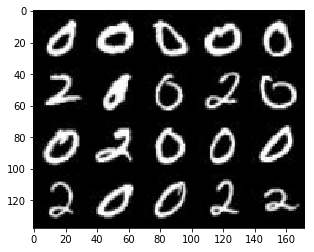

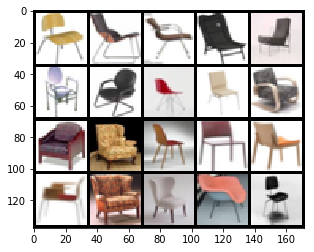

In [6]:
from utils import show
"""
you can pass code in this cell
"""
# show mnist real data
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
show(torchvision.utils.make_grid(denorm(next(iter(trainloader))[0]), nrow=5))
# show furniture real data
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
show(torchvision.utils.make_grid(denorm(next(iter(trainloader))[0]), nrow=5))

下面代码实现GAN在一个epoch内的训练过程.

大体而言,GAN的训练过程分为两步,首先将随机噪声z喂给G,生成图片,然后将真实图片和G生成的图片喂给D,然后使用对应的loss函数反向传播优化D.然后再次使用G生成图片,并喂给D,并使用对应的loss函数反向传播优化G.

下面的图片是普通的GAN在G和D上的优化目标:
![gan_d](./pictures/gan_d.png)
![gan_g](./pictures/gan_g.png)
值得注意的是,上述图片描述的是G和D的**优化目标**,而在具体实现过程中,我们实现loss函数来达到优化目标.对于上图中D与G的优化目标我们可以使用Binary Cross Entroy损失函数来实现:
$$
BCEloss(p_i,y_i)= -(y_i\log{p_i}+(1−y_i)\log{(1−p_i)})
$$
$p_i$, $y_i$分别是模型的预测值与图片的真实标签(1为真,0为假).因此,对于D,最大化其优化目标可以通过最小化一个BCEloss来实现,其真实图片$x\sim{P_r}$的标签设置为1,而生成图片$z\sim{P(z)}$的标签设置为0.我们可以看到这样的损失函数相当于对D的优化目标加上负号.

而对于G,也通过最小化一个BCEloss来实现,即将生成图片$z\sim{P(z)}$的标签设置为1即可,我们可以看到这样的损失函数与其优化目标是一致的.

In [7]:
def train(trainloader, G, D, G_optimizer, D_optimizer, loss_func, device, z_dim):
    """
    train a GAN with model G and D in one epoch
    Args:
        trainloader: data loader to train
        G: model Generator
        D: model Discriminator
        G_optimizer: optimizer of G(etc. Adam, SGD)
        D_optimizer: optimizer of D(etc. Adam, SGD)
        loss_func: loss function to train G and D. For example, Binary Cross Entropy(BCE) loss function
        device: cpu or cuda device
        z_dim: the dimension of random noise z
    """
    # set train mode
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    
    for i, (x, _) in enumerate(trainloader):
        # real label and fake label
        y_real = torch.ones(x.size(0), 1).to(device)
        y_fake = torch.zeros(x.size(0), 1).to(device)
        
        x = x.to(device)
        z = torch.rand(x.size(0), z_dim).to(device)

        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = loss_func(d_real, y_real)
        
        # D fake loss from fake images generated by G
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = loss_func(d_fake, y_fake)
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        D_optimizer.step()

        # update G network
        # G optimizer zero grads
        G_optimizer.zero_grad()
        
        # G loss
        g_z = G(z)
        d_fake = D(g_z)
        g_loss = loss_func(d_fake, y_real)
        
        # G backward and step
        g_loss.backward()
        G_optimizer.step()
        
        D_total_loss += d_loss.item()
        G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss / len(trainloader)

当模型训练后,我们需要查看此时G生成的图片效果,下面的visualize_results代码便实现了这块内容.注意,我们生成的图片都在\[-1,1\],因此,我们需要将图片反向归一化(denorm)到\[0,1\].

In [8]:
def visualize_results(G, device, z_dim, result_size=20):
    G.eval()
    
    z = torch.rand(result_size, z_dim).to(device)
    g_z = G(z)
    
    show(torchvision.utils.make_grid(denorm(g_z.detach().cpu()), nrow=5))

万事具备,接下来让我们来尝试这训练一个基本的GAN网络吧.这里实现run_gan函数来调用train以及visualize_results来训练我们的GAN.

In [9]:
def run_gan(trainloader, G, D, G_optimizer, D_optimizer, loss_func, n_epochs, device, latent_dim):
    d_loss_hist = []
    g_loss_hist = []

    for epoch in range(n_epochs):
        d_loss, g_loss = train(trainloader, G, D, G_optimizer, D_optimizer, loss_func, device, 
                               z_dim=latent_dim)
        print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))

        d_loss_hist.append(d_loss)
        g_loss_hist.append(g_loss)

        if epoch == 0 or (epoch + 1) % 10 == 0:
            visualize_results(G, device, latent_dim) 
    
    return d_loss_hist, g_loss_hist

设置好超参数就可以开始训练!让我们尝试用它来训练2类的mnist数据集

In [10]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:2')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use BCELoss as loss function
bceloss = nn.BCELoss().to(device)

# G and D model
G = Generator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = Discriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 1.1479, G loss: 0.7900


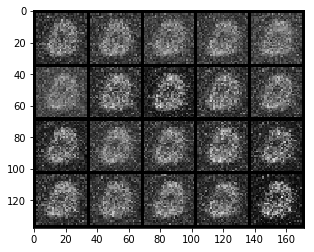

Epoch 1: Train D loss: 1.2522, G loss: 0.9260
Epoch 2: Train D loss: 1.2456, G loss: 0.9949
Epoch 3: Train D loss: 1.1445, G loss: 1.1608
Epoch 4: Train D loss: 1.0985, G loss: 1.1620
Epoch 5: Train D loss: 1.1350, G loss: 1.0471
Epoch 6: Train D loss: 1.0730, G loss: 1.1907
Epoch 7: Train D loss: 1.1082, G loss: 1.1438
Epoch 8: Train D loss: 1.0623, G loss: 1.2837
Epoch 9: Train D loss: 1.0621, G loss: 1.3193


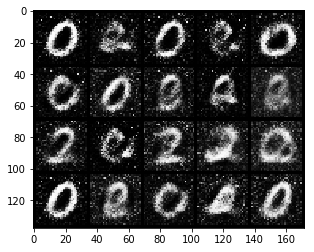

Epoch 10: Train D loss: 1.1081, G loss: 1.2568
Epoch 11: Train D loss: 1.0914, G loss: 1.2664
Epoch 12: Train D loss: 1.0938, G loss: 1.3109
Epoch 13: Train D loss: 1.0838, G loss: 1.2962
Epoch 14: Train D loss: 1.0900, G loss: 1.3302
Epoch 15: Train D loss: 1.0772, G loss: 1.3540
Epoch 16: Train D loss: 1.0767, G loss: 1.2979
Epoch 17: Train D loss: 1.0906, G loss: 1.3563
Epoch 18: Train D loss: 1.0679, G loss: 1.3069
Epoch 19: Train D loss: 1.0702, G loss: 1.3618


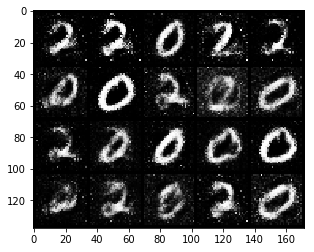

Epoch 20: Train D loss: 1.1094, G loss: 1.3302
Epoch 21: Train D loss: 1.0973, G loss: 1.2970
Epoch 22: Train D loss: 1.1095, G loss: 1.2867
Epoch 23: Train D loss: 1.0889, G loss: 1.3158
Epoch 24: Train D loss: 1.1085, G loss: 1.2759
Epoch 25: Train D loss: 1.0954, G loss: 1.2849
Epoch 26: Train D loss: 1.0978, G loss: 1.3454
Epoch 27: Train D loss: 1.1153, G loss: 1.2928
Epoch 28: Train D loss: 1.0880, G loss: 1.3170
Epoch 29: Train D loss: 1.1090, G loss: 1.2813


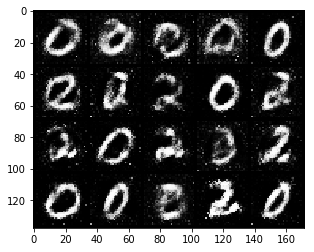

Epoch 30: Train D loss: 1.1248, G loss: 1.2866
Epoch 31: Train D loss: 1.0921, G loss: 1.2602
Epoch 32: Train D loss: 1.1530, G loss: 1.2330
Epoch 33: Train D loss: 1.1282, G loss: 1.2266
Epoch 34: Train D loss: 1.1330, G loss: 1.2257
Epoch 35: Train D loss: 1.1271, G loss: 1.2374
Epoch 36: Train D loss: 1.1135, G loss: 1.2542
Epoch 37: Train D loss: 1.1076, G loss: 1.2779
Epoch 38: Train D loss: 1.1186, G loss: 1.2646
Epoch 39: Train D loss: 1.1084, G loss: 1.2549


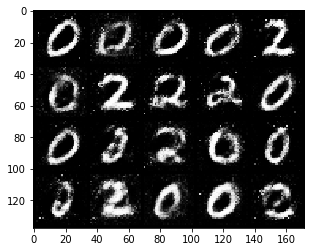

Epoch 40: Train D loss: 1.1174, G loss: 1.2693
Epoch 41: Train D loss: 1.1306, G loss: 1.2562
Epoch 42: Train D loss: 1.1332, G loss: 1.2229
Epoch 43: Train D loss: 1.1166, G loss: 1.2869
Epoch 44: Train D loss: 1.1047, G loss: 1.2979
Epoch 45: Train D loss: 1.1329, G loss: 1.2880
Epoch 46: Train D loss: 1.1398, G loss: 1.2325
Epoch 47: Train D loss: 1.1414, G loss: 1.2193
Epoch 48: Train D loss: 1.1441, G loss: 1.2196
Epoch 49: Train D loss: 1.1388, G loss: 1.2387


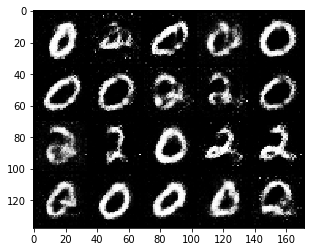

Epoch 50: Train D loss: 1.1395, G loss: 1.2442
Epoch 51: Train D loss: 1.1168, G loss: 1.2643
Epoch 52: Train D loss: 1.1345, G loss: 1.2458
Epoch 53: Train D loss: 1.1362, G loss: 1.2421
Epoch 54: Train D loss: 1.1282, G loss: 1.2258
Epoch 55: Train D loss: 1.1267, G loss: 1.2247
Epoch 56: Train D loss: 1.1227, G loss: 1.2782
Epoch 57: Train D loss: 1.1270, G loss: 1.2635
Epoch 58: Train D loss: 1.1279, G loss: 1.2698
Epoch 59: Train D loss: 1.1240, G loss: 1.2804


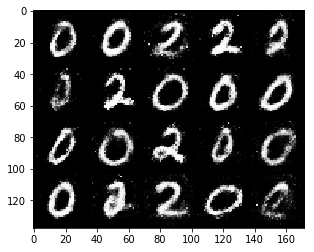

Epoch 60: Train D loss: 1.1223, G loss: 1.2660
Epoch 61: Train D loss: 1.1272, G loss: 1.2847
Epoch 62: Train D loss: 1.1124, G loss: 1.2592
Epoch 63: Train D loss: 1.1186, G loss: 1.3398
Epoch 64: Train D loss: 1.1213, G loss: 1.2930
Epoch 65: Train D loss: 1.1040, G loss: 1.2877
Epoch 66: Train D loss: 1.1131, G loss: 1.2915
Epoch 67: Train D loss: 1.0920, G loss: 1.3344
Epoch 68: Train D loss: 1.1052, G loss: 1.3010
Epoch 69: Train D loss: 1.1172, G loss: 1.3006


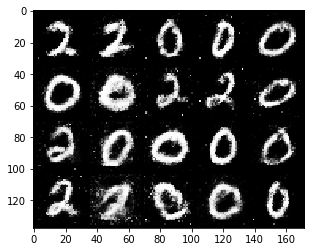

Epoch 70: Train D loss: 1.1147, G loss: 1.3261
Epoch 71: Train D loss: 1.0983, G loss: 1.3212
Epoch 72: Train D loss: 1.1002, G loss: 1.3352
Epoch 73: Train D loss: 1.1033, G loss: 1.3424
Epoch 74: Train D loss: 1.0947, G loss: 1.3269
Epoch 75: Train D loss: 1.0889, G loss: 1.3397
Epoch 76: Train D loss: 1.0818, G loss: 1.3747
Epoch 77: Train D loss: 1.0817, G loss: 1.3367
Epoch 78: Train D loss: 1.0941, G loss: 1.3277
Epoch 79: Train D loss: 1.0625, G loss: 1.3623


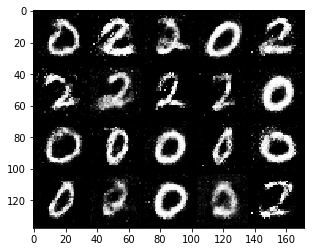

Epoch 80: Train D loss: 1.0616, G loss: 1.3921
Epoch 81: Train D loss: 1.0487, G loss: 1.4384
Epoch 82: Train D loss: 1.0442, G loss: 1.4196
Epoch 83: Train D loss: 1.0599, G loss: 1.4477
Epoch 84: Train D loss: 1.0342, G loss: 1.4613
Epoch 85: Train D loss: 1.0617, G loss: 1.4377
Epoch 86: Train D loss: 1.0356, G loss: 1.4424
Epoch 87: Train D loss: 1.0403, G loss: 1.4602
Epoch 88: Train D loss: 1.0282, G loss: 1.4912
Epoch 89: Train D loss: 1.0394, G loss: 1.4969


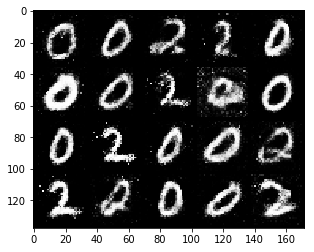

Epoch 90: Train D loss: 1.0046, G loss: 1.4604
Epoch 91: Train D loss: 1.0265, G loss: 1.4771
Epoch 92: Train D loss: 1.0234, G loss: 1.4869
Epoch 93: Train D loss: 1.0042, G loss: 1.5119
Epoch 94: Train D loss: 1.0162, G loss: 1.5215
Epoch 95: Train D loss: 0.9942, G loss: 1.5532
Epoch 96: Train D loss: 0.9974, G loss: 1.5761
Epoch 97: Train D loss: 0.9922, G loss: 1.5584
Epoch 98: Train D loss: 0.9964, G loss: 1.5454
Epoch 99: Train D loss: 0.9774, G loss: 1.5874


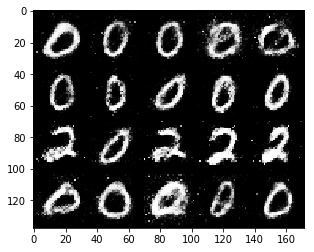

In [11]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)
    

训练完后,让我们来看一下G生成的图片效果,可以看到即使是一个简单的GAN在这种简单的数据集上的生成效果还是不错的,虽然仍然存在不少瑕疵,比如说我们可以看到生成的图片上的数字有很多奇怪的雪花等等.

让我们看一下G和D的loss变化曲线(运行下方语句.)

In [10]:
from utils import loss_plot

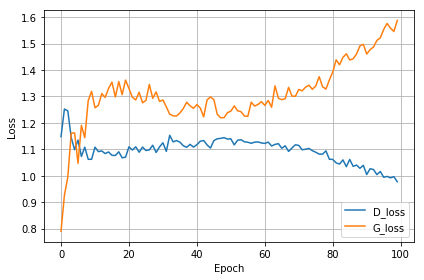

In [13]:
loss_plot(d_loss_hist, g_loss_hist)

#### **作业**:
观察G与D的loss曲线,与之前的训练的CNN的loss曲线相比,有什么不同?试简要回答你觉得可能产生这样的不同的原因.

答:

CNN的loss曲线通常是一开始下降得很快，等到迭代多次之后，loss曲线下降的速度将变慢，并且可能产生振荡，loss值可能上升。这是因为CNN训练一开始距离极值还很远，训练效率高。等到多次迭代之后，CNN可能已经接近拟合，甚至可能出现过拟合，导致loss值振荡。

而生成网络和判别网络的loss曲线与CNN的曲线都有明显区别，生成网络的loss值是逐渐变大，判别网络的loss值是逐渐变小。一开始，生成网络的loss值急剧上升，因为一开始生成网络受真实图片的影响小。随着迭代次数的增多，判别网络判断真假图的能力增大，生成网络的loss值迅速增大，而判别网络的loss值下降。

迭代多次之后，生成网络和判别网络开始对抗，生成网络的loss值可能因此有下降的概率，而判别网络也因此有上升的概率。因为生成网络生成假图以假乱真的能力增大，判别网络判别真假图的能力也增大，两者开始对抗。

在长期的若干次迭代中，生成网络的loss值趋向于增大，而判别网络趋向于下降。因为数据集的数量是有限的，网络最终必然倾向于拟合。loss曲线中判别器下降而生成器上升，是因为判别网络的判别能力增大的速度比生成网络的能力要快，也可能是生成网络已经达到拟合。

## DCGAN

在DCGAN(Deep Convolution GAN)中,最大的改变是使用了CNN代替全连接层.在生成器G中,使用stride为2的转置卷积来生成图片同时扩大图片尺寸,而在判别器D中,使用stride为2的卷积来将图片进行卷积并下采样.除此之外,DCGAN加入了在层与层之间BatchNormalization(虽然我们在普通的GAN中就已经添加),在G中使用ReLU作为激活函数,而在D中使用LeakyReLU作为激活函数.

In [11]:
from utils import initialize_weights
class DCGenerator(nn.Module):
    def __init__(self, image_size=32, latent_dim=64, output_channel=1):
        super(DCGenerator, self).__init__()
        self.image_size = image_size
        self.latent_dim = latent_dim
        self.output_channel = output_channel
        
        self.init_size = image_size // 8
        
        # fc: Linear -> BN -> ReLU
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 512 * self.init_size ** 2),
            nn.BatchNorm1d(512 * self.init_size ** 2),
            nn.ReLU(inplace=True)
        )
        
        # deconv: ConvTranspose2d(4, 2, 1) -> BN -> ReLU -> 
        #         ConvTranspose2d(4, 2, 1) -> BN -> ReLU -> 
        #         ConvTranspose2d(4, 2, 1) -> Tanh
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, output_channel, 4, stride=2, padding=1),
            nn.Tanh(),
        )
        initialize_weights(self)

    def forward(self, z):
        out = self.fc(z)
        out = out.view(out.shape[0], 512, self.init_size, self.init_size)
        img = self.deconv(out)
        return img


class DCDiscriminator(nn.Module):
    def __init__(self, image_size=32, input_channel=1, sigmoid=True):
        super(DCDiscriminator, self).__init__()
        self.image_size = image_size
        self.input_channel = input_channel
        self.fc_size = image_size // 8
        
        # conv: Conv2d(3,2,1) -> LeakyReLU 
        #       Conv2d(3,2,1) -> BN -> LeakyReLU 
        #       Conv2d(3,2,1) -> BN -> LeakyReLU 
        self.conv = nn.Sequential(
            nn.Conv2d(input_channel, 128, 3, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 3, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 3, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
        )
        
        # fc: Linear -> Sigmoid
        self.fc = nn.Sequential(
            nn.Linear(512 * self.fc_size * self.fc_size, 1),
        )
        if sigmoid:
            self.fc.add_module('sigmoid', nn.Sigmoid())
        initialize_weights(self)
        
        

    def forward(self, img):
        out = self.conv(img)
        out = out.view(out.shape[0], -1)
        out = self.fc(out)

        return out

同样的,我们使用同样的mnist数据集对DCGAN进行训练.

In [16]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:2')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use BCELoss as loss function
bceloss = nn.BCELoss().to(device)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 0.3227, G loss: 4.7262


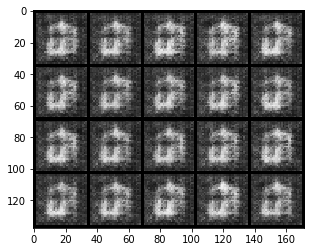

Epoch 1: Train D loss: 0.1802, G loss: 6.0149
Epoch 2: Train D loss: 0.2504, G loss: 6.1110
Epoch 3: Train D loss: 0.2906, G loss: 4.3278
Epoch 4: Train D loss: 0.2505, G loss: 4.0717
Epoch 5: Train D loss: 0.4934, G loss: 3.3927
Epoch 6: Train D loss: 0.6235, G loss: 2.7482
Epoch 7: Train D loss: 0.5500, G loss: 2.5948
Epoch 8: Train D loss: 0.5967, G loss: 2.5566
Epoch 9: Train D loss: 0.5337, G loss: 2.5167


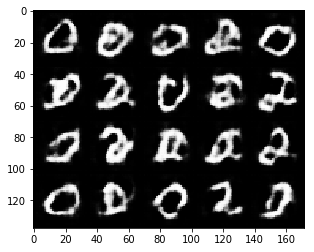

Epoch 10: Train D loss: 0.5073, G loss: 2.3814
Epoch 11: Train D loss: 0.6596, G loss: 2.4878
Epoch 12: Train D loss: 0.4683, G loss: 2.4597
Epoch 13: Train D loss: 0.6360, G loss: 2.5170
Epoch 14: Train D loss: 0.6484, G loss: 2.4288
Epoch 15: Train D loss: 0.4191, G loss: 2.5575
Epoch 16: Train D loss: 0.6454, G loss: 2.4641
Epoch 17: Train D loss: 0.5652, G loss: 2.4567
Epoch 18: Train D loss: 0.4752, G loss: 2.5614
Epoch 19: Train D loss: 0.5584, G loss: 2.5193


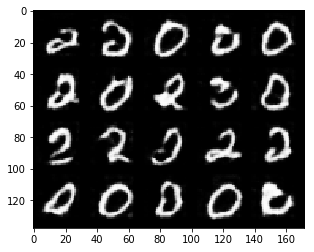

Epoch 20: Train D loss: 0.5546, G loss: 2.6618
Epoch 21: Train D loss: 0.4500, G loss: 2.6971
Epoch 22: Train D loss: 0.5400, G loss: 2.6828
Epoch 23: Train D loss: 0.4280, G loss: 2.7587
Epoch 24: Train D loss: 0.5106, G loss: 2.8028
Epoch 25: Train D loss: 0.3439, G loss: 3.1554
Epoch 26: Train D loss: 0.3312, G loss: 3.1468
Epoch 27: Train D loss: 0.4216, G loss: 3.2850
Epoch 28: Train D loss: 0.2703, G loss: 3.4632
Epoch 29: Train D loss: 0.1897, G loss: 3.6107


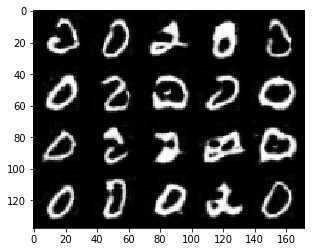

Epoch 30: Train D loss: 0.4400, G loss: 3.4530
Epoch 31: Train D loss: 0.3199, G loss: 3.2811
Epoch 32: Train D loss: 0.3640, G loss: 3.7487
Epoch 33: Train D loss: 0.3787, G loss: 3.3121
Epoch 34: Train D loss: 0.1229, G loss: 3.9296
Epoch 35: Train D loss: 0.0793, G loss: 4.2679
Epoch 36: Train D loss: 0.5538, G loss: 3.6268
Epoch 37: Train D loss: 0.5872, G loss: 2.9363
Epoch 38: Train D loss: 0.3198, G loss: 3.6864
Epoch 39: Train D loss: 0.2128, G loss: 3.5927


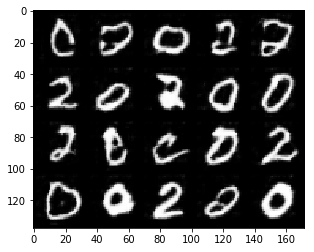

Epoch 40: Train D loss: 0.0850, G loss: 4.3344
Epoch 41: Train D loss: 0.2288, G loss: 4.5627
Epoch 42: Train D loss: 0.9208, G loss: 2.0486
Epoch 43: Train D loss: 0.5977, G loss: 2.9080
Epoch 44: Train D loss: 0.3598, G loss: 3.1001
Epoch 45: Train D loss: 0.1062, G loss: 3.8917
Epoch 46: Train D loss: 0.0657, G loss: 4.4267
Epoch 47: Train D loss: 0.0468, G loss: 4.6702
Epoch 48: Train D loss: 0.0412, G loss: 4.8560
Epoch 49: Train D loss: 0.8473, G loss: 4.5481


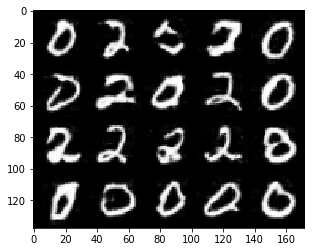

Epoch 50: Train D loss: 0.7797, G loss: 1.9866
Epoch 51: Train D loss: 0.3925, G loss: 3.2001
Epoch 52: Train D loss: 0.1504, G loss: 3.8240
Epoch 53: Train D loss: 0.0899, G loss: 4.2948
Epoch 54: Train D loss: 0.0669, G loss: 4.6758
Epoch 55: Train D loss: 0.6868, G loss: 3.1373
Epoch 56: Train D loss: 0.0758, G loss: 4.3472
Epoch 57: Train D loss: 0.0390, G loss: 4.7183
Epoch 58: Train D loss: 0.0300, G loss: 5.0745
Epoch 59: Train D loss: 0.0345, G loss: 5.2293


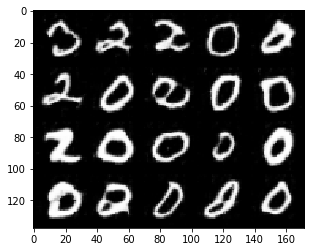

Epoch 60: Train D loss: 0.0322, G loss: 5.3760
Epoch 61: Train D loss: 0.7239, G loss: 3.3089
Epoch 62: Train D loss: 0.0634, G loss: 4.4676
Epoch 63: Train D loss: 0.0426, G loss: 4.9456
Epoch 64: Train D loss: 0.0331, G loss: 5.1379
Epoch 65: Train D loss: 0.0268, G loss: 5.4515
Epoch 66: Train D loss: 0.7055, G loss: 3.7639
Epoch 67: Train D loss: 0.5420, G loss: 3.6093
Epoch 68: Train D loss: 0.0732, G loss: 4.3954
Epoch 69: Train D loss: 0.3891, G loss: 4.1759


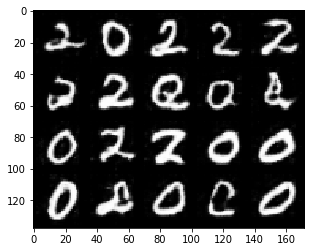

Epoch 70: Train D loss: 0.5470, G loss: 2.9162
Epoch 71: Train D loss: 0.1527, G loss: 3.9997
Epoch 72: Train D loss: 0.0443, G loss: 4.7329
Epoch 73: Train D loss: 0.0274, G loss: 5.3405
Epoch 74: Train D loss: 0.0235, G loss: 5.2964
Epoch 75: Train D loss: 0.0184, G loss: 5.5946
Epoch 76: Train D loss: 0.0160, G loss: 5.6729
Epoch 77: Train D loss: 0.0204, G loss: 5.8122
Epoch 78: Train D loss: 0.0148, G loss: 5.8300
Epoch 79: Train D loss: 0.0148, G loss: 5.8661


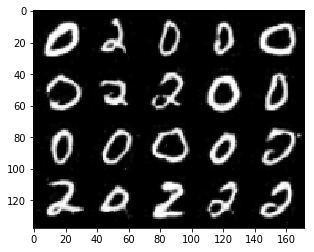

Epoch 80: Train D loss: 0.0132, G loss: 5.9278
Epoch 81: Train D loss: 0.0136, G loss: 6.0156
Epoch 82: Train D loss: 0.0110, G loss: 6.0796
Epoch 83: Train D loss: 0.0110, G loss: 6.1502
Epoch 84: Train D loss: 1.1274, G loss: 3.3745
Epoch 85: Train D loss: 0.5875, G loss: 2.3573
Epoch 86: Train D loss: 0.4906, G loss: 3.1559
Epoch 87: Train D loss: 0.4960, G loss: 3.4978
Epoch 88: Train D loss: 0.4433, G loss: 2.9901
Epoch 89: Train D loss: 0.0995, G loss: 4.4017


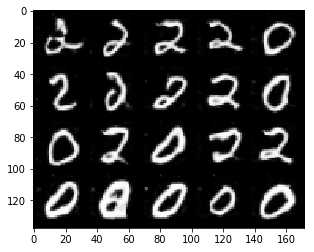

Epoch 90: Train D loss: 0.0404, G loss: 4.8691
Epoch 91: Train D loss: 0.0329, G loss: 5.2785
Epoch 92: Train D loss: 0.0239, G loss: 5.4882
Epoch 93: Train D loss: 0.5172, G loss: 4.7241
Epoch 94: Train D loss: 0.3027, G loss: 3.5026
Epoch 95: Train D loss: 0.4880, G loss: 4.0575
Epoch 96: Train D loss: 0.2063, G loss: 3.7237
Epoch 97: Train D loss: 0.0430, G loss: 4.8436
Epoch 98: Train D loss: 0.0256, G loss: 5.3441
Epoch 99: Train D loss: 0.0180, G loss: 5.5973


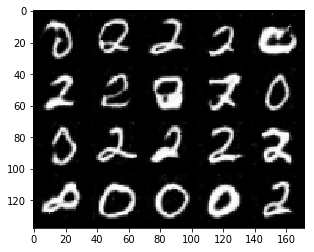

In [17]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)

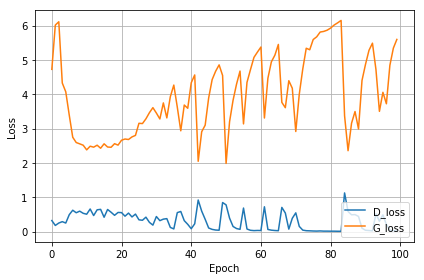

In [18]:
loss_plot(d_loss_hist, g_loss_hist)

可以看到,DCGAN的生成图片质量比起只有线性层的GAN要好不少.接下来,让我们尝试使用家具数据集来训练DCGAN.

Epoch 0: Train D loss: 0.9965, G loss: 3.3849


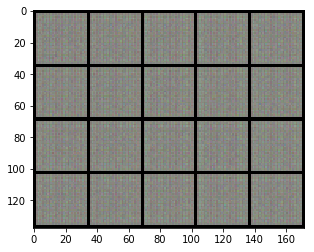

Epoch 1: Train D loss: 0.4249, G loss: 5.5040
Epoch 2: Train D loss: 0.2809, G loss: 5.7402
Epoch 3: Train D loss: 0.1379, G loss: 5.5478
Epoch 4: Train D loss: 0.1522, G loss: 6.2912
Epoch 5: Train D loss: 0.3872, G loss: 8.0916
Epoch 6: Train D loss: 0.2268, G loss: 6.3470
Epoch 7: Train D loss: 0.1678, G loss: 4.3354
Epoch 8: Train D loss: 0.1809, G loss: 4.9580
Epoch 9: Train D loss: 0.3061, G loss: 4.1514


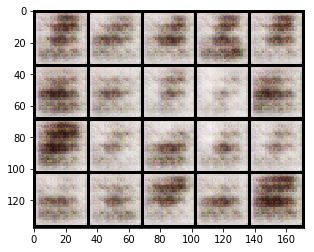

Epoch 10: Train D loss: 0.7118, G loss: 3.3499
Epoch 11: Train D loss: 0.3862, G loss: 3.9444
Epoch 12: Train D loss: 0.3548, G loss: 3.8860
Epoch 13: Train D loss: 0.4859, G loss: 4.6667
Epoch 14: Train D loss: 0.3545, G loss: 3.9033
Epoch 15: Train D loss: 0.4211, G loss: 4.3634
Epoch 16: Train D loss: 0.3695, G loss: 4.3244
Epoch 17: Train D loss: 0.3579, G loss: 4.4515
Epoch 18: Train D loss: 0.1793, G loss: 4.9019
Epoch 19: Train D loss: 0.7716, G loss: 5.4315


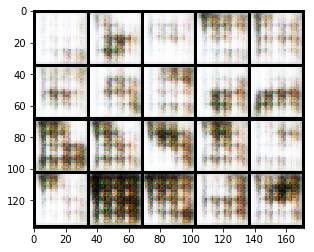

Epoch 20: Train D loss: 0.2309, G loss: 4.4065
Epoch 21: Train D loss: 0.3979, G loss: 5.0096
Epoch 22: Train D loss: 0.3045, G loss: 4.5091
Epoch 23: Train D loss: 0.2161, G loss: 5.0936
Epoch 24: Train D loss: 0.2782, G loss: 4.9064
Epoch 25: Train D loss: 0.3399, G loss: 5.1250
Epoch 26: Train D loss: 0.2865, G loss: 4.7641
Epoch 27: Train D loss: 0.1957, G loss: 4.8429
Epoch 28: Train D loss: 0.2067, G loss: 4.9668
Epoch 29: Train D loss: 0.4337, G loss: 5.6196


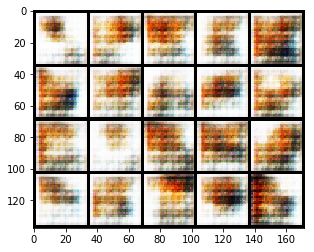

Epoch 30: Train D loss: 0.2092, G loss: 4.7483
Epoch 31: Train D loss: 0.2732, G loss: 5.0657
Epoch 32: Train D loss: 0.3146, G loss: 5.3062
Epoch 33: Train D loss: 0.1797, G loss: 4.6159
Epoch 34: Train D loss: 0.1715, G loss: 4.8662
Epoch 35: Train D loss: 0.1944, G loss: 4.9256
Epoch 36: Train D loss: 0.2309, G loss: 4.9129
Epoch 37: Train D loss: 0.2941, G loss: 6.1703
Epoch 38: Train D loss: 0.2372, G loss: 4.9230
Epoch 39: Train D loss: 0.3156, G loss: 5.2818


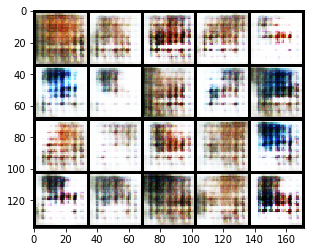

Epoch 40: Train D loss: 0.2608, G loss: 4.8532
Epoch 41: Train D loss: 0.4322, G loss: 4.8707
Epoch 42: Train D loss: 0.5095, G loss: 4.6648
Epoch 43: Train D loss: 0.4904, G loss: 4.5925
Epoch 44: Train D loss: 0.4012, G loss: 4.2638
Epoch 45: Train D loss: 0.3158, G loss: 3.9469
Epoch 46: Train D loss: 0.2733, G loss: 4.1917
Epoch 47: Train D loss: 0.3278, G loss: 4.0048
Epoch 48: Train D loss: 0.2979, G loss: 4.3432
Epoch 49: Train D loss: 0.3206, G loss: 4.5022


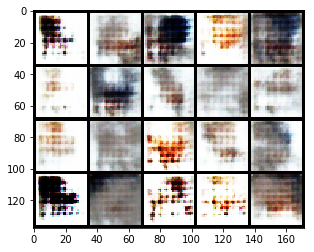

Epoch 50: Train D loss: 0.2877, G loss: 4.3153
Epoch 51: Train D loss: 0.4388, G loss: 4.8336
Epoch 52: Train D loss: 0.2618, G loss: 4.5342
Epoch 53: Train D loss: 0.3749, G loss: 4.2018
Epoch 54: Train D loss: 0.3477, G loss: 4.0697
Epoch 55: Train D loss: 0.3524, G loss: 3.9664
Epoch 56: Train D loss: 0.5117, G loss: 4.4110
Epoch 57: Train D loss: 0.3711, G loss: 4.1350
Epoch 58: Train D loss: 0.2937, G loss: 4.3090
Epoch 59: Train D loss: 0.5763, G loss: 4.2160


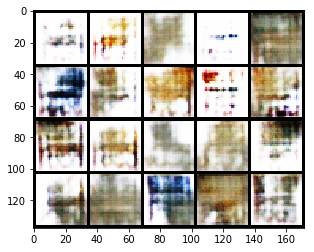

Epoch 60: Train D loss: 0.4369, G loss: 3.6559
Epoch 61: Train D loss: 0.4247, G loss: 3.6632
Epoch 62: Train D loss: 0.4039, G loss: 3.7503
Epoch 63: Train D loss: 0.3288, G loss: 3.5785
Epoch 64: Train D loss: 0.3863, G loss: 3.8629
Epoch 65: Train D loss: 0.5046, G loss: 3.7332
Epoch 66: Train D loss: 0.3753, G loss: 3.5446
Epoch 67: Train D loss: 0.3834, G loss: 3.2344
Epoch 68: Train D loss: 0.3283, G loss: 3.7834
Epoch 69: Train D loss: 0.7656, G loss: 4.0422


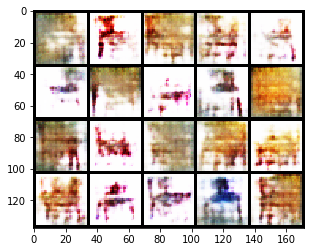

Epoch 70: Train D loss: 0.4830, G loss: 3.4169
Epoch 71: Train D loss: 0.4209, G loss: 3.2260
Epoch 72: Train D loss: 0.5150, G loss: 3.7933
Epoch 73: Train D loss: 0.4358, G loss: 3.3911
Epoch 74: Train D loss: 0.3548, G loss: 3.3214
Epoch 75: Train D loss: 0.4067, G loss: 3.5733
Epoch 76: Train D loss: 0.4351, G loss: 3.4754
Epoch 77: Train D loss: 0.3687, G loss: 3.3136
Epoch 78: Train D loss: 0.3271, G loss: 3.6169
Epoch 79: Train D loss: 0.5284, G loss: 3.3592


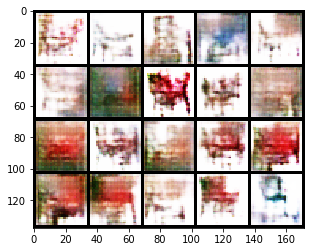

Epoch 80: Train D loss: 0.4993, G loss: 3.7155
Epoch 81: Train D loss: 0.3759, G loss: 3.5506
Epoch 82: Train D loss: 0.4336, G loss: 3.3854
Epoch 83: Train D loss: 0.4854, G loss: 3.4448
Epoch 84: Train D loss: 0.3922, G loss: 3.2051
Epoch 85: Train D loss: 0.3369, G loss: 3.3405
Epoch 86: Train D loss: 0.3717, G loss: 3.3838
Epoch 87: Train D loss: 0.3000, G loss: 3.4414
Epoch 88: Train D loss: 0.3881, G loss: 3.3428
Epoch 89: Train D loss: 0.3854, G loss: 3.3741


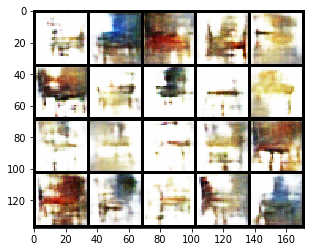

Epoch 90: Train D loss: 0.5037, G loss: 3.3532
Epoch 91: Train D loss: 0.3966, G loss: 3.1212
Epoch 92: Train D loss: 0.3255, G loss: 3.0081
Epoch 93: Train D loss: 0.4297, G loss: 3.2165
Epoch 94: Train D loss: 0.4732, G loss: 3.2395
Epoch 95: Train D loss: 0.3366, G loss: 3.2177
Epoch 96: Train D loss: 0.3817, G loss: 3.2048
Epoch 97: Train D loss: 0.2978, G loss: 3.1895
Epoch 98: Train D loss: 0.3772, G loss: 3.0596
Epoch 99: Train D loss: 0.4604, G loss: 3.3245


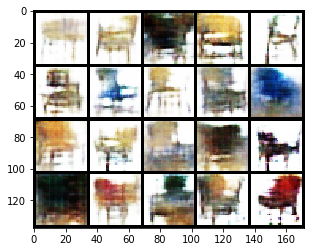

Epoch 100: Train D loss: 0.5318, G loss: 3.3493
Epoch 101: Train D loss: 0.3665, G loss: 3.1120
Epoch 102: Train D loss: 0.3948, G loss: 3.1728
Epoch 103: Train D loss: 0.3019, G loss: 3.2033
Epoch 104: Train D loss: 0.3470, G loss: 2.9921
Epoch 105: Train D loss: 0.3155, G loss: 3.1544
Epoch 106: Train D loss: 0.5837, G loss: 3.4376
Epoch 107: Train D loss: 0.4074, G loss: 2.9974
Epoch 108: Train D loss: 0.4013, G loss: 3.0250
Epoch 109: Train D loss: 0.3004, G loss: 3.0884


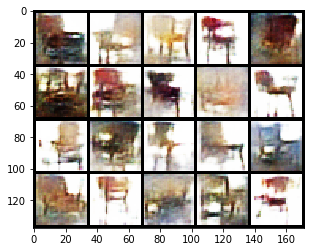

Epoch 110: Train D loss: 0.3056, G loss: 2.9258
Epoch 111: Train D loss: 0.6537, G loss: 3.3207
Epoch 112: Train D loss: 0.3423, G loss: 3.1227
Epoch 113: Train D loss: 0.2845, G loss: 3.0503
Epoch 114: Train D loss: 0.4383, G loss: 3.2220
Epoch 115: Train D loss: 0.2883, G loss: 3.1523
Epoch 116: Train D loss: 0.3682, G loss: 3.2808
Epoch 117: Train D loss: 0.3270, G loss: 3.1801
Epoch 118: Train D loss: 0.5668, G loss: 3.2102
Epoch 119: Train D loss: 0.4169, G loss: 3.1439


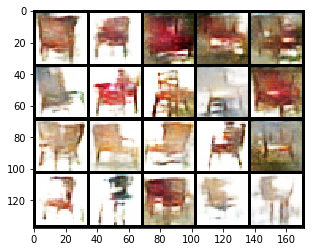

Epoch 120: Train D loss: 0.3468, G loss: 3.1240
Epoch 121: Train D loss: 0.3673, G loss: 3.2750
Epoch 122: Train D loss: 0.4562, G loss: 3.2357
Epoch 123: Train D loss: 0.3216, G loss: 3.0801
Epoch 124: Train D loss: 0.3524, G loss: 3.3259
Epoch 125: Train D loss: 0.3253, G loss: 3.1764
Epoch 126: Train D loss: 0.3035, G loss: 3.1843
Epoch 127: Train D loss: 0.2590, G loss: 3.2706
Epoch 128: Train D loss: 0.2878, G loss: 3.1389
Epoch 129: Train D loss: 0.3039, G loss: 3.3178


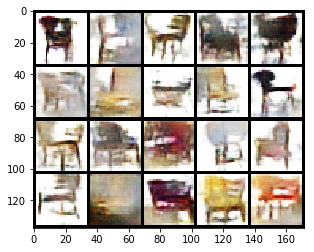

Epoch 130: Train D loss: 0.5389, G loss: 3.4502
Epoch 131: Train D loss: 0.7129, G loss: 3.5434
Epoch 132: Train D loss: 0.4620, G loss: 3.3384
Epoch 133: Train D loss: 0.3444, G loss: 3.1293
Epoch 134: Train D loss: 0.2995, G loss: 3.0954
Epoch 135: Train D loss: 0.2426, G loss: 3.1160
Epoch 136: Train D loss: 0.2300, G loss: 3.1701
Epoch 137: Train D loss: 0.2466, G loss: 3.3142
Epoch 138: Train D loss: 0.2868, G loss: 3.2530
Epoch 139: Train D loss: 0.3439, G loss: 3.1910


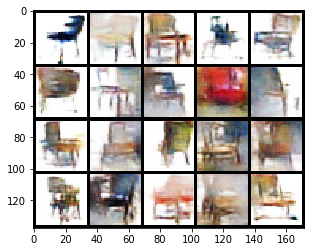

Epoch 140: Train D loss: 0.3393, G loss: 3.4079
Epoch 141: Train D loss: 0.2793, G loss: 3.2082
Epoch 142: Train D loss: 0.2364, G loss: 3.2603
Epoch 143: Train D loss: 0.4014, G loss: 3.4371
Epoch 144: Train D loss: 0.3308, G loss: 3.4729
Epoch 145: Train D loss: 0.3032, G loss: 3.3421
Epoch 146: Train D loss: 0.2289, G loss: 3.3506
Epoch 147: Train D loss: 0.5017, G loss: 3.7361
Epoch 148: Train D loss: 0.3361, G loss: 3.2110
Epoch 149: Train D loss: 0.2383, G loss: 3.4180


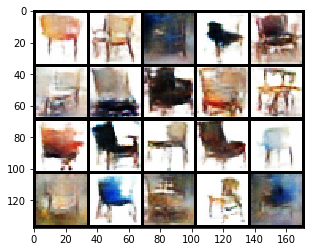

Epoch 150: Train D loss: 0.2259, G loss: 3.3659
Epoch 151: Train D loss: 0.2040, G loss: 3.4089
Epoch 152: Train D loss: 0.1834, G loss: 3.4359
Epoch 153: Train D loss: 0.2141, G loss: 3.5264
Epoch 154: Train D loss: 0.2296, G loss: 3.5255
Epoch 155: Train D loss: 0.2069, G loss: 3.4768
Epoch 156: Train D loss: 0.1810, G loss: 3.4350
Epoch 157: Train D loss: 0.2220, G loss: 3.4611
Epoch 158: Train D loss: 0.1981, G loss: 3.4735
Epoch 159: Train D loss: 0.8680, G loss: 3.9238


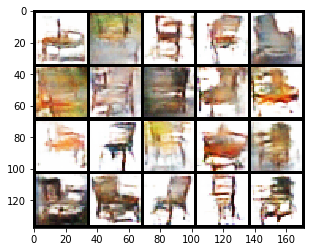

Epoch 160: Train D loss: 0.5980, G loss: 3.6794
Epoch 161: Train D loss: 0.3088, G loss: 3.2831
Epoch 162: Train D loss: 0.2197, G loss: 3.4027
Epoch 163: Train D loss: 0.1910, G loss: 3.4061
Epoch 164: Train D loss: 0.1822, G loss: 3.4528
Epoch 165: Train D loss: 0.1451, G loss: 3.6467
Epoch 166: Train D loss: 0.1540, G loss: 3.5034
Epoch 167: Train D loss: 0.1614, G loss: 3.6017
Epoch 168: Train D loss: 0.1633, G loss: 3.6381
Epoch 169: Train D loss: 0.1537, G loss: 3.5452


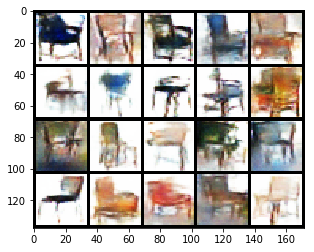

Epoch 170: Train D loss: 0.2020, G loss: 3.6412
Epoch 171: Train D loss: 0.2481, G loss: 3.8216
Epoch 172: Train D loss: 0.2411, G loss: 3.7143
Epoch 173: Train D loss: 0.1679, G loss: 3.8030
Epoch 174: Train D loss: 0.1800, G loss: 3.7512
Epoch 175: Train D loss: 0.1670, G loss: 3.8365
Epoch 176: Train D loss: 0.1464, G loss: 3.6118
Epoch 177: Train D loss: 0.1342, G loss: 3.8322
Epoch 178: Train D loss: 0.1388, G loss: 3.6889
Epoch 179: Train D loss: 1.3642, G loss: 4.7925


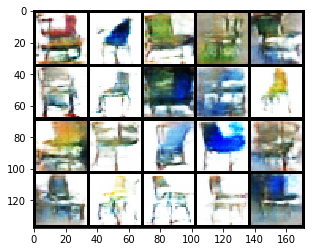

Epoch 180: Train D loss: 0.6286, G loss: 3.9709
Epoch 181: Train D loss: 0.2734, G loss: 3.5045
Epoch 182: Train D loss: 0.2294, G loss: 3.4439
Epoch 183: Train D loss: 0.1612, G loss: 3.5291
Epoch 184: Train D loss: 0.1586, G loss: 3.5079
Epoch 185: Train D loss: 0.1315, G loss: 3.5712
Epoch 186: Train D loss: 0.1204, G loss: 3.6386
Epoch 187: Train D loss: 0.1165, G loss: 3.6987
Epoch 188: Train D loss: 0.1271, G loss: 3.6645
Epoch 189: Train D loss: 0.1138, G loss: 3.7950


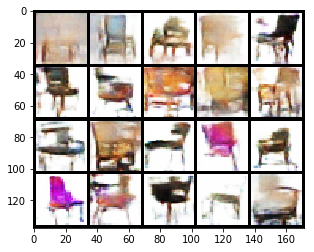

Epoch 190: Train D loss: 0.1170, G loss: 3.6208
Epoch 191: Train D loss: 0.1065, G loss: 3.7746
Epoch 192: Train D loss: 0.1098, G loss: 3.7203
Epoch 193: Train D loss: 0.1076, G loss: 3.9487
Epoch 194: Train D loss: 0.1566, G loss: 3.9021
Epoch 195: Train D loss: 0.1075, G loss: 3.8509
Epoch 196: Train D loss: 0.1081, G loss: 3.8187
Epoch 197: Train D loss: 0.1087, G loss: 4.0784
Epoch 198: Train D loss: 0.1255, G loss: 4.1770
Epoch 199: Train D loss: 0.1214, G loss: 4.0072


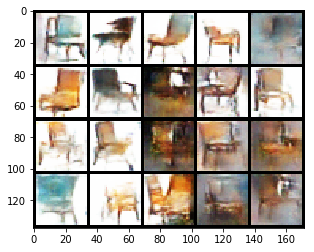

Epoch 200: Train D loss: 0.1677, G loss: 4.1505
Epoch 201: Train D loss: 0.1460, G loss: 4.0117
Epoch 202: Train D loss: 0.1148, G loss: 4.2078
Epoch 203: Train D loss: 0.1392, G loss: 4.0922
Epoch 204: Train D loss: 0.0938, G loss: 4.0224
Epoch 205: Train D loss: 0.0960, G loss: 4.1735
Epoch 206: Train D loss: 0.1655, G loss: 4.0946
Epoch 207: Train D loss: 2.1034, G loss: 4.6550
Epoch 208: Train D loss: 0.6331, G loss: 3.9500
Epoch 209: Train D loss: 0.3075, G loss: 3.6975


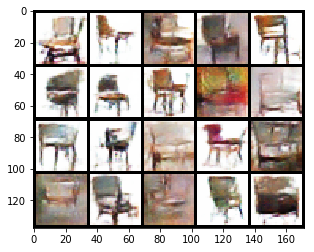

Epoch 210: Train D loss: 0.2336, G loss: 3.4638
Epoch 211: Train D loss: 0.1621, G loss: 3.6301
Epoch 212: Train D loss: 0.1409, G loss: 3.6855
Epoch 213: Train D loss: 0.1146, G loss: 3.7153
Epoch 214: Train D loss: 0.1061, G loss: 3.7167
Epoch 215: Train D loss: 0.1068, G loss: 3.7383
Epoch 216: Train D loss: 0.1061, G loss: 3.7437
Epoch 217: Train D loss: 0.1326, G loss: 3.9191
Epoch 218: Train D loss: 0.0948, G loss: 3.9294
Epoch 219: Train D loss: 0.0935, G loss: 3.9209


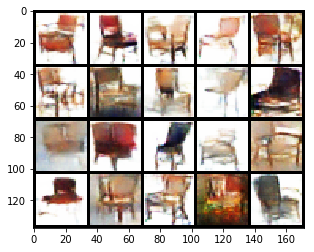

Epoch 220: Train D loss: 0.0893, G loss: 4.0151
Epoch 221: Train D loss: 0.0776, G loss: 3.9810
Epoch 222: Train D loss: 0.0825, G loss: 4.0968
Epoch 223: Train D loss: 0.0931, G loss: 4.1459
Epoch 224: Train D loss: 0.0844, G loss: 4.0754
Epoch 225: Train D loss: 0.0784, G loss: 4.0832
Epoch 226: Train D loss: 0.0691, G loss: 4.0990
Epoch 227: Train D loss: 0.0762, G loss: 4.1048
Epoch 228: Train D loss: 0.0899, G loss: 4.1619
Epoch 229: Train D loss: 0.0716, G loss: 4.1773


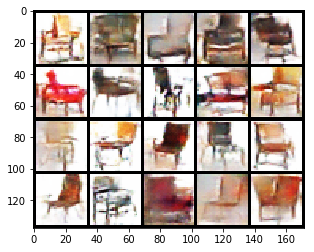

Epoch 230: Train D loss: 0.0803, G loss: 4.1449
Epoch 231: Train D loss: 0.0687, G loss: 4.1348
Epoch 232: Train D loss: 0.0777, G loss: 4.2184
Epoch 233: Train D loss: 0.0669, G loss: 4.2840
Epoch 234: Train D loss: 0.0730, G loss: 4.2908
Epoch 235: Train D loss: 0.1115, G loss: 4.2897
Epoch 236: Train D loss: 1.5687, G loss: 4.9649
Epoch 237: Train D loss: 1.2929, G loss: 4.1701
Epoch 238: Train D loss: 0.3952, G loss: 3.7750
Epoch 239: Train D loss: 0.2215, G loss: 3.6679


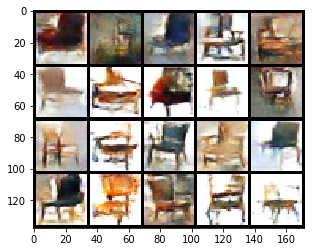

Epoch 240: Train D loss: 0.1697, G loss: 3.6106
Epoch 241: Train D loss: 0.1270, G loss: 3.7309
Epoch 242: Train D loss: 0.1103, G loss: 3.7376
Epoch 243: Train D loss: 0.1099, G loss: 3.8043
Epoch 244: Train D loss: 0.0931, G loss: 3.9399
Epoch 245: Train D loss: 0.0912, G loss: 3.8747
Epoch 246: Train D loss: 0.0958, G loss: 3.9645
Epoch 247: Train D loss: 0.0737, G loss: 4.0470
Epoch 248: Train D loss: 0.0792, G loss: 4.0791
Epoch 249: Train D loss: 0.0894, G loss: 4.3926


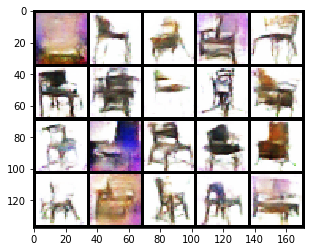

Epoch 250: Train D loss: 0.0831, G loss: 4.3188
Epoch 251: Train D loss: 0.0652, G loss: 4.2579
Epoch 252: Train D loss: 0.0671, G loss: 4.1920
Epoch 253: Train D loss: 0.0606, G loss: 4.2388
Epoch 254: Train D loss: 0.0650, G loss: 4.2437
Epoch 255: Train D loss: 0.0586, G loss: 4.2517
Epoch 256: Train D loss: 0.0534, G loss: 4.3321
Epoch 257: Train D loss: 0.0606, G loss: 4.3273
Epoch 258: Train D loss: 0.0565, G loss: 4.3576
Epoch 259: Train D loss: 0.0565, G loss: 4.3937


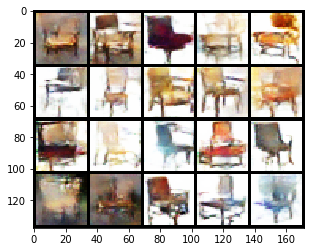

Epoch 260: Train D loss: 0.0495, G loss: 4.3930
Epoch 261: Train D loss: 0.0624, G loss: 4.4263
Epoch 262: Train D loss: 0.0669, G loss: 4.3615
Epoch 263: Train D loss: 0.0588, G loss: 4.4788
Epoch 264: Train D loss: 0.0537, G loss: 4.4045
Epoch 265: Train D loss: 0.0492, G loss: 4.5076
Epoch 266: Train D loss: 0.0466, G loss: 4.4984
Epoch 267: Train D loss: 0.0489, G loss: 4.5945
Epoch 268: Train D loss: 0.0485, G loss: 4.5357
Epoch 269: Train D loss: 0.0494, G loss: 4.5661


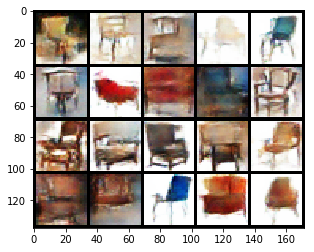

Epoch 270: Train D loss: 0.0467, G loss: 4.5513
Epoch 271: Train D loss: 0.0420, G loss: 4.7658
Epoch 272: Train D loss: 0.0539, G loss: 4.5850
Epoch 273: Train D loss: 0.0461, G loss: 4.5897
Epoch 274: Train D loss: 0.0474, G loss: 4.6532
Epoch 275: Train D loss: 0.0424, G loss: 4.6234
Epoch 276: Train D loss: 0.0553, G loss: 4.6962
Epoch 277: Train D loss: 0.0463, G loss: 4.8206
Epoch 278: Train D loss: 0.0492, G loss: 4.6357
Epoch 279: Train D loss: 0.0534, G loss: 4.8957


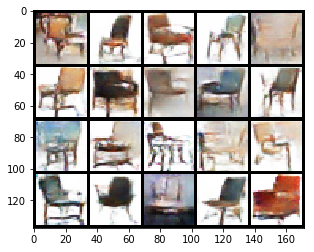

Epoch 280: Train D loss: 0.0562, G loss: 4.7896
Epoch 281: Train D loss: 0.0434, G loss: 4.7825
Epoch 282: Train D loss: 0.0374, G loss: 4.8048
Epoch 283: Train D loss: 0.0371, G loss: 4.8485
Epoch 284: Train D loss: 1.0105, G loss: 5.7566
Epoch 285: Train D loss: 2.1146, G loss: 4.0435
Epoch 286: Train D loss: 0.6788, G loss: 4.0750
Epoch 287: Train D loss: 0.3525, G loss: 4.0985
Epoch 288: Train D loss: 0.2120, G loss: 4.0233
Epoch 289: Train D loss: 0.1368, G loss: 3.8784


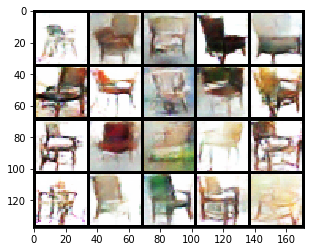

Epoch 290: Train D loss: 0.1036, G loss: 3.8488
Epoch 291: Train D loss: 0.0888, G loss: 4.0124
Epoch 292: Train D loss: 0.0765, G loss: 4.0735
Epoch 293: Train D loss: 0.0673, G loss: 4.1030
Epoch 294: Train D loss: 0.0679, G loss: 4.1199
Epoch 295: Train D loss: 0.0729, G loss: 4.4981
Epoch 296: Train D loss: 0.0613, G loss: 4.2994
Epoch 297: Train D loss: 0.0561, G loss: 4.3539
Epoch 298: Train D loss: 0.0510, G loss: 4.4653
Epoch 299: Train D loss: 0.0526, G loss: 4.4593


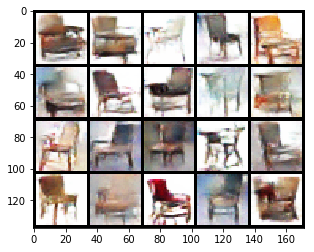

In [13]:
# RGB image channel = 3
image_channel=3

# epochs
n_epochs = 300
batch_size = 32
image_size=32
latent_dim = 100

device = torch.device('cuda:2')

learning_rate = 0.0002
betas = (0.5, 0.999)

bceloss = nn.BCELoss().to(device)

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)

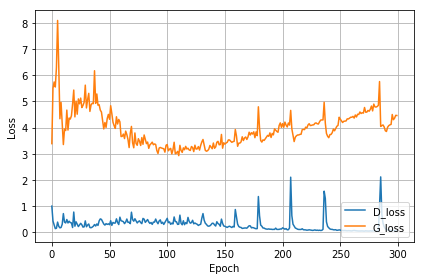

In [14]:
loss_plot(d_loss_hist, g_loss_hist)

## LSGAN

LSGAN(Least Squares GAN)将loss函数改为了 L2损失.G和D的优化目标如下图所示,
![lsgan](pictures/lsgan.png)
#### **作业**: 
在这里,请在下方补充L2Loss的代码来实现L2损失来优化上面的目标.并使用这个loss函数在mnist数据集上训练LSGAN,并显示训练的效果图片及loss变化曲线.

提示:忽略上图的1/2.L2损失即MSEloss(均方误差),传入两个参数input_是指判别器D预测为"真实"的概率值(size为batch_size\*1),target为标签1或0(size为batch_size\*1).只允许使用pytorch和python的运算实现(不能直接调用MSEloss)

In [12]:
class L2Loss(nn.Module):
    def __init__(self):
        super(L2Loss, self).__init__()
    
    def forward(self, input_, target):
        """
        input_: (batch_size*1) 
        target: (batch_size*1) labels, 1 or 0
        """
        return ((input_ - target) ** 2).mean()

完成上方代码后,使用所写的L2Loss在mnist数据集上训练DCGAN.

In [28]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:2')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use L2Loss as loss function
l2loss = L2Loss().to(device)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 0.0792, G loss: 0.9552


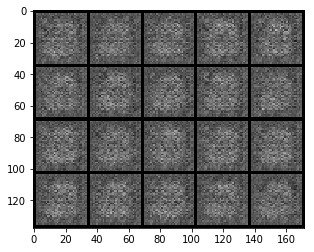

Epoch 1: Train D loss: 0.0761, G loss: 0.8860
Epoch 2: Train D loss: 1.0000, G loss: 0.0000
Epoch 3: Train D loss: 1.0000, G loss: 0.0000
Epoch 4: Train D loss: 0.9999, G loss: 0.0000
Epoch 5: Train D loss: 0.8241, G loss: 0.2198
Epoch 6: Train D loss: 0.0081, G loss: 0.9991
Epoch 7: Train D loss: 0.0173, G loss: 0.9992
Epoch 8: Train D loss: 0.0002, G loss: 1.0000
Epoch 9: Train D loss: 0.0001, G loss: 1.0000


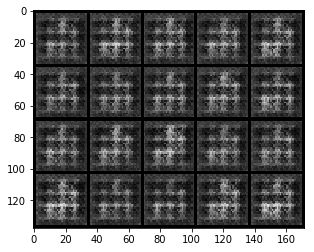

Epoch 10: Train D loss: 0.0000, G loss: 1.0000
Epoch 11: Train D loss: 0.0000, G loss: 1.0000
Epoch 12: Train D loss: 0.0000, G loss: 1.0000
Epoch 13: Train D loss: 0.0000, G loss: 0.9996
Epoch 14: Train D loss: 0.1640, G loss: 0.8817
Epoch 15: Train D loss: 0.2293, G loss: 0.8047
Epoch 16: Train D loss: 0.0001, G loss: 0.9999
Epoch 17: Train D loss: 0.0000, G loss: 0.9999
Epoch 18: Train D loss: 0.0000, G loss: 0.9998
Epoch 19: Train D loss: 0.0788, G loss: 0.9959


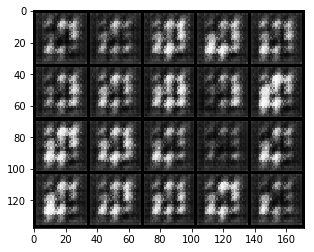

Epoch 20: Train D loss: 0.1295, G loss: 0.9489
Epoch 21: Train D loss: 0.3516, G loss: 0.7752
Epoch 22: Train D loss: 0.2989, G loss: 0.6882
Epoch 23: Train D loss: 0.2181, G loss: 0.6977
Epoch 24: Train D loss: 0.2503, G loss: 0.6582
Epoch 25: Train D loss: 0.2526, G loss: 0.6364
Epoch 26: Train D loss: 0.2556, G loss: 0.6645
Epoch 27: Train D loss: 0.2294, G loss: 0.6569
Epoch 28: Train D loss: 0.2063, G loss: 0.6587
Epoch 29: Train D loss: 0.1932, G loss: 0.6653


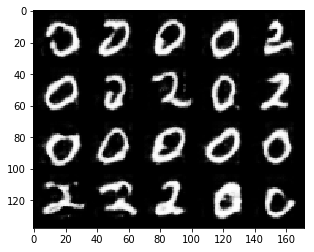

Epoch 30: Train D loss: 0.2089, G loss: 0.6739
Epoch 31: Train D loss: 0.2034, G loss: 0.6720
Epoch 32: Train D loss: 0.1694, G loss: 0.6983
Epoch 33: Train D loss: 0.1686, G loss: 0.6981
Epoch 34: Train D loss: 0.1360, G loss: 0.7231
Epoch 35: Train D loss: 0.1468, G loss: 0.7370
Epoch 36: Train D loss: 0.1068, G loss: 0.7645
Epoch 37: Train D loss: 0.1064, G loss: 0.7735
Epoch 38: Train D loss: 0.1187, G loss: 0.7803
Epoch 39: Train D loss: 0.0689, G loss: 0.8172


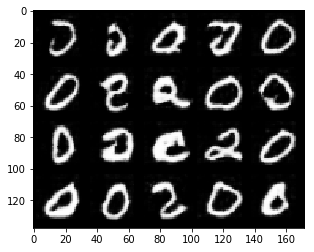

Epoch 40: Train D loss: 0.0860, G loss: 0.8155
Epoch 41: Train D loss: 0.1063, G loss: 0.8023
Epoch 42: Train D loss: 0.0666, G loss: 0.8388
Epoch 43: Train D loss: 0.0488, G loss: 0.8565
Epoch 44: Train D loss: 0.0517, G loss: 0.8600
Epoch 45: Train D loss: 0.0239, G loss: 0.8901
Epoch 46: Train D loss: 0.0797, G loss: 0.8543
Epoch 47: Train D loss: 0.0256, G loss: 0.8896
Epoch 48: Train D loss: 0.0685, G loss: 0.8822
Epoch 49: Train D loss: 0.0434, G loss: 0.8887


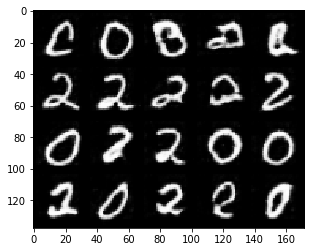

Epoch 50: Train D loss: 0.0129, G loss: 0.9149
Epoch 51: Train D loss: 0.0907, G loss: 0.8835
Epoch 52: Train D loss: 0.0272, G loss: 0.9073
Epoch 53: Train D loss: 0.0102, G loss: 0.9253
Epoch 54: Train D loss: 0.0852, G loss: 0.8783
Epoch 55: Train D loss: 0.0109, G loss: 0.9255
Epoch 56: Train D loss: 0.0080, G loss: 0.9368
Epoch 57: Train D loss: 0.0064, G loss: 0.9362
Epoch 58: Train D loss: 0.0068, G loss: 0.9424
Epoch 59: Train D loss: 0.1327, G loss: 0.8652


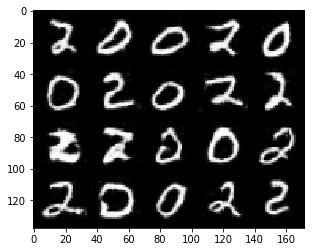

Epoch 60: Train D loss: 0.0821, G loss: 0.8842
Epoch 61: Train D loss: 0.0115, G loss: 0.9241
Epoch 62: Train D loss: 0.0064, G loss: 0.9368
Epoch 63: Train D loss: 0.0496, G loss: 0.9322
Epoch 64: Train D loss: 0.1667, G loss: 0.8623
Epoch 65: Train D loss: 0.0112, G loss: 0.9274
Epoch 66: Train D loss: 0.0062, G loss: 0.9402
Epoch 67: Train D loss: 0.1001, G loss: 0.9073
Epoch 68: Train D loss: 0.0088, G loss: 0.9298
Epoch 69: Train D loss: 0.0104, G loss: 0.9417


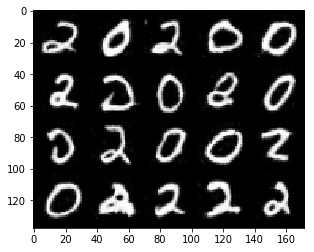

Epoch 70: Train D loss: 0.0049, G loss: 0.9551
Epoch 71: Train D loss: 0.9566, G loss: 0.9879
Epoch 72: Train D loss: 0.9999, G loss: 1.0000
Epoch 73: Train D loss: 0.9993, G loss: 1.0000
Epoch 74: Train D loss: 0.1383, G loss: 0.9253
Epoch 75: Train D loss: 0.0773, G loss: 0.9196
Epoch 76: Train D loss: 0.0077, G loss: 0.9445
Epoch 77: Train D loss: 0.0051, G loss: 0.9483
Epoch 78: Train D loss: 0.0043, G loss: 0.9553
Epoch 79: Train D loss: 0.0032, G loss: 0.9592


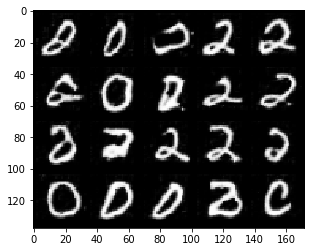

Epoch 80: Train D loss: 0.0023, G loss: 0.9640
Epoch 81: Train D loss: 0.0021, G loss: 0.9662
Epoch 82: Train D loss: 0.0023, G loss: 0.9649
Epoch 83: Train D loss: 0.0017, G loss: 0.9673
Epoch 84: Train D loss: 0.0017, G loss: 0.9673
Epoch 85: Train D loss: 0.0020, G loss: 0.9701
Epoch 86: Train D loss: 0.0010, G loss: 0.9915
Epoch 87: Train D loss: 0.0000, G loss: 1.0000
Epoch 88: Train D loss: 0.0000, G loss: 1.0000
Epoch 89: Train D loss: 0.0000, G loss: 1.0000


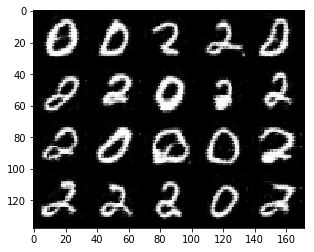

Epoch 90: Train D loss: 0.0000, G loss: 1.0000
Epoch 91: Train D loss: 0.0000, G loss: 1.0000
Epoch 92: Train D loss: 0.0000, G loss: 1.0000
Epoch 93: Train D loss: 0.0000, G loss: 1.0000
Epoch 94: Train D loss: 0.0000, G loss: 1.0000
Epoch 95: Train D loss: 0.0000, G loss: 1.0000
Epoch 96: Train D loss: 0.0000, G loss: 1.0000
Epoch 97: Train D loss: 0.0000, G loss: 1.0000
Epoch 98: Train D loss: 0.0000, G loss: 1.0000
Epoch 99: Train D loss: 0.0000, G loss: 1.0000


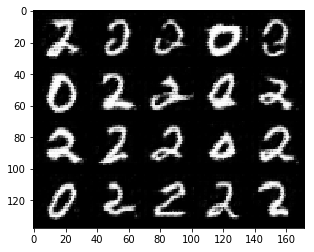

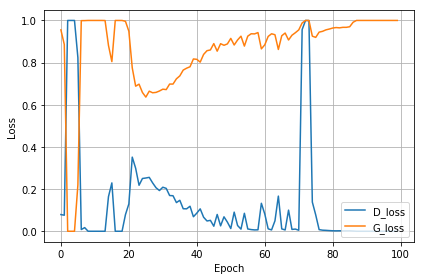

In [29]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, l2loss, n_epochs, device, 
                                   latent_dim)
loss_plot(d_loss_hist, g_loss_hist)

## WGAN

GAN依然存在着训练不稳定,模式崩溃(collapse mode,可以理解为生成的图片多样性极低)的问题(我们的数据集不一定能体现出来).WGAN(Wasserstein GAN)将传统GAN中拟合的JS散度改为Wasserstein距离.WGAN一定程度上解决了GAN训练不稳定以及模式奔溃的问题.

WGAN的判别器的优化目标变为,在满足Lipschitz连续的条件(我们可以限制w不超过某个范围来满足)下,最大化
![1](pictures/wgan1.png)
而它会近似于真实分布与生成分布之间的Wasserstein距离.所以我们D和G的loss函数变为:
![1](pictures/wgan3.png) ![1](pictures/wgan2.png)


具体到在实现上,WGAN主要有3点改变:
- 判别器D最后一层去掉sigmoid
- 生成器G和判别器的loss不使用log
- 每次更新判别器D后,将参数的绝对值截断到某一个固定常数c

所以我们主要重写了WGAN的训练函数,在这里,网络结构使用*去除Sigmoid的DCGAN*(注意初始化D时将sigmoid设置为False来去掉最后一层sigmoid).

下面是WGAN的代码实现.加入了两个参数,n_d表示每训练一次G训练D的次数,weight_clip表示截断的常数.


In [13]:
def wgan_train(trainloader, G, D, G_optimizer, D_optimizer, device, z_dim, n_d=2, weight_clip=0.01):
    
    """
    n_d: the number of iterations of D update per G update iteration
    weight_clip: the clipping parameters
    """
    
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    for i, (x, _) in enumerate(trainloader):
        
        x = x.to(device)
        
        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = - d_real.mean()
        
        # D fake loss from fake images generated by G
        z = torch.rand(x.size(0), z_dim).to(device)
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = d_fake.mean()
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        D_optimizer.step()
        
        # D weight clip
        for params in D.parameters():
            params.data.clamp_(-weight_clip, weight_clip)
            
        D_total_loss += d_loss.item()

        # update G network
        if (i + 1) % n_d == 0:
            # G optimizer zero grads
            G_optimizer.zero_grad()

            # G loss
            g_z = G(z)
            d_fake = D(g_z)
            g_loss = - d_fake.mean()

            # G backward and step
            g_loss.backward()
            G_optimizer.step()
            
            G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss * n_d / len(trainloader)

In [14]:
def run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, latent_dim, n_d, weight_clip):
    d_loss_hist = []
    g_loss_hist = []

    for epoch in range(n_epochs):
        d_loss, g_loss = wgan_train(trainloader, G, D, G_optimizer, D_optimizer, device, 
                               z_dim=latent_dim, n_d=n_d, weight_clip=weight_clip)
        print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))

        d_loss_hist.append(d_loss)
        g_loss_hist.append(g_loss)

        if epoch == 0 or (epoch + 1) % 10 == 0:
            visualize_results(G, device, latent_dim) 
    
    return d_loss_hist, g_loss_hist

接下来让我们使用写好的run_wgan来跑我们的家具(椅子)数据集,看看效果如何.

In [17]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# n_d: the number of iterations of D update per G update iteration
n_d = 2
weight_clip=0.01

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:2')

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

Epoch 0: Train D loss: 0.0086, G loss: -0.0016


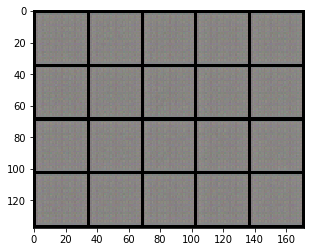

Epoch 1: Train D loss: -0.0439, G loss: 0.0091
Epoch 2: Train D loss: -0.0793, G loss: 0.0493
Epoch 3: Train D loss: -0.1603, G loss: 0.1285
Epoch 4: Train D loss: -0.2963, G loss: 0.2213
Epoch 5: Train D loss: -0.4923, G loss: 0.2992
Epoch 6: Train D loss: -0.6385, G loss: 0.3700
Epoch 7: Train D loss: -0.7560, G loss: 0.4334
Epoch 8: Train D loss: -0.5420, G loss: 0.3846
Epoch 9: Train D loss: -0.4815, G loss: 0.3637


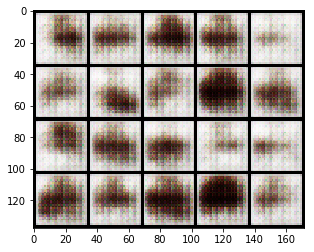

Epoch 10: Train D loss: -0.5624, G loss: 0.4022
Epoch 11: Train D loss: -0.6519, G loss: 0.4529
Epoch 12: Train D loss: -0.5694, G loss: 0.4252
Epoch 13: Train D loss: -0.6211, G loss: 0.4418
Epoch 14: Train D loss: -0.5560, G loss: 0.4356
Epoch 15: Train D loss: -0.5820, G loss: 0.4417
Epoch 16: Train D loss: -0.6913, G loss: 0.4823
Epoch 17: Train D loss: -0.6115, G loss: 0.4245
Epoch 18: Train D loss: -0.5806, G loss: 0.4200
Epoch 19: Train D loss: -0.6346, G loss: 0.4310


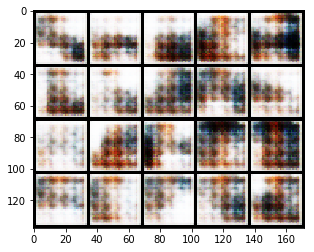

Epoch 20: Train D loss: -0.6303, G loss: 0.4429
Epoch 21: Train D loss: -0.5926, G loss: 0.4423
Epoch 22: Train D loss: -0.5684, G loss: 0.3908
Epoch 23: Train D loss: -0.5902, G loss: 0.4426
Epoch 24: Train D loss: -0.5582, G loss: 0.4026
Epoch 25: Train D loss: -0.5787, G loss: 0.4191
Epoch 26: Train D loss: -0.6160, G loss: 0.3829
Epoch 27: Train D loss: -0.6101, G loss: 0.4052
Epoch 28: Train D loss: -0.5786, G loss: 0.4152
Epoch 29: Train D loss: -0.6302, G loss: 0.4117


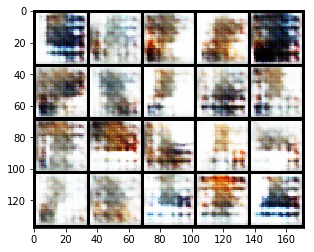

Epoch 30: Train D loss: -0.5761, G loss: 0.4136
Epoch 31: Train D loss: -0.5739, G loss: 0.3834
Epoch 32: Train D loss: -0.5688, G loss: 0.4027
Epoch 33: Train D loss: -0.5668, G loss: 0.3781
Epoch 34: Train D loss: -0.6310, G loss: 0.4284
Epoch 35: Train D loss: -0.5978, G loss: 0.4066
Epoch 36: Train D loss: -0.5484, G loss: 0.3697
Epoch 37: Train D loss: -0.6224, G loss: 0.4158
Epoch 38: Train D loss: -0.5521, G loss: 0.3497
Epoch 39: Train D loss: -0.5914, G loss: 0.3820


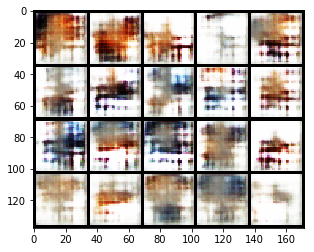

Epoch 40: Train D loss: -0.5571, G loss: 0.3503
Epoch 41: Train D loss: -0.5869, G loss: 0.3717
Epoch 42: Train D loss: -0.5800, G loss: 0.3279
Epoch 43: Train D loss: -0.5668, G loss: 0.3480
Epoch 44: Train D loss: -0.5466, G loss: 0.3379
Epoch 45: Train D loss: -0.6118, G loss: 0.4151
Epoch 46: Train D loss: -0.5861, G loss: 0.3393
Epoch 47: Train D loss: -0.5626, G loss: 0.3533
Epoch 48: Train D loss: -0.4964, G loss: 0.3503
Epoch 49: Train D loss: -0.5559, G loss: 0.3545


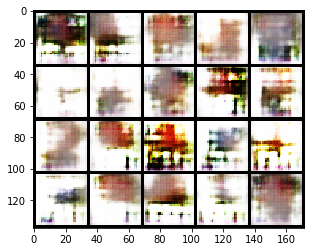

Epoch 50: Train D loss: -0.6292, G loss: 0.3855
Epoch 51: Train D loss: -0.5661, G loss: 0.3316
Epoch 52: Train D loss: -0.5494, G loss: 0.3645
Epoch 53: Train D loss: -0.5822, G loss: 0.3810
Epoch 54: Train D loss: -0.5318, G loss: 0.2861
Epoch 55: Train D loss: -0.5495, G loss: 0.3294
Epoch 56: Train D loss: -0.5673, G loss: 0.2933
Epoch 57: Train D loss: -0.4998, G loss: 0.3163
Epoch 58: Train D loss: -0.4881, G loss: 0.2844
Epoch 59: Train D loss: -0.5538, G loss: 0.3324


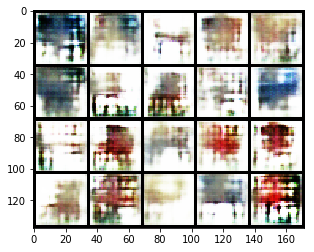

Epoch 60: Train D loss: -0.4937, G loss: 0.3274
Epoch 61: Train D loss: -0.5402, G loss: 0.3217
Epoch 62: Train D loss: -0.4750, G loss: 0.2957
Epoch 63: Train D loss: -0.5081, G loss: 0.3357
Epoch 64: Train D loss: -0.5327, G loss: 0.3122
Epoch 65: Train D loss: -0.5035, G loss: 0.2964
Epoch 66: Train D loss: -0.5443, G loss: 0.3505
Epoch 67: Train D loss: -0.4822, G loss: 0.2769
Epoch 68: Train D loss: -0.5477, G loss: 0.3194
Epoch 69: Train D loss: -0.4999, G loss: 0.2950


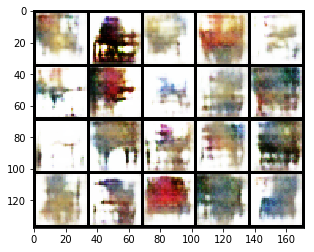

Epoch 70: Train D loss: -0.5373, G loss: 0.3038
Epoch 71: Train D loss: -0.5238, G loss: 0.3508
Epoch 72: Train D loss: -0.5346, G loss: 0.3067
Epoch 73: Train D loss: -0.5063, G loss: 0.2787
Epoch 74: Train D loss: -0.5822, G loss: 0.3429
Epoch 75: Train D loss: -0.4799, G loss: 0.2733
Epoch 76: Train D loss: -0.5045, G loss: 0.2984
Epoch 77: Train D loss: -0.4948, G loss: 0.2451
Epoch 78: Train D loss: -0.5059, G loss: 0.2761
Epoch 79: Train D loss: -0.4814, G loss: 0.2725


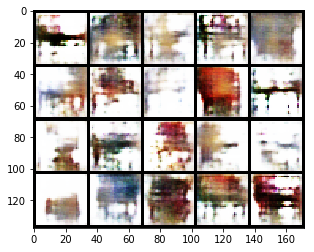

Epoch 80: Train D loss: -0.5037, G loss: 0.2803
Epoch 81: Train D loss: -0.5205, G loss: 0.2853
Epoch 82: Train D loss: -0.4894, G loss: 0.2705
Epoch 83: Train D loss: -0.4937, G loss: 0.2730
Epoch 84: Train D loss: -0.5402, G loss: 0.2990
Epoch 85: Train D loss: -0.4788, G loss: 0.3067
Epoch 86: Train D loss: -0.4757, G loss: 0.3156
Epoch 87: Train D loss: -0.4705, G loss: 0.2741
Epoch 88: Train D loss: -0.4522, G loss: 0.2834
Epoch 89: Train D loss: -0.5483, G loss: 0.3414


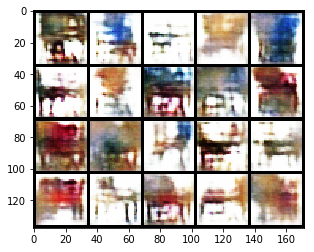

Epoch 90: Train D loss: -0.4213, G loss: 0.2541
Epoch 91: Train D loss: -0.4989, G loss: 0.3177
Epoch 92: Train D loss: -0.4785, G loss: 0.2655
Epoch 93: Train D loss: -0.4878, G loss: 0.3199
Epoch 94: Train D loss: -0.4855, G loss: 0.3221
Epoch 95: Train D loss: -0.4722, G loss: 0.2869
Epoch 96: Train D loss: -0.4695, G loss: 0.2645
Epoch 97: Train D loss: -0.4702, G loss: 0.2370
Epoch 98: Train D loss: -0.4784, G loss: 0.2292
Epoch 99: Train D loss: -0.4963, G loss: 0.2859


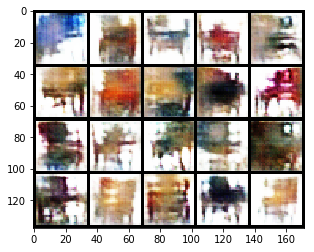

Epoch 100: Train D loss: -0.4614, G loss: 0.2886
Epoch 101: Train D loss: -0.4984, G loss: 0.2991
Epoch 102: Train D loss: -0.4715, G loss: 0.3327
Epoch 103: Train D loss: -0.4805, G loss: 0.3294
Epoch 104: Train D loss: -0.4884, G loss: 0.2752
Epoch 105: Train D loss: -0.4717, G loss: 0.3234
Epoch 106: Train D loss: -0.4465, G loss: 0.2397
Epoch 107: Train D loss: -0.5043, G loss: 0.2865
Epoch 108: Train D loss: -0.4773, G loss: 0.3205
Epoch 109: Train D loss: -0.4605, G loss: 0.2649


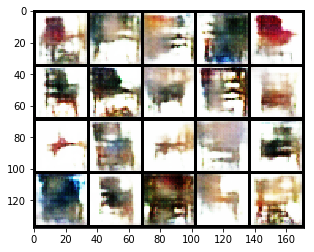

Epoch 110: Train D loss: -0.4486, G loss: 0.2369
Epoch 111: Train D loss: -0.5047, G loss: 0.2860
Epoch 112: Train D loss: -0.4696, G loss: 0.3056
Epoch 113: Train D loss: -0.4604, G loss: 0.2397
Epoch 114: Train D loss: -0.4948, G loss: 0.2713
Epoch 115: Train D loss: -0.4749, G loss: 0.3330
Epoch 116: Train D loss: -0.4648, G loss: 0.2313
Epoch 117: Train D loss: -0.4783, G loss: 0.2287
Epoch 118: Train D loss: -0.4862, G loss: 0.3400
Epoch 119: Train D loss: -0.4468, G loss: 0.2446


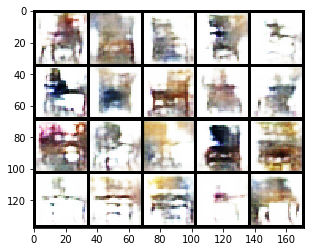

Epoch 120: Train D loss: -0.4863, G loss: 0.2968
Epoch 121: Train D loss: -0.4730, G loss: 0.3733
Epoch 122: Train D loss: -0.4469, G loss: 0.2520
Epoch 123: Train D loss: -0.4740, G loss: 0.3309
Epoch 124: Train D loss: -0.4427, G loss: 0.2604
Epoch 125: Train D loss: -0.4978, G loss: 0.3227
Epoch 126: Train D loss: -0.4344, G loss: 0.2151
Epoch 127: Train D loss: -0.4709, G loss: 0.2645
Epoch 128: Train D loss: -0.4398, G loss: 0.2580
Epoch 129: Train D loss: -0.4560, G loss: 0.2975


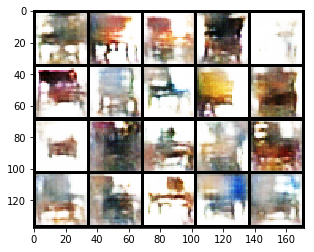

Epoch 130: Train D loss: -0.4600, G loss: 0.3171
Epoch 131: Train D loss: -0.4571, G loss: 0.3221
Epoch 132: Train D loss: -0.4237, G loss: 0.2832
Epoch 133: Train D loss: -0.4311, G loss: 0.2485
Epoch 134: Train D loss: -0.4795, G loss: 0.3387
Epoch 135: Train D loss: -0.4224, G loss: 0.2868
Epoch 136: Train D loss: -0.4428, G loss: 0.2685
Epoch 137: Train D loss: -0.4480, G loss: 0.2881
Epoch 138: Train D loss: -0.4437, G loss: 0.2967
Epoch 139: Train D loss: -0.4489, G loss: 0.2750


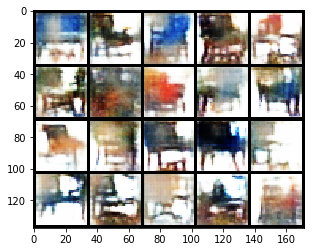

Epoch 140: Train D loss: -0.4487, G loss: 0.2675
Epoch 141: Train D loss: -0.4444, G loss: 0.2860
Epoch 142: Train D loss: -0.4187, G loss: 0.2280
Epoch 143: Train D loss: -0.4532, G loss: 0.2486
Epoch 144: Train D loss: -0.4535, G loss: 0.3371
Epoch 145: Train D loss: -0.4376, G loss: 0.3032
Epoch 146: Train D loss: -0.4464, G loss: 0.2560
Epoch 147: Train D loss: -0.4015, G loss: 0.2322
Epoch 148: Train D loss: -0.4390, G loss: 0.2934
Epoch 149: Train D loss: -0.4120, G loss: 0.2467


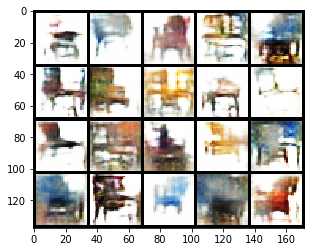

Epoch 150: Train D loss: -0.4172, G loss: 0.2395
Epoch 151: Train D loss: -0.4405, G loss: 0.2610
Epoch 152: Train D loss: -0.4126, G loss: 0.2420
Epoch 153: Train D loss: -0.4411, G loss: 0.3100
Epoch 154: Train D loss: -0.4149, G loss: 0.2889
Epoch 155: Train D loss: -0.4525, G loss: 0.2690
Epoch 156: Train D loss: -0.4192, G loss: 0.2432
Epoch 157: Train D loss: -0.4140, G loss: 0.2387
Epoch 158: Train D loss: -0.4184, G loss: 0.2530
Epoch 159: Train D loss: -0.4135, G loss: 0.2701


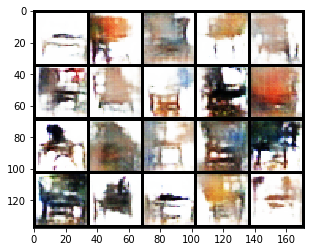

Epoch 160: Train D loss: -0.4272, G loss: 0.2346
Epoch 161: Train D loss: -0.4185, G loss: 0.2583
Epoch 162: Train D loss: -0.4228, G loss: 0.2519
Epoch 163: Train D loss: -0.4133, G loss: 0.2725
Epoch 164: Train D loss: -0.4401, G loss: 0.2480
Epoch 165: Train D loss: -0.4419, G loss: 0.3139
Epoch 166: Train D loss: -0.3905, G loss: 0.2053
Epoch 167: Train D loss: -0.4161, G loss: 0.2635
Epoch 168: Train D loss: -0.4417, G loss: 0.3153
Epoch 169: Train D loss: -0.3961, G loss: 0.2421


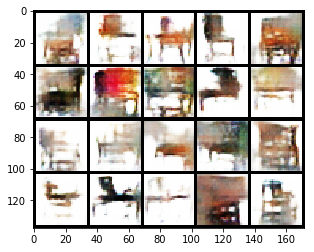

Epoch 170: Train D loss: -0.4516, G loss: 0.2709
Epoch 171: Train D loss: -0.3638, G loss: 0.2812
Epoch 172: Train D loss: -0.3981, G loss: 0.2086
Epoch 173: Train D loss: -0.4146, G loss: 0.2372
Epoch 174: Train D loss: -0.3794, G loss: 0.2793
Epoch 175: Train D loss: -0.4233, G loss: 0.2685
Epoch 176: Train D loss: -0.3685, G loss: 0.2607
Epoch 177: Train D loss: -0.4052, G loss: 0.2367
Epoch 178: Train D loss: -0.3643, G loss: 0.2589
Epoch 179: Train D loss: -0.4049, G loss: 0.2743


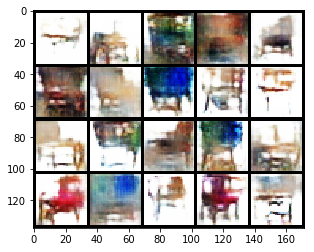

Epoch 180: Train D loss: -0.3780, G loss: 0.2693
Epoch 181: Train D loss: -0.4180, G loss: 0.2482
Epoch 182: Train D loss: -0.3957, G loss: 0.2799
Epoch 183: Train D loss: -0.3876, G loss: 0.2193
Epoch 184: Train D loss: -0.4151, G loss: 0.2671
Epoch 185: Train D loss: -0.3696, G loss: 0.2388
Epoch 186: Train D loss: -0.3825, G loss: 0.2549
Epoch 187: Train D loss: -0.3831, G loss: 0.2733
Epoch 188: Train D loss: -0.3767, G loss: 0.2766
Epoch 189: Train D loss: -0.3666, G loss: 0.2558


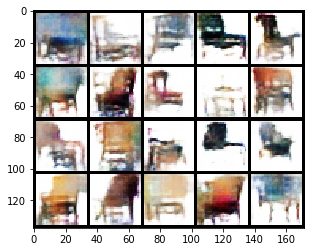

Epoch 190: Train D loss: -0.3711, G loss: 0.1883
Epoch 191: Train D loss: -0.4035, G loss: 0.2605
Epoch 192: Train D loss: -0.3728, G loss: 0.2288
Epoch 193: Train D loss: -0.3776, G loss: 0.2764
Epoch 194: Train D loss: -0.3837, G loss: 0.2522
Epoch 195: Train D loss: -0.3758, G loss: 0.2894
Epoch 196: Train D loss: -0.3727, G loss: 0.2380
Epoch 197: Train D loss: -0.3411, G loss: 0.2426
Epoch 198: Train D loss: -0.3941, G loss: 0.2207
Epoch 199: Train D loss: -0.3443, G loss: 0.1902


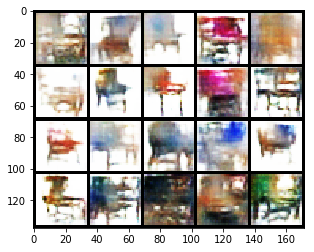

Epoch 200: Train D loss: -0.3746, G loss: 0.2402
Epoch 201: Train D loss: -0.3754, G loss: 0.2310
Epoch 202: Train D loss: -0.3865, G loss: 0.2320
Epoch 203: Train D loss: -0.3365, G loss: 0.2440
Epoch 204: Train D loss: -0.3574, G loss: 0.2157
Epoch 205: Train D loss: -0.3411, G loss: 0.2337
Epoch 206: Train D loss: -0.3578, G loss: 0.2539
Epoch 207: Train D loss: -0.3727, G loss: 0.2425
Epoch 208: Train D loss: -0.3558, G loss: 0.2223
Epoch 209: Train D loss: -0.4046, G loss: 0.2761


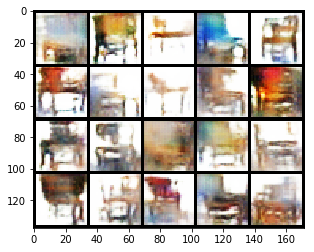

Epoch 210: Train D loss: -0.3520, G loss: 0.2132
Epoch 211: Train D loss: -0.4044, G loss: 0.3114
Epoch 212: Train D loss: -0.3388, G loss: 0.2589
Epoch 213: Train D loss: -0.3804, G loss: 0.2507
Epoch 214: Train D loss: -0.3535, G loss: 0.2654
Epoch 215: Train D loss: -0.3697, G loss: 0.2391
Epoch 216: Train D loss: -0.3395, G loss: 0.2238
Epoch 217: Train D loss: -0.3870, G loss: 0.2487
Epoch 218: Train D loss: -0.3519, G loss: 0.2261
Epoch 219: Train D loss: -0.3620, G loss: 0.2596


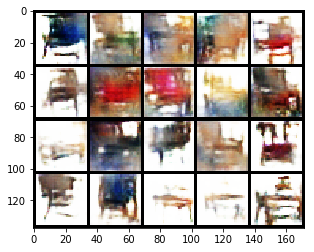

Epoch 220: Train D loss: -0.3177, G loss: 0.2055
Epoch 221: Train D loss: -0.3588, G loss: 0.2506
Epoch 222: Train D loss: -0.3354, G loss: 0.2273
Epoch 223: Train D loss: -0.3751, G loss: 0.2671
Epoch 224: Train D loss: -0.3408, G loss: 0.1939
Epoch 225: Train D loss: -0.3565, G loss: 0.2562
Epoch 226: Train D loss: -0.3134, G loss: 0.1841
Epoch 227: Train D loss: -0.3693, G loss: 0.2585
Epoch 228: Train D loss: -0.3617, G loss: 0.2294
Epoch 229: Train D loss: -0.3632, G loss: 0.2463


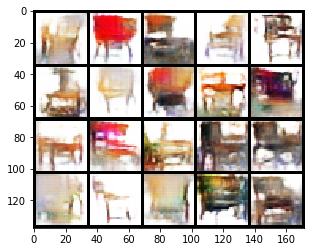

Epoch 230: Train D loss: -0.3617, G loss: 0.2701
Epoch 231: Train D loss: -0.3585, G loss: 0.2465
Epoch 232: Train D loss: -0.3284, G loss: 0.2238
Epoch 233: Train D loss: -0.3419, G loss: 0.1768
Epoch 234: Train D loss: -0.3769, G loss: 0.2174
Epoch 235: Train D loss: -0.3590, G loss: 0.2543
Epoch 236: Train D loss: -0.3211, G loss: 0.2444
Epoch 237: Train D loss: -0.3689, G loss: 0.2161
Epoch 238: Train D loss: -0.3582, G loss: 0.2099
Epoch 239: Train D loss: -0.3299, G loss: 0.2253


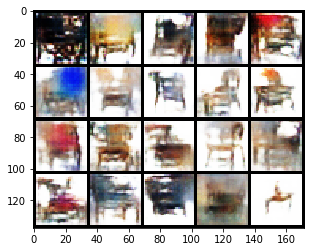

Epoch 240: Train D loss: -0.3587, G loss: 0.2180
Epoch 241: Train D loss: -0.3306, G loss: 0.2081
Epoch 242: Train D loss: -0.3415, G loss: 0.2570
Epoch 243: Train D loss: -0.3518, G loss: 0.2394
Epoch 244: Train D loss: -0.3261, G loss: 0.2290
Epoch 245: Train D loss: -0.3395, G loss: 0.2159
Epoch 246: Train D loss: -0.3491, G loss: 0.2738
Epoch 247: Train D loss: -0.3338, G loss: 0.1944
Epoch 248: Train D loss: -0.3507, G loss: 0.2559
Epoch 249: Train D loss: -0.3313, G loss: 0.2610


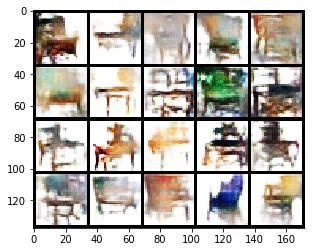

Epoch 250: Train D loss: -0.3614, G loss: 0.2839
Epoch 251: Train D loss: -0.3393, G loss: 0.2267
Epoch 252: Train D loss: -0.3460, G loss: 0.2009
Epoch 253: Train D loss: -0.3393, G loss: 0.2586
Epoch 254: Train D loss: -0.3438, G loss: 0.2262
Epoch 255: Train D loss: -0.3365, G loss: 0.2263
Epoch 256: Train D loss: -0.3368, G loss: 0.2115
Epoch 257: Train D loss: -0.3603, G loss: 0.2245
Epoch 258: Train D loss: -0.3139, G loss: 0.1794
Epoch 259: Train D loss: -0.3426, G loss: 0.2335


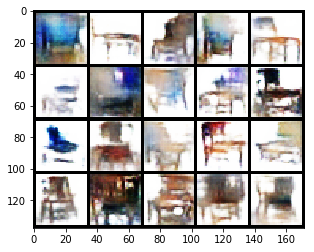

Epoch 260: Train D loss: -0.3433, G loss: 0.2386
Epoch 261: Train D loss: -0.3149, G loss: 0.1585
Epoch 262: Train D loss: -0.3283, G loss: 0.2299
Epoch 263: Train D loss: -0.3238, G loss: 0.2349
Epoch 264: Train D loss: -0.3321, G loss: 0.2045
Epoch 265: Train D loss: -0.3241, G loss: 0.2255
Epoch 266: Train D loss: -0.3609, G loss: 0.2384
Epoch 267: Train D loss: -0.3332, G loss: 0.2385
Epoch 268: Train D loss: -0.3219, G loss: 0.2355
Epoch 269: Train D loss: -0.3425, G loss: 0.2292


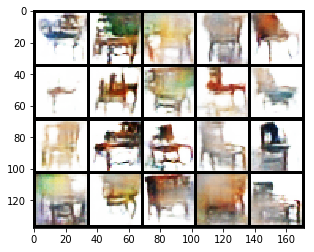

Epoch 270: Train D loss: -0.3091, G loss: 0.1849
Epoch 271: Train D loss: -0.3676, G loss: 0.3062
Epoch 272: Train D loss: -0.3044, G loss: 0.2111
Epoch 273: Train D loss: -0.3294, G loss: 0.2054
Epoch 274: Train D loss: -0.3223, G loss: 0.2070
Epoch 275: Train D loss: -0.3440, G loss: 0.2540
Epoch 276: Train D loss: -0.3260, G loss: 0.1944
Epoch 277: Train D loss: -0.3356, G loss: 0.1894
Epoch 278: Train D loss: -0.3101, G loss: 0.1952
Epoch 279: Train D loss: -0.3458, G loss: 0.1928


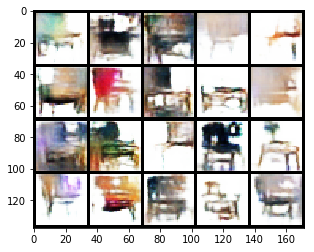

Epoch 280: Train D loss: -0.3276, G loss: 0.2450
Epoch 281: Train D loss: -0.3134, G loss: 0.2201
Epoch 282: Train D loss: -0.3468, G loss: 0.2198
Epoch 283: Train D loss: -0.2996, G loss: 0.2303
Epoch 284: Train D loss: -0.3398, G loss: 0.2665
Epoch 285: Train D loss: -0.3180, G loss: 0.2287
Epoch 286: Train D loss: -0.3186, G loss: 0.1840
Epoch 287: Train D loss: -0.3686, G loss: 0.2494
Epoch 288: Train D loss: -0.3112, G loss: 0.2166
Epoch 289: Train D loss: -0.3313, G loss: 0.1839


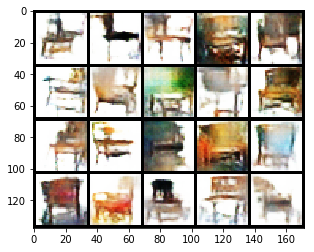

Epoch 290: Train D loss: -0.3305, G loss: 0.1863
Epoch 291: Train D loss: -0.3485, G loss: 0.2121
Epoch 292: Train D loss: -0.3216, G loss: 0.2257
Epoch 293: Train D loss: -0.3326, G loss: 0.1867
Epoch 294: Train D loss: -0.3160, G loss: 0.2307
Epoch 295: Train D loss: -0.3000, G loss: 0.1938
Epoch 296: Train D loss: -0.3226, G loss: 0.1803
Epoch 297: Train D loss: -0.3256, G loss: 0.2511
Epoch 298: Train D loss: -0.3231, G loss: 0.1904
Epoch 299: Train D loss: -0.3111, G loss: 0.1968


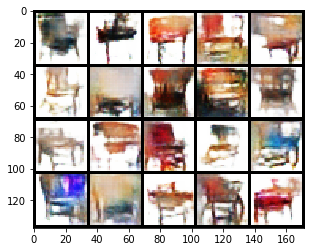

In [32]:
# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

由**WGAN**的原理我们知道,D_loss的*相反数*可以表示生成数据分布与真实分布的Wasserstein距离,其数值越小,表明两个分布越相似,GAN训练得越好.它的值给我们训练GAN提供了一个指标.

运行下方代码观察wgan的loss曲线,可以看到,总体上,D_loss的*相反数*随着epoch数增加逐渐下降,同时生成的数据也越来越逼近真实数据,这与wgan的原理是相符合的.

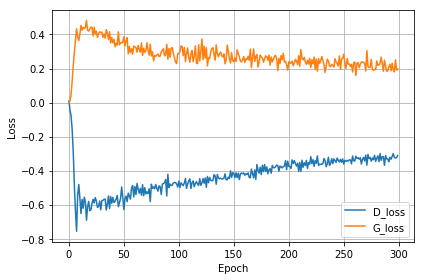

In [33]:
loss_plot(d_loss_hist, g_loss_hist)

接下来运行下面两个cell的代码,集中展示wgan的参数分布.

In [15]:
from utils import show_weights_hist
def show_d_params(D):
    plist = []
    for params in D.parameters():
        plist.extend(params.cpu().data.view(-1).numpy())
    show_weights_hist(plist)

/opt/conda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


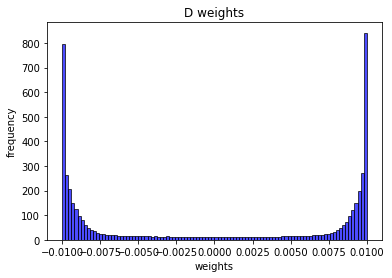

In [35]:
show_d_params(D)

可以看到,参数都被截断在\[-c, c\]之间,大部分参数集中在-c和c附近.

#### **作业**: 
尝试使用n_d设置为5, 3, 1等,再次训练wGAN,n_d为多少时的结果最好?

答：

`n_d`为1时结果最好，虽然说`n_d`代表的是每训练一次G就训练多少次D，但在网络中是先训练D的，也就是每`n_d`批数据，才训练一次G。`n_d`为1时，G的训练次数是最多的。

Epoch 0: Train D loss: -0.0352, G loss: -0.0080


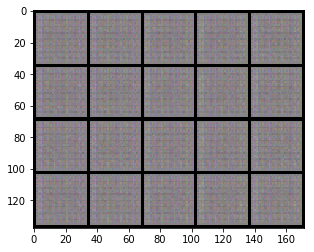

Epoch 1: Train D loss: -0.0192, G loss: -0.0094
Epoch 2: Train D loss: -0.0326, G loss: 0.0108
Epoch 3: Train D loss: -0.0731, G loss: 0.0630
Epoch 4: Train D loss: -0.0879, G loss: 0.1041
Epoch 5: Train D loss: -0.1244, G loss: 0.1231
Epoch 6: Train D loss: -0.1818, G loss: 0.1849
Epoch 7: Train D loss: -0.0712, G loss: 0.1092
Epoch 8: Train D loss: -0.0957, G loss: 0.1085
Epoch 9: Train D loss: -0.1629, G loss: 0.1581


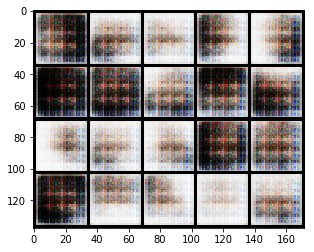

Epoch 10: Train D loss: -0.2209, G loss: 0.2101
Epoch 11: Train D loss: -0.2093, G loss: 0.2020
Epoch 12: Train D loss: -0.2802, G loss: 0.2564
Epoch 13: Train D loss: -0.2719, G loss: 0.2581
Epoch 14: Train D loss: -0.2143, G loss: 0.2346
Epoch 15: Train D loss: -0.2829, G loss: 0.2813
Epoch 16: Train D loss: -0.1271, G loss: 0.1707
Epoch 17: Train D loss: -0.2518, G loss: 0.2332
Epoch 18: Train D loss: -0.2304, G loss: 0.2383
Epoch 19: Train D loss: -0.2329, G loss: 0.2425


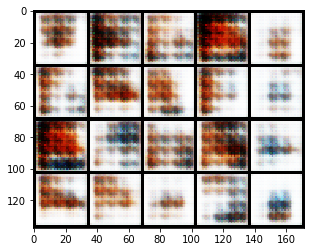

Epoch 20: Train D loss: -0.3643, G loss: 0.2799
Epoch 21: Train D loss: -0.3669, G loss: 0.3112
Epoch 22: Train D loss: -0.2755, G loss: 0.3141
Epoch 23: Train D loss: -0.3522, G loss: 0.2937
Epoch 24: Train D loss: -0.3978, G loss: 0.3056
Epoch 25: Train D loss: -0.3543, G loss: 0.3124
Epoch 26: Train D loss: -0.3478, G loss: 0.3409
Epoch 27: Train D loss: -0.3843, G loss: 0.3176
Epoch 28: Train D loss: -0.3265, G loss: 0.3363
Epoch 29: Train D loss: -0.2798, G loss: 0.2494


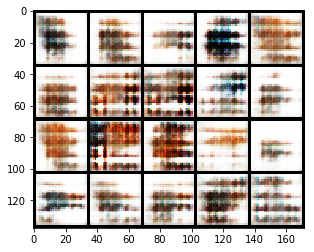

Epoch 30: Train D loss: -0.2997, G loss: 0.2761
Epoch 31: Train D loss: -0.3398, G loss: 0.3012
Epoch 32: Train D loss: -0.3184, G loss: 0.2661
Epoch 33: Train D loss: -0.2972, G loss: 0.3155
Epoch 34: Train D loss: -0.3886, G loss: 0.3037
Epoch 35: Train D loss: -0.3985, G loss: 0.2933
Epoch 36: Train D loss: -0.3212, G loss: 0.2728
Epoch 37: Train D loss: -0.4097, G loss: 0.3427
Epoch 38: Train D loss: -0.3387, G loss: 0.3016
Epoch 39: Train D loss: -0.4106, G loss: 0.3125


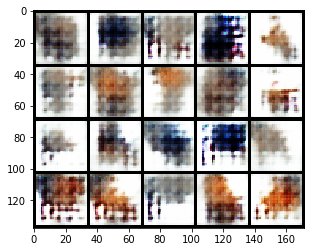

Epoch 40: Train D loss: -0.4031, G loss: 0.3123
Epoch 41: Train D loss: -0.4592, G loss: 0.3387
Epoch 42: Train D loss: -0.4205, G loss: 0.2980
Epoch 43: Train D loss: -0.5155, G loss: 0.3394
Epoch 44: Train D loss: -0.3395, G loss: 0.2819
Epoch 45: Train D loss: -0.4576, G loss: 0.3051
Epoch 46: Train D loss: -0.4192, G loss: 0.3238
Epoch 47: Train D loss: -0.4035, G loss: 0.2909
Epoch 48: Train D loss: -0.3706, G loss: 0.2978
Epoch 49: Train D loss: -0.4211, G loss: 0.3047


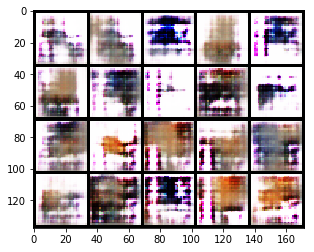

Epoch 50: Train D loss: -0.3618, G loss: 0.3080
Epoch 51: Train D loss: -0.4136, G loss: 0.3180
Epoch 52: Train D loss: -0.3966, G loss: 0.2992
Epoch 53: Train D loss: -0.3460, G loss: 0.2532
Epoch 54: Train D loss: -0.3566, G loss: 0.2789
Epoch 55: Train D loss: -0.3010, G loss: 0.2649
Epoch 56: Train D loss: -0.3842, G loss: 0.2785
Epoch 57: Train D loss: -0.3746, G loss: 0.2766
Epoch 58: Train D loss: -0.3039, G loss: 0.2631
Epoch 59: Train D loss: -0.2802, G loss: 0.2532


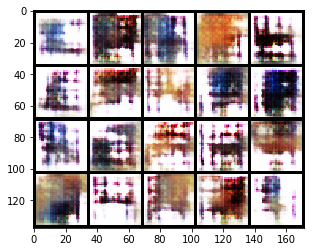

Epoch 60: Train D loss: -0.3062, G loss: 0.2601
Epoch 61: Train D loss: -0.3090, G loss: 0.2474
Epoch 62: Train D loss: -0.3222, G loss: 0.2589
Epoch 63: Train D loss: -0.2967, G loss: 0.2578
Epoch 64: Train D loss: -0.3334, G loss: 0.2480
Epoch 65: Train D loss: -0.3691, G loss: 0.2701
Epoch 66: Train D loss: -0.3208, G loss: 0.2358
Epoch 67: Train D loss: -0.3538, G loss: 0.2709
Epoch 68: Train D loss: -0.3175, G loss: 0.2429
Epoch 69: Train D loss: -0.3470, G loss: 0.2555


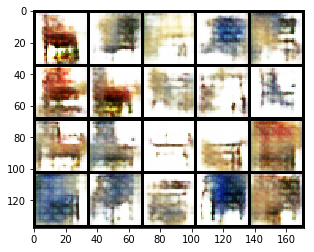

Epoch 70: Train D loss: -0.3576, G loss: 0.2646
Epoch 71: Train D loss: -0.3157, G loss: 0.2521
Epoch 72: Train D loss: -0.3340, G loss: 0.2660
Epoch 73: Train D loss: -0.3271, G loss: 0.2340
Epoch 74: Train D loss: -0.3114, G loss: 0.2547
Epoch 75: Train D loss: -0.3188, G loss: 0.2629
Epoch 76: Train D loss: -0.3111, G loss: 0.2310
Epoch 77: Train D loss: -0.3016, G loss: 0.2533
Epoch 78: Train D loss: -0.3369, G loss: 0.2558
Epoch 79: Train D loss: -0.3203, G loss: 0.2374


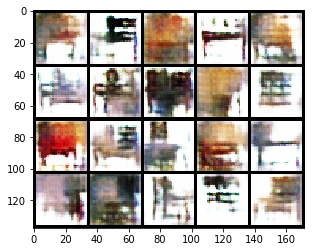

Epoch 80: Train D loss: -0.3135, G loss: 0.2312
Epoch 81: Train D loss: -0.2638, G loss: 0.2198
Epoch 82: Train D loss: -0.3056, G loss: 0.2416
Epoch 83: Train D loss: -0.3056, G loss: 0.2393
Epoch 84: Train D loss: -0.2635, G loss: 0.2142
Epoch 85: Train D loss: -0.3168, G loss: 0.2563
Epoch 86: Train D loss: -0.2864, G loss: 0.2296
Epoch 87: Train D loss: -0.3100, G loss: 0.2451
Epoch 88: Train D loss: -0.2988, G loss: 0.2324
Epoch 89: Train D loss: -0.3004, G loss: 0.2545


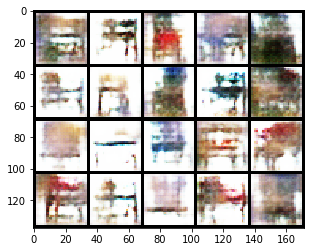

Epoch 90: Train D loss: -0.2908, G loss: 0.2375
Epoch 91: Train D loss: -0.2945, G loss: 0.2449
Epoch 92: Train D loss: -0.2577, G loss: 0.2264
Epoch 93: Train D loss: -0.2977, G loss: 0.2486
Epoch 94: Train D loss: -0.2933, G loss: 0.2217
Epoch 95: Train D loss: -0.2994, G loss: 0.2419
Epoch 96: Train D loss: -0.2826, G loss: 0.2452
Epoch 97: Train D loss: -0.2904, G loss: 0.2163
Epoch 98: Train D loss: -0.2792, G loss: 0.2330
Epoch 99: Train D loss: -0.3293, G loss: 0.2192


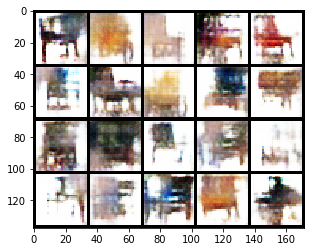

Epoch 100: Train D loss: -0.3041, G loss: 0.2547
Epoch 101: Train D loss: -0.2870, G loss: 0.2075
Epoch 102: Train D loss: -0.3004, G loss: 0.2383
Epoch 103: Train D loss: -0.2964, G loss: 0.1947
Epoch 104: Train D loss: -0.2813, G loss: 0.2258
Epoch 105: Train D loss: -0.2766, G loss: 0.2216
Epoch 106: Train D loss: -0.2884, G loss: 0.2213
Epoch 107: Train D loss: -0.2563, G loss: 0.2084
Epoch 108: Train D loss: -0.3037, G loss: 0.2387
Epoch 109: Train D loss: -0.2504, G loss: 0.2356


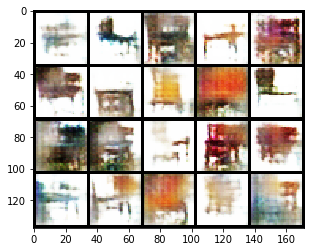

Epoch 110: Train D loss: -0.2663, G loss: 0.2263
Epoch 111: Train D loss: -0.2577, G loss: 0.2105
Epoch 112: Train D loss: -0.2819, G loss: 0.2342
Epoch 113: Train D loss: -0.2656, G loss: 0.1961
Epoch 114: Train D loss: -0.2875, G loss: 0.2366
Epoch 115: Train D loss: -0.2648, G loss: 0.2091
Epoch 116: Train D loss: -0.2586, G loss: 0.2227
Epoch 117: Train D loss: -0.2834, G loss: 0.2166
Epoch 118: Train D loss: -0.2183, G loss: 0.1692
Epoch 119: Train D loss: -0.2867, G loss: 0.2195


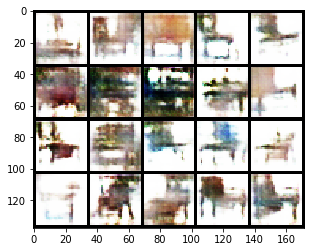

Epoch 120: Train D loss: -0.2624, G loss: 0.2142
Epoch 121: Train D loss: -0.2962, G loss: 0.2398
Epoch 122: Train D loss: -0.2474, G loss: 0.1948
Epoch 123: Train D loss: -0.2923, G loss: 0.2173
Epoch 124: Train D loss: -0.2792, G loss: 0.1999
Epoch 125: Train D loss: -0.2759, G loss: 0.2342
Epoch 126: Train D loss: -0.2322, G loss: 0.1513
Epoch 127: Train D loss: -0.2954, G loss: 0.2506
Epoch 128: Train D loss: -0.2481, G loss: 0.1922
Epoch 129: Train D loss: -0.2530, G loss: 0.2294


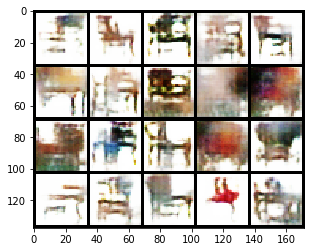

Epoch 130: Train D loss: -0.2472, G loss: 0.1699
Epoch 131: Train D loss: -0.2898, G loss: 0.2383
Epoch 132: Train D loss: -0.2447, G loss: 0.1982
Epoch 133: Train D loss: -0.2885, G loss: 0.2301
Epoch 134: Train D loss: -0.2410, G loss: 0.1823
Epoch 135: Train D loss: -0.2613, G loss: 0.2138
Epoch 136: Train D loss: -0.2492, G loss: 0.2158
Epoch 137: Train D loss: -0.2560, G loss: 0.2319
Epoch 138: Train D loss: -0.2602, G loss: 0.1917
Epoch 139: Train D loss: -0.2584, G loss: 0.2154


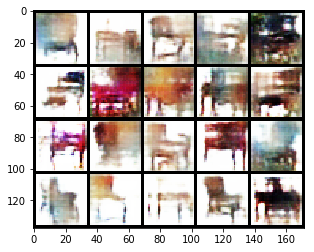

Epoch 140: Train D loss: -0.2439, G loss: 0.2020
Epoch 141: Train D loss: -0.2883, G loss: 0.2112
Epoch 142: Train D loss: -0.2073, G loss: 0.1743
Epoch 143: Train D loss: -0.3102, G loss: 0.2299
Epoch 144: Train D loss: -0.2279, G loss: 0.1596
Epoch 145: Train D loss: -0.2777, G loss: 0.2273
Epoch 146: Train D loss: -0.2315, G loss: 0.2229
Epoch 147: Train D loss: -0.2524, G loss: 0.1866
Epoch 148: Train D loss: -0.2584, G loss: 0.2011
Epoch 149: Train D loss: -0.2698, G loss: 0.2210


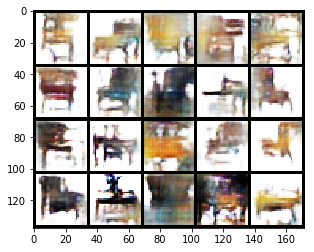

Epoch 150: Train D loss: -0.2560, G loss: 0.1981
Epoch 151: Train D loss: -0.2798, G loss: 0.2215
Epoch 152: Train D loss: -0.2637, G loss: 0.1960
Epoch 153: Train D loss: -0.2461, G loss: 0.1962
Epoch 154: Train D loss: -0.2737, G loss: 0.2279
Epoch 155: Train D loss: -0.2725, G loss: 0.2118
Epoch 156: Train D loss: -0.2622, G loss: 0.2082
Epoch 157: Train D loss: -0.2802, G loss: 0.2201
Epoch 158: Train D loss: -0.2472, G loss: 0.2028
Epoch 159: Train D loss: -0.2917, G loss: 0.2156


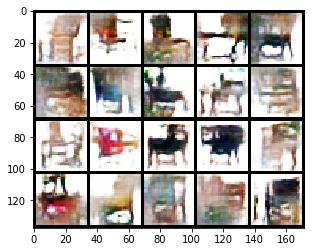

Epoch 160: Train D loss: -0.2498, G loss: 0.2133
Epoch 161: Train D loss: -0.2763, G loss: 0.2178
Epoch 162: Train D loss: -0.2488, G loss: 0.2025
Epoch 163: Train D loss: -0.2317, G loss: 0.2036
Epoch 164: Train D loss: -0.2585, G loss: 0.2194
Epoch 165: Train D loss: -0.2439, G loss: 0.1814
Epoch 166: Train D loss: -0.2674, G loss: 0.2294
Epoch 167: Train D loss: -0.2363, G loss: 0.1900
Epoch 168: Train D loss: -0.2537, G loss: 0.1976
Epoch 169: Train D loss: -0.2343, G loss: 0.2176


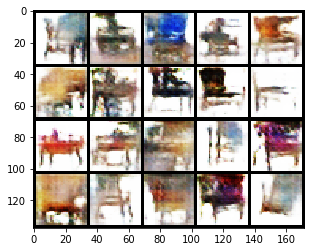

Epoch 170: Train D loss: -0.2624, G loss: 0.2063
Epoch 171: Train D loss: -0.2554, G loss: 0.1901
Epoch 172: Train D loss: -0.2537, G loss: 0.2015
Epoch 173: Train D loss: -0.2599, G loss: 0.2291
Epoch 174: Train D loss: -0.2726, G loss: 0.2241
Epoch 175: Train D loss: -0.2447, G loss: 0.2049
Epoch 176: Train D loss: -0.2222, G loss: 0.1792
Epoch 177: Train D loss: -0.2653, G loss: 0.1914
Epoch 178: Train D loss: -0.2437, G loss: 0.1970
Epoch 179: Train D loss: -0.2591, G loss: 0.2119


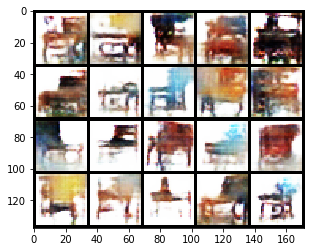

Epoch 180: Train D loss: -0.2785, G loss: 0.2253
Epoch 181: Train D loss: -0.2316, G loss: 0.1993
Epoch 182: Train D loss: -0.2639, G loss: 0.2016
Epoch 183: Train D loss: -0.2628, G loss: 0.1989
Epoch 184: Train D loss: -0.2379, G loss: 0.2103
Epoch 185: Train D loss: -0.2584, G loss: 0.1845
Epoch 186: Train D loss: -0.2548, G loss: 0.2056
Epoch 187: Train D loss: -0.2410, G loss: 0.1937
Epoch 188: Train D loss: -0.2327, G loss: 0.1989
Epoch 189: Train D loss: -0.2524, G loss: 0.1999


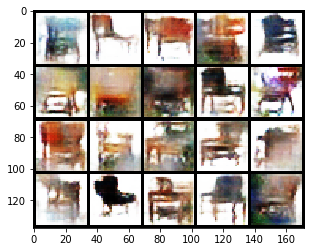

Epoch 190: Train D loss: -0.2732, G loss: 0.1898
Epoch 191: Train D loss: -0.2464, G loss: 0.2005
Epoch 192: Train D loss: -0.2275, G loss: 0.1962
Epoch 193: Train D loss: -0.2561, G loss: 0.2336
Epoch 194: Train D loss: -0.2112, G loss: 0.1728
Epoch 195: Train D loss: -0.2815, G loss: 0.2113
Epoch 196: Train D loss: -0.2430, G loss: 0.1910
Epoch 197: Train D loss: -0.2490, G loss: 0.1953
Epoch 198: Train D loss: -0.2641, G loss: 0.2112
Epoch 199: Train D loss: -0.2397, G loss: 0.2043


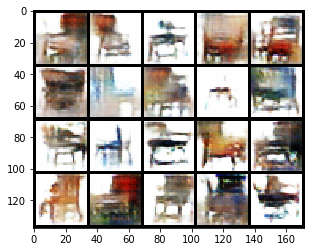

Epoch 200: Train D loss: -0.2328, G loss: 0.1774
Epoch 201: Train D loss: -0.2245, G loss: 0.1971
Epoch 202: Train D loss: -0.2351, G loss: 0.1982
Epoch 203: Train D loss: -0.2430, G loss: 0.2042
Epoch 204: Train D loss: -0.2243, G loss: 0.2135
Epoch 205: Train D loss: -0.2230, G loss: 0.2143
Epoch 206: Train D loss: -0.2486, G loss: 0.1863
Epoch 207: Train D loss: -0.2268, G loss: 0.1980
Epoch 208: Train D loss: -0.2271, G loss: 0.1919
Epoch 209: Train D loss: -0.2584, G loss: 0.2027


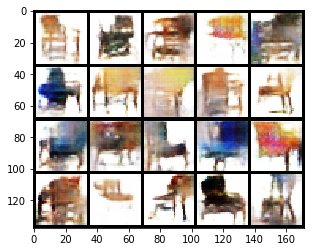

Epoch 210: Train D loss: -0.2250, G loss: 0.1615
Epoch 211: Train D loss: -0.2220, G loss: 0.2191
Epoch 212: Train D loss: -0.2265, G loss: 0.1798
Epoch 213: Train D loss: -0.2570, G loss: 0.2250
Epoch 214: Train D loss: -0.2121, G loss: 0.1977
Epoch 215: Train D loss: -0.2163, G loss: 0.1867
Epoch 216: Train D loss: -0.1906, G loss: 0.1079
Epoch 217: Train D loss: -0.2584, G loss: 0.2066
Epoch 218: Train D loss: -0.1643, G loss: 0.1370
Epoch 219: Train D loss: -0.2409, G loss: 0.2117


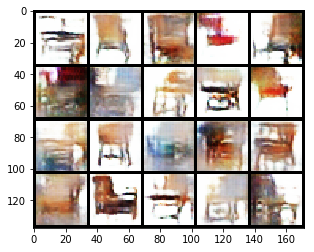

Epoch 220: Train D loss: -0.1888, G loss: 0.1140
Epoch 221: Train D loss: -0.1870, G loss: 0.1822
Epoch 222: Train D loss: -0.2128, G loss: 0.1913
Epoch 223: Train D loss: -0.2278, G loss: 0.1982
Epoch 224: Train D loss: -0.2201, G loss: 0.1985
Epoch 225: Train D loss: -0.2176, G loss: 0.1725
Epoch 226: Train D loss: -0.2175, G loss: 0.1916
Epoch 227: Train D loss: -0.2385, G loss: 0.1575
Epoch 228: Train D loss: -0.1957, G loss: 0.1703
Epoch 229: Train D loss: -0.2573, G loss: 0.2213


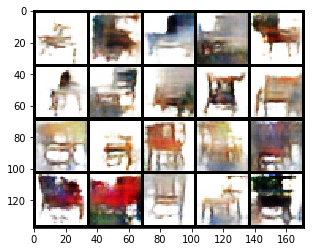

Epoch 230: Train D loss: -0.2425, G loss: 0.1866
Epoch 231: Train D loss: -0.2175, G loss: 0.1901
Epoch 232: Train D loss: -0.2202, G loss: 0.1715
Epoch 233: Train D loss: -0.2142, G loss: 0.1752
Epoch 234: Train D loss: -0.1985, G loss: 0.1742
Epoch 235: Train D loss: -0.2196, G loss: 0.2023
Epoch 236: Train D loss: -0.2133, G loss: 0.1780
Epoch 237: Train D loss: -0.1867, G loss: 0.1549
Epoch 238: Train D loss: -0.2316, G loss: 0.1833
Epoch 239: Train D loss: -0.2127, G loss: 0.1815


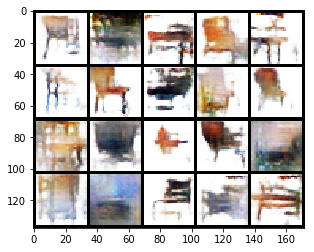

Epoch 240: Train D loss: -0.1842, G loss: 0.1887
Epoch 241: Train D loss: -0.2330, G loss: 0.2253
Epoch 242: Train D loss: -0.1878, G loss: 0.1900
Epoch 243: Train D loss: -0.1977, G loss: 0.1739
Epoch 244: Train D loss: -0.2048, G loss: 0.1730
Epoch 245: Train D loss: -0.2182, G loss: 0.1900
Epoch 246: Train D loss: -0.2029, G loss: 0.1559
Epoch 247: Train D loss: -0.2063, G loss: 0.1666
Epoch 248: Train D loss: -0.2094, G loss: 0.1802
Epoch 249: Train D loss: -0.2191, G loss: 0.1645


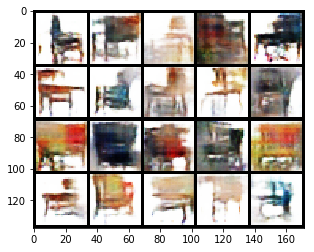

Epoch 250: Train D loss: -0.1969, G loss: 0.1965
Epoch 251: Train D loss: -0.2298, G loss: 0.1871
Epoch 252: Train D loss: -0.2072, G loss: 0.1990
Epoch 253: Train D loss: -0.2204, G loss: 0.1769
Epoch 254: Train D loss: -0.2264, G loss: 0.1782
Epoch 255: Train D loss: -0.2138, G loss: 0.1560
Epoch 256: Train D loss: -0.2079, G loss: 0.1955
Epoch 257: Train D loss: -0.2097, G loss: 0.1813
Epoch 258: Train D loss: -0.1985, G loss: 0.1890
Epoch 259: Train D loss: -0.2092, G loss: 0.1757


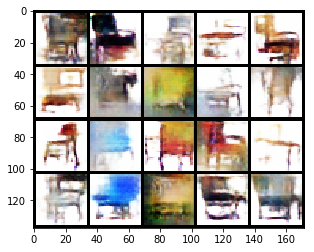

Epoch 260: Train D loss: -0.2194, G loss: 0.1515
Epoch 261: Train D loss: -0.2140, G loss: 0.1865
Epoch 262: Train D loss: -0.2196, G loss: 0.2056
Epoch 263: Train D loss: -0.1865, G loss: 0.1619
Epoch 264: Train D loss: -0.2170, G loss: 0.1734
Epoch 265: Train D loss: -0.2075, G loss: 0.2038
Epoch 266: Train D loss: -0.1994, G loss: 0.1781
Epoch 267: Train D loss: -0.2164, G loss: 0.1705
Epoch 268: Train D loss: -0.2005, G loss: 0.1822
Epoch 269: Train D loss: -0.2039, G loss: 0.1577


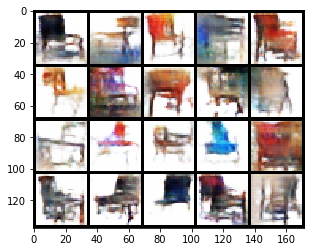

Epoch 270: Train D loss: -0.2087, G loss: 0.1759
Epoch 271: Train D loss: -0.2028, G loss: 0.1621
Epoch 272: Train D loss: -0.2021, G loss: 0.1657
Epoch 273: Train D loss: -0.1985, G loss: 0.1783
Epoch 274: Train D loss: -0.2175, G loss: 0.1692
Epoch 275: Train D loss: -0.1954, G loss: 0.1740
Epoch 276: Train D loss: -0.2137, G loss: 0.1620
Epoch 277: Train D loss: -0.2063, G loss: 0.1853
Epoch 278: Train D loss: -0.2077, G loss: 0.1688
Epoch 279: Train D loss: -0.2174, G loss: 0.2013


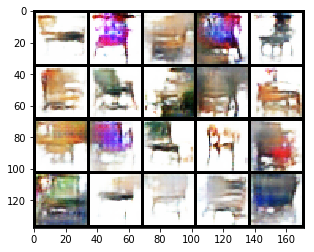

Epoch 280: Train D loss: -0.2207, G loss: 0.1897
Epoch 281: Train D loss: -0.2018, G loss: 0.1755
Epoch 282: Train D loss: -0.2256, G loss: 0.1861
Epoch 283: Train D loss: -0.2036, G loss: 0.1833
Epoch 284: Train D loss: -0.2062, G loss: 0.1682
Epoch 285: Train D loss: -0.1855, G loss: 0.1959
Epoch 286: Train D loss: -0.2118, G loss: 0.1877
Epoch 287: Train D loss: -0.1989, G loss: 0.1647
Epoch 288: Train D loss: -0.1984, G loss: 0.1882
Epoch 289: Train D loss: -0.1939, G loss: 0.1699


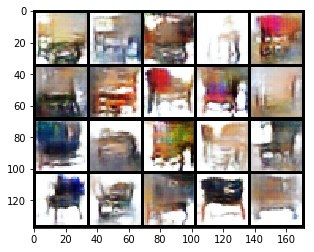

Epoch 290: Train D loss: -0.1980, G loss: 0.1731
Epoch 291: Train D loss: -0.2083, G loss: 0.1868
Epoch 292: Train D loss: -0.1754, G loss: 0.1860
Epoch 293: Train D loss: -0.2044, G loss: 0.1867
Epoch 294: Train D loss: -0.1818, G loss: 0.1722
Epoch 295: Train D loss: -0.2068, G loss: 0.1633
Epoch 296: Train D loss: -0.1917, G loss: 0.1658
Epoch 297: Train D loss: -0.2133, G loss: 0.1985
Epoch 298: Train D loss: -0.2108, G loss: 0.1783
Epoch 299: Train D loss: -0.1983, G loss: 0.1877


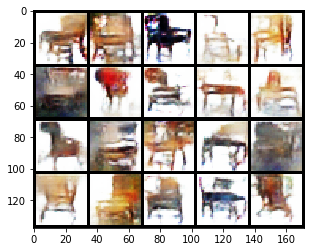

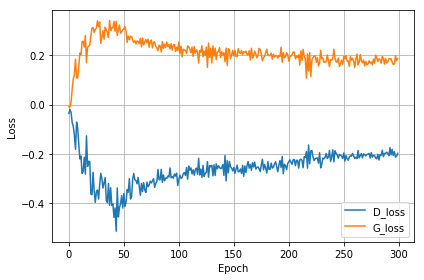

In [36]:
n_d = 1

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

Epoch 0: Train D loss: -0.0460, G loss: 0.0017


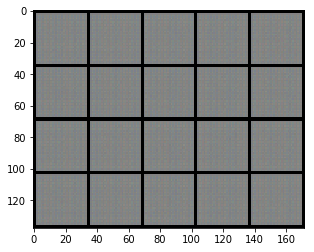

Epoch 1: Train D loss: -0.0762, G loss: 0.0213
Epoch 2: Train D loss: -0.1781, G loss: 0.1071
Epoch 3: Train D loss: -0.3349, G loss: 0.2105
Epoch 4: Train D loss: -0.4966, G loss: 0.2909
Epoch 5: Train D loss: -0.5981, G loss: 0.3519
Epoch 6: Train D loss: -0.7772, G loss: 0.4129
Epoch 7: Train D loss: -0.9052, G loss: 0.4647
Epoch 8: Train D loss: -1.0028, G loss: 0.5055
Epoch 9: Train D loss: -1.0798, G loss: 0.5393


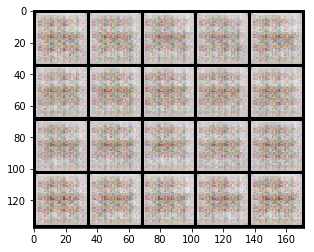

Epoch 10: Train D loss: -1.1242, G loss: 0.5638
Epoch 11: Train D loss: -1.0490, G loss: 0.5503
Epoch 12: Train D loss: -0.9501, G loss: 0.5257
Epoch 13: Train D loss: -0.8440, G loss: 0.4550
Epoch 14: Train D loss: -0.9075, G loss: 0.5297
Epoch 15: Train D loss: -0.8450, G loss: 0.4993
Epoch 16: Train D loss: -0.8355, G loss: 0.4948
Epoch 17: Train D loss: -0.7575, G loss: 0.4651
Epoch 18: Train D loss: -0.8411, G loss: 0.4934
Epoch 19: Train D loss: -0.8832, G loss: 0.4706


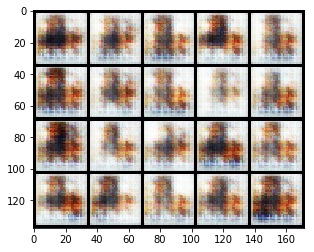

Epoch 20: Train D loss: -0.9551, G loss: 0.5252
Epoch 21: Train D loss: -0.9630, G loss: 0.5075
Epoch 22: Train D loss: -0.9062, G loss: 0.5177
Epoch 23: Train D loss: -1.0017, G loss: 0.5239
Epoch 24: Train D loss: -0.8969, G loss: 0.5051
Epoch 25: Train D loss: -0.8674, G loss: 0.4735
Epoch 26: Train D loss: -0.8994, G loss: 0.4926
Epoch 27: Train D loss: -0.8200, G loss: 0.4428
Epoch 28: Train D loss: -0.7735, G loss: 0.4492
Epoch 29: Train D loss: -0.7419, G loss: 0.4401


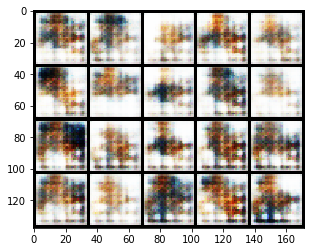

Epoch 30: Train D loss: -0.7697, G loss: 0.4335
Epoch 31: Train D loss: -0.7069, G loss: 0.3796
Epoch 32: Train D loss: -0.7194, G loss: 0.3943
Epoch 33: Train D loss: -0.8658, G loss: 0.5065
Epoch 34: Train D loss: -0.7710, G loss: 0.4389
Epoch 35: Train D loss: -0.8494, G loss: 0.4583
Epoch 36: Train D loss: -0.8133, G loss: 0.4352
Epoch 37: Train D loss: -0.8718, G loss: 0.4995
Epoch 38: Train D loss: -0.7573, G loss: 0.3984
Epoch 39: Train D loss: -0.7580, G loss: 0.3930


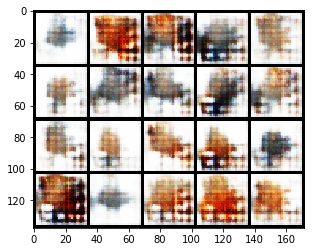

Epoch 40: Train D loss: -0.8680, G loss: 0.4922
Epoch 41: Train D loss: -0.8118, G loss: 0.4120
Epoch 42: Train D loss: -0.8099, G loss: 0.4639
Epoch 43: Train D loss: -0.7915, G loss: 0.4400
Epoch 44: Train D loss: -0.8561, G loss: 0.4661
Epoch 45: Train D loss: -0.8282, G loss: 0.4869
Epoch 46: Train D loss: -0.8216, G loss: 0.4641
Epoch 47: Train D loss: -0.8798, G loss: 0.4827
Epoch 48: Train D loss: -0.8021, G loss: 0.4536
Epoch 49: Train D loss: -0.8202, G loss: 0.4682


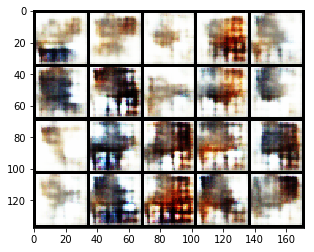

Epoch 50: Train D loss: -0.8087, G loss: 0.4672
Epoch 51: Train D loss: -0.8281, G loss: 0.4741
Epoch 52: Train D loss: -0.7818, G loss: 0.4553
Epoch 53: Train D loss: -0.7800, G loss: 0.4529
Epoch 54: Train D loss: -0.7395, G loss: 0.4021
Epoch 55: Train D loss: -0.7912, G loss: 0.4356
Epoch 56: Train D loss: -0.7800, G loss: 0.4555
Epoch 57: Train D loss: -0.7797, G loss: 0.4341
Epoch 58: Train D loss: -0.7476, G loss: 0.4437
Epoch 59: Train D loss: -0.7917, G loss: 0.4524


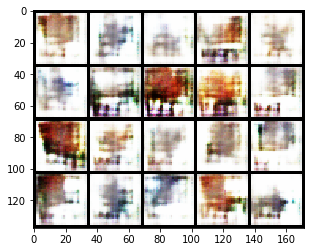

Epoch 60: Train D loss: -0.6966, G loss: 0.3713
Epoch 61: Train D loss: -0.7282, G loss: 0.3982
Epoch 62: Train D loss: -0.7504, G loss: 0.4307
Epoch 63: Train D loss: -0.7194, G loss: 0.4114
Epoch 64: Train D loss: -0.6956, G loss: 0.4476
Epoch 65: Train D loss: -0.7766, G loss: 0.4607
Epoch 66: Train D loss: -0.6511, G loss: 0.3780
Epoch 67: Train D loss: -0.7736, G loss: 0.4220
Epoch 68: Train D loss: -0.5914, G loss: 0.2775
Epoch 69: Train D loss: -0.6914, G loss: 0.3890


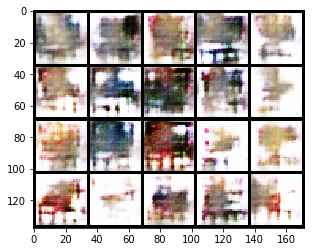

Epoch 70: Train D loss: -0.7214, G loss: 0.3970
Epoch 71: Train D loss: -0.6463, G loss: 0.4179
Epoch 72: Train D loss: -0.6484, G loss: 0.3679
Epoch 73: Train D loss: -0.6979, G loss: 0.4035
Epoch 74: Train D loss: -0.6211, G loss: 0.3860
Epoch 75: Train D loss: -0.7069, G loss: 0.4246
Epoch 76: Train D loss: -0.6590, G loss: 0.4133
Epoch 77: Train D loss: -0.6634, G loss: 0.4057
Epoch 78: Train D loss: -0.6359, G loss: 0.3678
Epoch 79: Train D loss: -0.6866, G loss: 0.4128


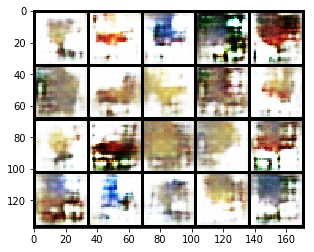

Epoch 80: Train D loss: -0.6321, G loss: 0.3772
Epoch 81: Train D loss: -0.6582, G loss: 0.3790
Epoch 82: Train D loss: -0.6075, G loss: 0.2892
Epoch 83: Train D loss: -0.6495, G loss: 0.3401
Epoch 84: Train D loss: -0.6667, G loss: 0.4229
Epoch 85: Train D loss: -0.6430, G loss: 0.3723
Epoch 86: Train D loss: -0.6368, G loss: 0.3594
Epoch 87: Train D loss: -0.6413, G loss: 0.3979
Epoch 88: Train D loss: -0.6673, G loss: 0.3786
Epoch 89: Train D loss: -0.6230, G loss: 0.2515


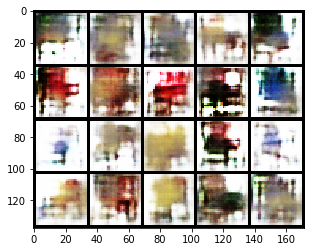

Epoch 90: Train D loss: -0.5625, G loss: 0.2549
Epoch 91: Train D loss: -0.7276, G loss: 0.4130
Epoch 92: Train D loss: -0.6306, G loss: 0.3917
Epoch 93: Train D loss: -0.6327, G loss: 0.3422
Epoch 94: Train D loss: -0.6371, G loss: 0.3423
Epoch 95: Train D loss: -0.6557, G loss: 0.3623
Epoch 96: Train D loss: -0.6406, G loss: 0.3503
Epoch 97: Train D loss: -0.6308, G loss: 0.3639
Epoch 98: Train D loss: -0.6671, G loss: 0.3758
Epoch 99: Train D loss: -0.6041, G loss: 0.3261


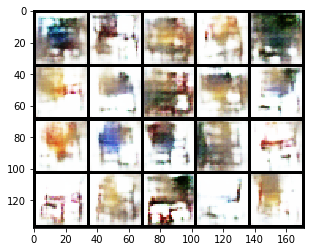

Epoch 100: Train D loss: -0.5971, G loss: 0.3453
Epoch 101: Train D loss: -0.6514, G loss: 0.3698
Epoch 102: Train D loss: -0.6089, G loss: 0.3164
Epoch 103: Train D loss: -0.6468, G loss: 0.3907
Epoch 104: Train D loss: -0.5634, G loss: 0.2456
Epoch 105: Train D loss: -0.6259, G loss: 0.3358
Epoch 106: Train D loss: -0.5921, G loss: 0.3058
Epoch 107: Train D loss: -0.6262, G loss: 0.4141
Epoch 108: Train D loss: -0.6237, G loss: 0.3546
Epoch 109: Train D loss: -0.5564, G loss: 0.1789


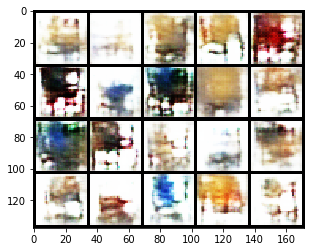

Epoch 110: Train D loss: -0.6992, G loss: 0.4284
Epoch 111: Train D loss: -0.6211, G loss: 0.3726
Epoch 112: Train D loss: -0.6161, G loss: 0.4236
Epoch 113: Train D loss: -0.5976, G loss: 0.3630
Epoch 114: Train D loss: -0.6121, G loss: 0.4116
Epoch 115: Train D loss: -0.5968, G loss: 0.3330
Epoch 116: Train D loss: -0.6527, G loss: 0.3906
Epoch 117: Train D loss: -0.6164, G loss: 0.3634
Epoch 118: Train D loss: -0.5793, G loss: 0.3350
Epoch 119: Train D loss: -0.6137, G loss: 0.3398


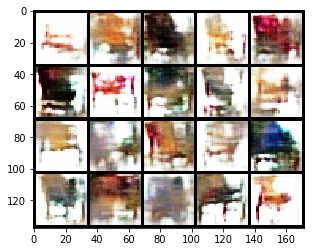

Epoch 120: Train D loss: -0.5972, G loss: 0.3034
Epoch 121: Train D loss: -0.6220, G loss: 0.3495
Epoch 122: Train D loss: -0.6072, G loss: 0.3605
Epoch 123: Train D loss: -0.5546, G loss: 0.3393
Epoch 124: Train D loss: -0.6235, G loss: 0.3159
Epoch 125: Train D loss: -0.6021, G loss: 0.3603
Epoch 126: Train D loss: -0.6125, G loss: 0.3610
Epoch 127: Train D loss: -0.5891, G loss: 0.3541
Epoch 128: Train D loss: -0.6043, G loss: 0.3463
Epoch 129: Train D loss: -0.5804, G loss: 0.3383


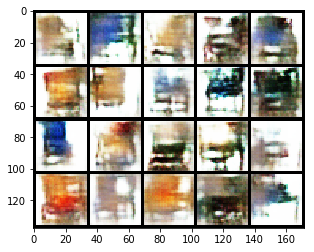

Epoch 130: Train D loss: -0.6058, G loss: 0.3530
Epoch 131: Train D loss: -0.5727, G loss: 0.3002
Epoch 132: Train D loss: -0.5763, G loss: 0.3175
Epoch 133: Train D loss: -0.6044, G loss: 0.3086
Epoch 134: Train D loss: -0.6207, G loss: 0.4078
Epoch 135: Train D loss: -0.5692, G loss: 0.3652
Epoch 136: Train D loss: -0.5683, G loss: 0.2552
Epoch 137: Train D loss: -0.5663, G loss: 0.3103
Epoch 138: Train D loss: -0.6471, G loss: 0.3633
Epoch 139: Train D loss: -0.5732, G loss: 0.3707


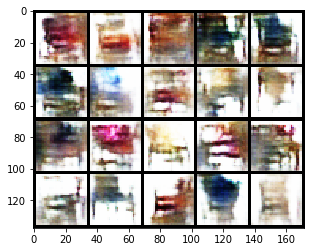

Epoch 140: Train D loss: -0.5521, G loss: 0.3379
Epoch 141: Train D loss: -0.6345, G loss: 0.3701
Epoch 142: Train D loss: -0.5194, G loss: 0.2691
Epoch 143: Train D loss: -0.6526, G loss: 0.4294
Epoch 144: Train D loss: -0.5904, G loss: 0.3469
Epoch 145: Train D loss: -0.5419, G loss: 0.3273
Epoch 146: Train D loss: -0.5499, G loss: 0.3650
Epoch 147: Train D loss: -0.5644, G loss: 0.3637
Epoch 148: Train D loss: -0.5445, G loss: 0.2917
Epoch 149: Train D loss: -0.5593, G loss: 0.3109


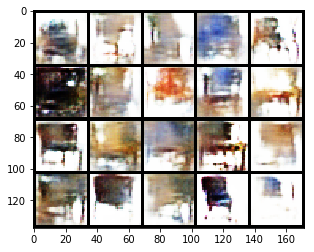

Epoch 150: Train D loss: -0.5425, G loss: 0.3333
Epoch 151: Train D loss: -0.5352, G loss: 0.3104
Epoch 152: Train D loss: -0.5719, G loss: 0.3312
Epoch 153: Train D loss: -0.5010, G loss: 0.1846
Epoch 154: Train D loss: -0.5925, G loss: 0.3411
Epoch 155: Train D loss: -0.5460, G loss: 0.3411
Epoch 156: Train D loss: -0.5103, G loss: 0.2758
Epoch 157: Train D loss: -0.5308, G loss: 0.2655
Epoch 158: Train D loss: -0.5652, G loss: 0.3584
Epoch 159: Train D loss: -0.5846, G loss: 0.3592


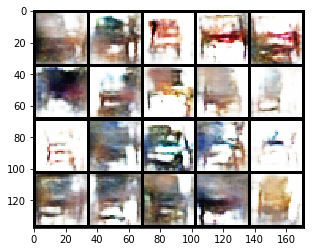

Epoch 160: Train D loss: -0.5159, G loss: 0.3508
Epoch 161: Train D loss: -0.4891, G loss: 0.2595
Epoch 162: Train D loss: -0.5691, G loss: 0.2822
Epoch 163: Train D loss: -0.5461, G loss: 0.3357
Epoch 164: Train D loss: -0.5416, G loss: 0.2710
Epoch 165: Train D loss: -0.5675, G loss: 0.3097
Epoch 166: Train D loss: -0.5657, G loss: 0.3522
Epoch 167: Train D loss: -0.5182, G loss: 0.3609
Epoch 168: Train D loss: -0.5295, G loss: 0.2681
Epoch 169: Train D loss: -0.5049, G loss: 0.2049


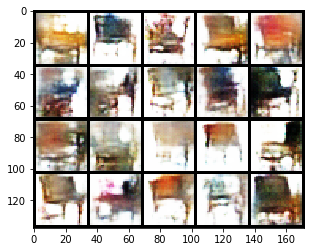

Epoch 170: Train D loss: -0.5104, G loss: 0.1964
Epoch 171: Train D loss: -0.5346, G loss: 0.2960
Epoch 172: Train D loss: -0.5051, G loss: 0.2285
Epoch 173: Train D loss: -0.5218, G loss: 0.2816
Epoch 174: Train D loss: -0.5532, G loss: 0.3463
Epoch 175: Train D loss: -0.5270, G loss: 0.3457
Epoch 176: Train D loss: -0.5128, G loss: 0.3354
Epoch 177: Train D loss: -0.5339, G loss: 0.3589
Epoch 178: Train D loss: -0.5141, G loss: 0.3132
Epoch 179: Train D loss: -0.5229, G loss: 0.3374


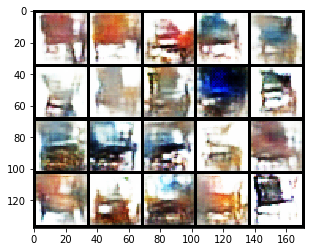

Epoch 180: Train D loss: -0.5167, G loss: 0.3836
Epoch 181: Train D loss: -0.5075, G loss: 0.3403
Epoch 182: Train D loss: -0.5430, G loss: 0.3787
Epoch 183: Train D loss: -0.5118, G loss: 0.3962
Epoch 184: Train D loss: -0.4516, G loss: 0.2149
Epoch 185: Train D loss: -0.5118, G loss: 0.2444
Epoch 186: Train D loss: -0.5438, G loss: 0.3760
Epoch 187: Train D loss: -0.5048, G loss: 0.2058
Epoch 188: Train D loss: -0.5352, G loss: 0.3307
Epoch 189: Train D loss: -0.5610, G loss: 0.3571


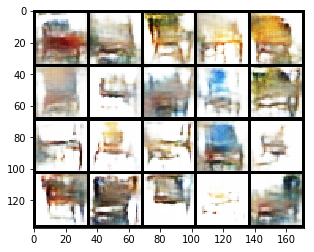

Epoch 190: Train D loss: -0.4930, G loss: 0.2272
Epoch 191: Train D loss: -0.5481, G loss: 0.3508
Epoch 192: Train D loss: -0.5174, G loss: 0.3392
Epoch 193: Train D loss: -0.5190, G loss: 0.3418
Epoch 194: Train D loss: -0.5465, G loss: 0.3646
Epoch 195: Train D loss: -0.4696, G loss: 0.2500
Epoch 196: Train D loss: -0.5617, G loss: 0.3642
Epoch 197: Train D loss: -0.5068, G loss: 0.2353
Epoch 198: Train D loss: -0.4907, G loss: 0.2996
Epoch 199: Train D loss: -0.5278, G loss: 0.2715


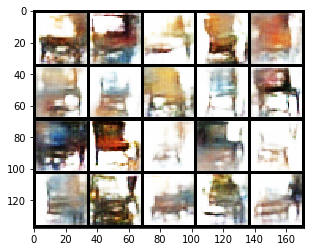

Epoch 200: Train D loss: -0.5124, G loss: 0.3491
Epoch 201: Train D loss: -0.5150, G loss: 0.3759
Epoch 202: Train D loss: -0.5010, G loss: 0.3127
Epoch 203: Train D loss: -0.5184, G loss: 0.3639
Epoch 204: Train D loss: -0.4698, G loss: 0.2258
Epoch 205: Train D loss: -0.4939, G loss: 0.2146
Epoch 206: Train D loss: -0.5323, G loss: 0.2822
Epoch 207: Train D loss: -0.4968, G loss: 0.3190
Epoch 208: Train D loss: -0.4763, G loss: 0.2464
Epoch 209: Train D loss: -0.5091, G loss: 0.3200


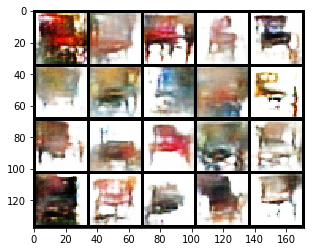

Epoch 210: Train D loss: -0.4836, G loss: 0.2790
Epoch 211: Train D loss: -0.5104, G loss: 0.2552
Epoch 212: Train D loss: -0.4999, G loss: 0.2942
Epoch 213: Train D loss: -0.5104, G loss: 0.3117
Epoch 214: Train D loss: -0.5041, G loss: 0.3837
Epoch 215: Train D loss: -0.4994, G loss: 0.2465
Epoch 216: Train D loss: -0.4959, G loss: 0.3153
Epoch 217: Train D loss: -0.5022, G loss: 0.3239
Epoch 218: Train D loss: -0.4544, G loss: 0.2433
Epoch 219: Train D loss: -0.5095, G loss: 0.3560


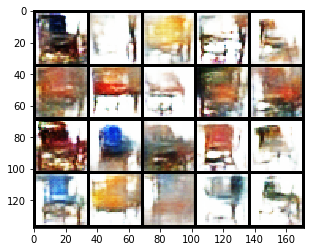

Epoch 220: Train D loss: -0.5032, G loss: 0.3249
Epoch 221: Train D loss: -0.5070, G loss: 0.3531
Epoch 222: Train D loss: -0.4967, G loss: 0.2803
Epoch 223: Train D loss: -0.4783, G loss: 0.3272
Epoch 224: Train D loss: -0.5104, G loss: 0.2617
Epoch 225: Train D loss: -0.4608, G loss: 0.2774
Epoch 226: Train D loss: -0.4901, G loss: 0.2608
Epoch 227: Train D loss: -0.3900, G loss: 0.2275
Epoch 228: Train D loss: -0.5063, G loss: 0.2569
Epoch 229: Train D loss: -0.4785, G loss: 0.2647


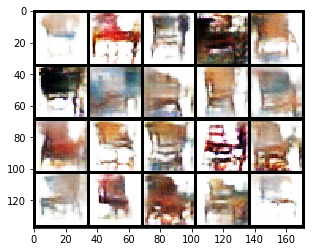

Epoch 230: Train D loss: -0.5254, G loss: 0.2948
Epoch 231: Train D loss: -0.4891, G loss: 0.2671
Epoch 232: Train D loss: -0.4692, G loss: 0.2514
Epoch 233: Train D loss: -0.5361, G loss: 0.3327
Epoch 234: Train D loss: -0.4584, G loss: 0.3097
Epoch 235: Train D loss: -0.4639, G loss: 0.2663
Epoch 236: Train D loss: -0.4426, G loss: 0.2553
Epoch 237: Train D loss: -0.4704, G loss: 0.2311
Epoch 238: Train D loss: -0.4614, G loss: 0.1981
Epoch 239: Train D loss: -0.4609, G loss: 0.2145


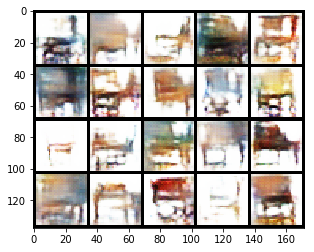

Epoch 240: Train D loss: -0.4961, G loss: 0.2473
Epoch 241: Train D loss: -0.4723, G loss: 0.4101
Epoch 242: Train D loss: -0.4699, G loss: 0.3139
Epoch 243: Train D loss: -0.4464, G loss: 0.2027
Epoch 244: Train D loss: -0.4803, G loss: 0.3156
Epoch 245: Train D loss: -0.4688, G loss: 0.2364
Epoch 246: Train D loss: -0.4701, G loss: 0.3440
Epoch 247: Train D loss: -0.4374, G loss: 0.2323
Epoch 248: Train D loss: -0.5052, G loss: 0.3188
Epoch 249: Train D loss: -0.4393, G loss: 0.2144


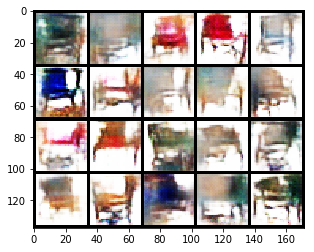

Epoch 250: Train D loss: -0.4826, G loss: 0.1651
Epoch 251: Train D loss: -0.4751, G loss: 0.2886
Epoch 252: Train D loss: -0.4248, G loss: 0.2145
Epoch 253: Train D loss: -0.4764, G loss: 0.3011
Epoch 254: Train D loss: -0.4466, G loss: 0.2620
Epoch 255: Train D loss: -0.4883, G loss: 0.3074
Epoch 256: Train D loss: -0.4487, G loss: 0.2253
Epoch 257: Train D loss: -0.4822, G loss: 0.2932
Epoch 258: Train D loss: -0.4350, G loss: 0.1337
Epoch 259: Train D loss: -0.4941, G loss: 0.3923


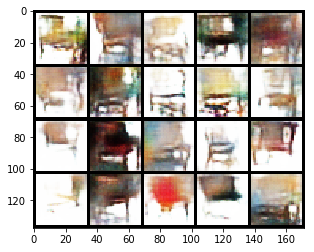

Epoch 260: Train D loss: -0.4494, G loss: 0.3552
Epoch 261: Train D loss: -0.4391, G loss: 0.3304
Epoch 262: Train D loss: -0.4593, G loss: 0.3061
Epoch 263: Train D loss: -0.4521, G loss: 0.3054
Epoch 264: Train D loss: -0.4637, G loss: 0.2291
Epoch 265: Train D loss: -0.4427, G loss: 0.2309
Epoch 266: Train D loss: -0.5055, G loss: 0.3679
Epoch 267: Train D loss: -0.4181, G loss: 0.2505
Epoch 268: Train D loss: -0.4683, G loss: 0.2268
Epoch 269: Train D loss: -0.4757, G loss: 0.3248


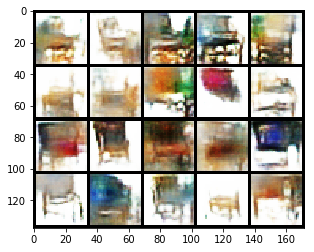

Epoch 270: Train D loss: -0.4272, G loss: 0.2749
Epoch 271: Train D loss: -0.4899, G loss: 0.3062
Epoch 272: Train D loss: -0.4443, G loss: 0.2997
Epoch 273: Train D loss: -0.4596, G loss: 0.3770
Epoch 274: Train D loss: -0.4142, G loss: 0.1633
Epoch 275: Train D loss: -0.4624, G loss: 0.3204
Epoch 276: Train D loss: -0.4526, G loss: 0.2318
Epoch 277: Train D loss: -0.4249, G loss: 0.2222
Epoch 278: Train D loss: -0.4641, G loss: 0.2651
Epoch 279: Train D loss: -0.4150, G loss: 0.1592


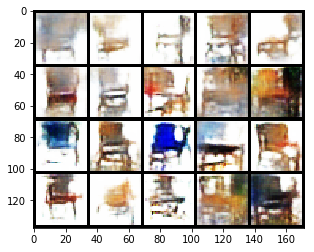

Epoch 280: Train D loss: -0.4742, G loss: 0.2347
Epoch 281: Train D loss: -0.4424, G loss: 0.2819
Epoch 282: Train D loss: -0.4401, G loss: 0.2916
Epoch 283: Train D loss: -0.4300, G loss: 0.1675
Epoch 284: Train D loss: -0.4493, G loss: 0.2281
Epoch 285: Train D loss: -0.4502, G loss: 0.3167
Epoch 286: Train D loss: -0.4024, G loss: 0.2038
Epoch 287: Train D loss: -0.4358, G loss: 0.3284
Epoch 288: Train D loss: -0.4372, G loss: 0.1923
Epoch 289: Train D loss: -0.4378, G loss: 0.3098


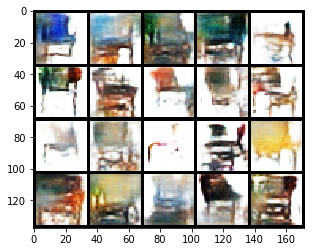

Epoch 290: Train D loss: -0.4577, G loss: 0.3169
Epoch 291: Train D loss: -0.4320, G loss: 0.1658
Epoch 292: Train D loss: -0.4326, G loss: 0.3083
Epoch 293: Train D loss: -0.4634, G loss: 0.3167
Epoch 294: Train D loss: -0.4202, G loss: 0.2734
Epoch 295: Train D loss: -0.4406, G loss: 0.2476
Epoch 296: Train D loss: -0.4408, G loss: 0.2652
Epoch 297: Train D loss: -0.4212, G loss: 0.3240
Epoch 298: Train D loss: -0.4385, G loss: 0.3078
Epoch 299: Train D loss: -0.4239, G loss: 0.2486


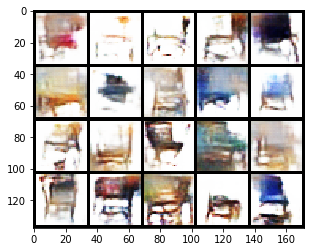

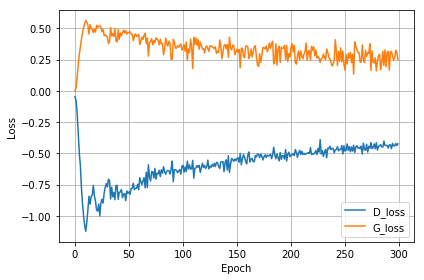

In [37]:
n_d = 3

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

Epoch 0: Train D loss: -0.0198, G loss: 0.0097


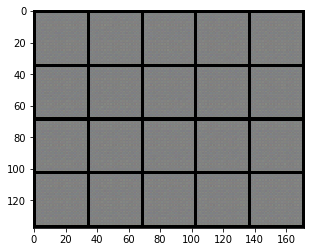

Epoch 1: Train D loss: -0.1131, G loss: 0.0508
Epoch 2: Train D loss: -0.2826, G loss: 0.1605
Epoch 3: Train D loss: -0.5035, G loss: 0.2693
Epoch 4: Train D loss: -0.6915, G loss: 0.3581
Epoch 5: Train D loss: -0.8106, G loss: 0.4121
Epoch 6: Train D loss: -0.9184, G loss: 0.4653
Epoch 7: Train D loss: -1.0123, G loss: 0.5043
Epoch 8: Train D loss: -1.0340, G loss: 0.5214
Epoch 9: Train D loss: -1.1067, G loss: 0.5392


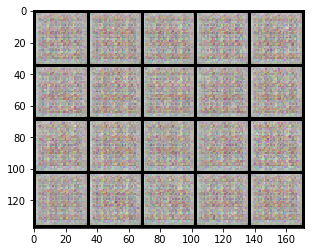

Epoch 10: Train D loss: -1.1632, G loss: 0.5671
Epoch 11: Train D loss: -1.0625, G loss: 0.5770
Epoch 12: Train D loss: -1.1206, G loss: 0.5703
Epoch 13: Train D loss: -1.2257, G loss: 0.5891
Epoch 14: Train D loss: -1.2547, G loss: 0.6006
Epoch 15: Train D loss: -1.2791, G loss: 0.6106
Epoch 16: Train D loss: -1.2937, G loss: 0.6146
Epoch 17: Train D loss: -1.3014, G loss: 0.6187
Epoch 18: Train D loss: -1.3097, G loss: 0.6223
Epoch 19: Train D loss: -1.3217, G loss: 0.6267


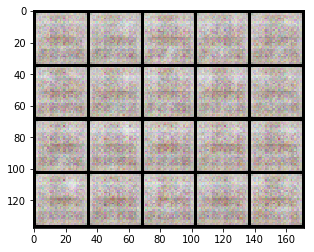

Epoch 20: Train D loss: -1.3322, G loss: 0.6313
Epoch 21: Train D loss: -1.2628, G loss: 0.6193
Epoch 22: Train D loss: -1.3007, G loss: 0.6269
Epoch 23: Train D loss: -1.2960, G loss: 0.6230
Epoch 24: Train D loss: -1.2307, G loss: 0.6215
Epoch 25: Train D loss: -0.9329, G loss: 0.5251
Epoch 26: Train D loss: -0.8023, G loss: 0.5534
Epoch 27: Train D loss: -1.1582, G loss: 0.6150
Epoch 28: Train D loss: -1.2284, G loss: 0.6082
Epoch 29: Train D loss: -1.2607, G loss: 0.6208


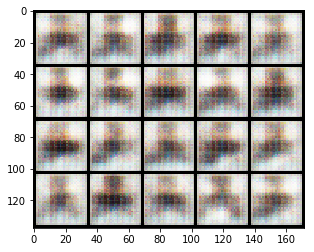

Epoch 30: Train D loss: -1.2264, G loss: 0.6090
Epoch 31: Train D loss: -1.1846, G loss: 0.5710
Epoch 32: Train D loss: -0.7592, G loss: 0.5176
Epoch 33: Train D loss: -1.0970, G loss: 0.5796
Epoch 34: Train D loss: -0.9941, G loss: 0.5337
Epoch 35: Train D loss: -1.0656, G loss: 0.5703
Epoch 36: Train D loss: -1.1181, G loss: 0.5785
Epoch 37: Train D loss: -1.1014, G loss: 0.5800
Epoch 38: Train D loss: -1.1297, G loss: 0.5631
Epoch 39: Train D loss: -1.1130, G loss: 0.5571


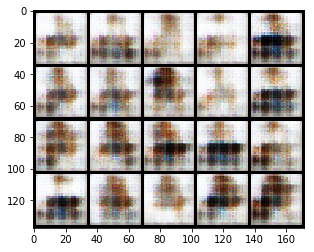

Epoch 40: Train D loss: -1.0765, G loss: 0.5651
Epoch 41: Train D loss: -1.1595, G loss: 0.5828
Epoch 42: Train D loss: -1.0573, G loss: 0.5500
Epoch 43: Train D loss: -1.0075, G loss: 0.5579
Epoch 44: Train D loss: -1.0917, G loss: 0.5586
Epoch 45: Train D loss: -1.0752, G loss: 0.5401
Epoch 46: Train D loss: -0.9137, G loss: 0.5435
Epoch 47: Train D loss: -0.9185, G loss: 0.4954
Epoch 48: Train D loss: -0.9151, G loss: 0.5217
Epoch 49: Train D loss: -0.8889, G loss: 0.4794


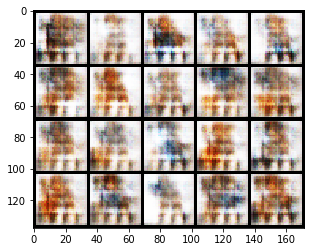

Epoch 50: Train D loss: -0.9925, G loss: 0.5511
Epoch 51: Train D loss: -0.9416, G loss: 0.5407
Epoch 52: Train D loss: -0.7997, G loss: 0.2968
Epoch 53: Train D loss: -1.0195, G loss: 0.5557
Epoch 54: Train D loss: -1.0446, G loss: 0.5526
Epoch 55: Train D loss: -0.8569, G loss: 0.4895
Epoch 56: Train D loss: -0.8356, G loss: 0.4521
Epoch 57: Train D loss: -0.8637, G loss: 0.4660
Epoch 58: Train D loss: -0.9220, G loss: 0.5136
Epoch 59: Train D loss: -0.8363, G loss: 0.4855


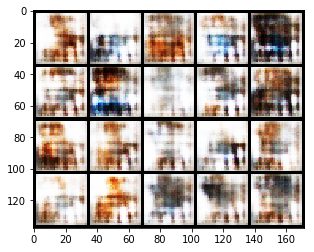

Epoch 60: Train D loss: -0.8378, G loss: 0.4585
Epoch 61: Train D loss: -0.8951, G loss: 0.5024
Epoch 62: Train D loss: -0.9093, G loss: 0.5016
Epoch 63: Train D loss: -0.9195, G loss: 0.5154
Epoch 64: Train D loss: -0.8158, G loss: 0.4441
Epoch 65: Train D loss: -0.8531, G loss: 0.5028
Epoch 66: Train D loss: -0.8943, G loss: 0.4790
Epoch 67: Train D loss: -0.7711, G loss: 0.4707
Epoch 68: Train D loss: -0.8983, G loss: 0.4853
Epoch 69: Train D loss: -0.8143, G loss: 0.4584


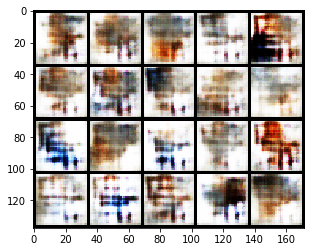

Epoch 70: Train D loss: -0.7899, G loss: 0.4659
Epoch 71: Train D loss: -0.9318, G loss: 0.4776
Epoch 72: Train D loss: -0.7242, G loss: 0.4087
Epoch 73: Train D loss: -0.8434, G loss: 0.4905
Epoch 74: Train D loss: -0.8659, G loss: 0.4751
Epoch 75: Train D loss: -0.8143, G loss: 0.4669
Epoch 76: Train D loss: -0.8731, G loss: 0.4992
Epoch 77: Train D loss: -0.8304, G loss: 0.5049
Epoch 78: Train D loss: -0.8423, G loss: 0.4577
Epoch 79: Train D loss: -0.8992, G loss: 0.4947


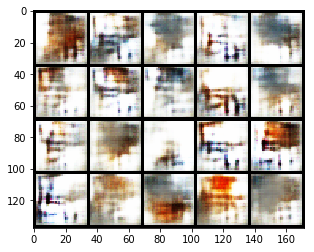

Epoch 80: Train D loss: -0.8047, G loss: 0.4656
Epoch 81: Train D loss: -0.8601, G loss: 0.4637
Epoch 82: Train D loss: -0.8368, G loss: 0.4802
Epoch 83: Train D loss: -0.9027, G loss: 0.4576
Epoch 84: Train D loss: -0.8396, G loss: 0.4455
Epoch 85: Train D loss: -0.8466, G loss: 0.4824
Epoch 86: Train D loss: -0.9074, G loss: 0.4830
Epoch 87: Train D loss: -0.9000, G loss: 0.4454
Epoch 88: Train D loss: -0.9182, G loss: 0.5159
Epoch 89: Train D loss: -0.8145, G loss: 0.4506


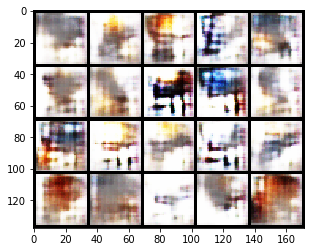

Epoch 90: Train D loss: -0.8825, G loss: 0.4523
Epoch 91: Train D loss: -0.8891, G loss: 0.4840
Epoch 92: Train D loss: -0.7874, G loss: 0.4091
Epoch 93: Train D loss: -0.8492, G loss: 0.4522
Epoch 94: Train D loss: -0.8276, G loss: 0.4790
Epoch 95: Train D loss: -0.8630, G loss: 0.4613
Epoch 96: Train D loss: -0.8170, G loss: 0.4130
Epoch 97: Train D loss: -0.8641, G loss: 0.4549
Epoch 98: Train D loss: -0.8449, G loss: 0.4553
Epoch 99: Train D loss: -0.8262, G loss: 0.3772


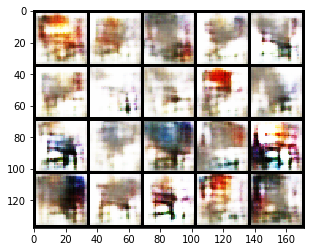

Epoch 100: Train D loss: -0.8314, G loss: 0.4051
Epoch 101: Train D loss: -0.7493, G loss: 0.3292
Epoch 102: Train D loss: -0.8250, G loss: 0.4514
Epoch 103: Train D loss: -0.8199, G loss: 0.4431
Epoch 104: Train D loss: -0.7600, G loss: 0.3646
Epoch 105: Train D loss: -0.8331, G loss: 0.4249
Epoch 106: Train D loss: -0.8029, G loss: 0.4482
Epoch 107: Train D loss: -0.7823, G loss: 0.3601
Epoch 108: Train D loss: -0.7651, G loss: 0.3211
Epoch 109: Train D loss: -0.7973, G loss: 0.4664


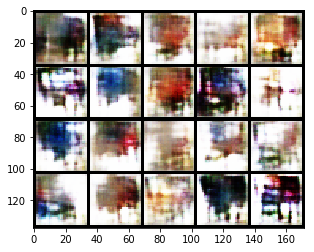

Epoch 110: Train D loss: -0.8028, G loss: 0.4332
Epoch 111: Train D loss: -0.7711, G loss: 0.4012
Epoch 112: Train D loss: -0.8269, G loss: 0.4578
Epoch 113: Train D loss: -0.7512, G loss: 0.4554
Epoch 114: Train D loss: -0.7668, G loss: 0.4635
Epoch 115: Train D loss: -0.7201, G loss: 0.3435
Epoch 116: Train D loss: -0.7752, G loss: 0.3945
Epoch 117: Train D loss: -0.7790, G loss: 0.4219
Epoch 118: Train D loss: -0.7338, G loss: 0.4124
Epoch 119: Train D loss: -0.7514, G loss: 0.4092


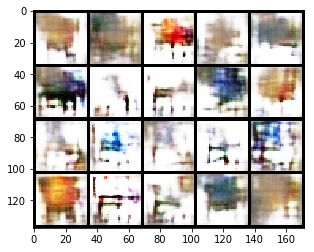

Epoch 120: Train D loss: -0.7049, G loss: 0.3725
Epoch 121: Train D loss: -0.7481, G loss: 0.4316
Epoch 122: Train D loss: -0.7647, G loss: 0.3964
Epoch 123: Train D loss: -0.7601, G loss: 0.4346
Epoch 124: Train D loss: -0.7386, G loss: 0.4042
Epoch 125: Train D loss: -0.6975, G loss: 0.3752
Epoch 126: Train D loss: -0.7384, G loss: 0.4284
Epoch 127: Train D loss: -0.6740, G loss: 0.3464
Epoch 128: Train D loss: -0.7736, G loss: 0.4479
Epoch 129: Train D loss: -0.6937, G loss: 0.3188


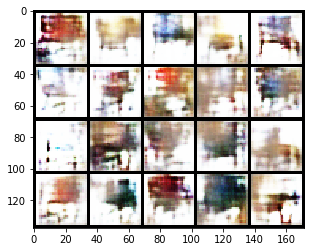

Epoch 130: Train D loss: -0.6979, G loss: 0.3829
Epoch 131: Train D loss: -0.8010, G loss: 0.4050
Epoch 132: Train D loss: -0.6421, G loss: 0.4088
Epoch 133: Train D loss: -0.7565, G loss: 0.4471
Epoch 134: Train D loss: -0.7433, G loss: 0.3689
Epoch 135: Train D loss: -0.6913, G loss: 0.3490
Epoch 136: Train D loss: -0.7015, G loss: 0.3794
Epoch 137: Train D loss: -0.7226, G loss: 0.3315
Epoch 138: Train D loss: -0.7601, G loss: 0.4692
Epoch 139: Train D loss: -0.7668, G loss: 0.4079


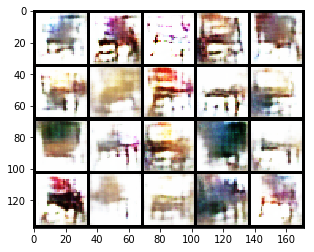

Epoch 140: Train D loss: -0.6386, G loss: 0.4209
Epoch 141: Train D loss: -0.7619, G loss: 0.4416
Epoch 142: Train D loss: -0.6863, G loss: 0.3911
Epoch 143: Train D loss: -0.6805, G loss: 0.3228
Epoch 144: Train D loss: -0.7210, G loss: 0.3229
Epoch 145: Train D loss: -0.6937, G loss: 0.3884
Epoch 146: Train D loss: -0.7265, G loss: 0.3700
Epoch 147: Train D loss: -0.6243, G loss: 0.2709
Epoch 148: Train D loss: -0.7460, G loss: 0.4125
Epoch 149: Train D loss: -0.7737, G loss: 0.4418


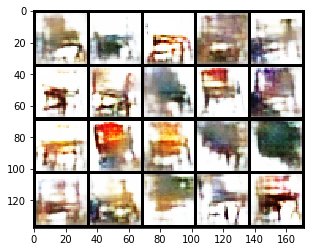

Epoch 150: Train D loss: -0.6511, G loss: 0.3526
Epoch 151: Train D loss: -0.6925, G loss: 0.4648
Epoch 152: Train D loss: -0.7460, G loss: 0.4128
Epoch 153: Train D loss: -0.6390, G loss: 0.1739
Epoch 154: Train D loss: -0.7256, G loss: 0.4113
Epoch 155: Train D loss: -0.7146, G loss: 0.3862
Epoch 156: Train D loss: -0.7032, G loss: 0.4097
Epoch 157: Train D loss: -0.6861, G loss: 0.4200
Epoch 158: Train D loss: -0.7136, G loss: 0.3911
Epoch 159: Train D loss: -0.6754, G loss: 0.3577


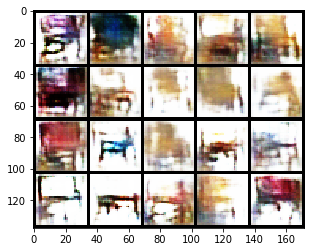

Epoch 160: Train D loss: -0.7339, G loss: 0.4791
Epoch 161: Train D loss: -0.7266, G loss: 0.3384
Epoch 162: Train D loss: -0.6368, G loss: 0.3079
Epoch 163: Train D loss: -0.6930, G loss: 0.3500
Epoch 164: Train D loss: -0.7003, G loss: 0.4007
Epoch 165: Train D loss: -0.7385, G loss: 0.4101
Epoch 166: Train D loss: -0.6794, G loss: 0.4472
Epoch 167: Train D loss: -0.6796, G loss: 0.3785
Epoch 168: Train D loss: -0.6912, G loss: 0.2843
Epoch 169: Train D loss: -0.6520, G loss: 0.3935


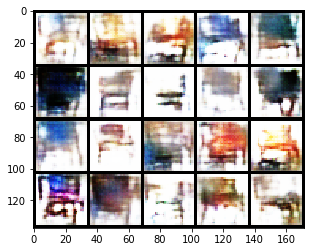

Epoch 170: Train D loss: -0.6700, G loss: 0.2750
Epoch 171: Train D loss: -0.6949, G loss: 0.3515
Epoch 172: Train D loss: -0.7393, G loss: 0.4540
Epoch 173: Train D loss: -0.6947, G loss: 0.3355
Epoch 174: Train D loss: -0.6870, G loss: 0.3960
Epoch 175: Train D loss: -0.7134, G loss: 0.3846
Epoch 176: Train D loss: -0.6603, G loss: 0.4008
Epoch 177: Train D loss: -0.6812, G loss: 0.3764
Epoch 178: Train D loss: -0.6806, G loss: 0.3792
Epoch 179: Train D loss: -0.6722, G loss: 0.3884


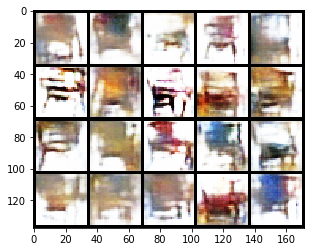

Epoch 180: Train D loss: -0.6487, G loss: 0.3402
Epoch 181: Train D loss: -0.7006, G loss: 0.3484
Epoch 182: Train D loss: -0.6693, G loss: 0.3796
Epoch 183: Train D loss: -0.6667, G loss: 0.3687
Epoch 184: Train D loss: -0.7043, G loss: 0.3611
Epoch 185: Train D loss: -0.6218, G loss: 0.3461
Epoch 186: Train D loss: -0.6741, G loss: 0.3754
Epoch 187: Train D loss: -0.6340, G loss: 0.2533
Epoch 188: Train D loss: -0.6999, G loss: 0.4093
Epoch 189: Train D loss: -0.6637, G loss: 0.3316


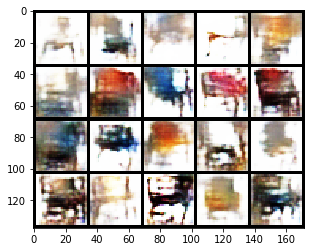

Epoch 190: Train D loss: -0.6413, G loss: 0.4231
Epoch 191: Train D loss: -0.6419, G loss: 0.2647
Epoch 192: Train D loss: -0.6735, G loss: 0.3619
Epoch 193: Train D loss: -0.6245, G loss: 0.3269
Epoch 194: Train D loss: -0.6657, G loss: 0.3901
Epoch 195: Train D loss: -0.6513, G loss: 0.3871
Epoch 196: Train D loss: -0.6943, G loss: 0.3859
Epoch 197: Train D loss: -0.6188, G loss: 0.3336
Epoch 198: Train D loss: -0.6989, G loss: 0.4511
Epoch 199: Train D loss: -0.6444, G loss: 0.3211


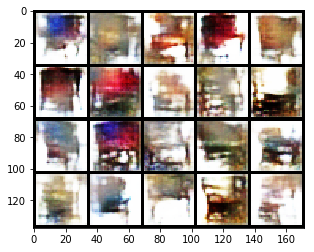

Epoch 200: Train D loss: -0.6087, G loss: 0.3368
Epoch 201: Train D loss: -0.6109, G loss: 0.2995
Epoch 202: Train D loss: -0.6175, G loss: 0.2406
Epoch 203: Train D loss: -0.6625, G loss: 0.3707
Epoch 204: Train D loss: -0.6293, G loss: 0.4053
Epoch 205: Train D loss: -0.6208, G loss: 0.4291
Epoch 206: Train D loss: -0.6523, G loss: 0.4523
Epoch 207: Train D loss: -0.6461, G loss: 0.2929
Epoch 208: Train D loss: -0.6337, G loss: 0.3101
Epoch 209: Train D loss: -0.6518, G loss: 0.3374


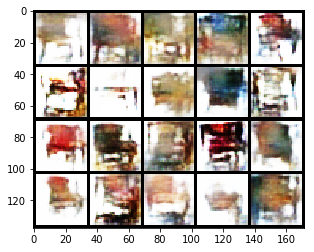

Epoch 210: Train D loss: -0.6572, G loss: 0.3786
Epoch 211: Train D loss: -0.6560, G loss: 0.3517
Epoch 212: Train D loss: -0.6378, G loss: 0.3040
Epoch 213: Train D loss: -0.6481, G loss: 0.3379
Epoch 214: Train D loss: -0.5941, G loss: 0.3721
Epoch 215: Train D loss: -0.6826, G loss: 0.4003
Epoch 216: Train D loss: -0.6002, G loss: 0.3126
Epoch 217: Train D loss: -0.6121, G loss: 0.3407
Epoch 218: Train D loss: -0.6536, G loss: 0.3619
Epoch 219: Train D loss: -0.6194, G loss: 0.2893


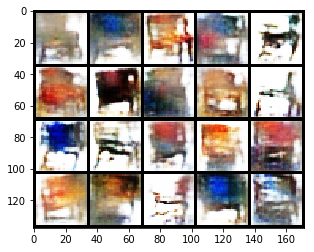

Epoch 220: Train D loss: -0.5911, G loss: 0.3709
Epoch 221: Train D loss: -0.6282, G loss: 0.2985
Epoch 222: Train D loss: -0.6219, G loss: 0.4535
Epoch 223: Train D loss: -0.6131, G loss: 0.3427
Epoch 224: Train D loss: -0.6181, G loss: 0.4004
Epoch 225: Train D loss: -0.6112, G loss: 0.2469
Epoch 226: Train D loss: -0.6197, G loss: 0.3642
Epoch 227: Train D loss: -0.6605, G loss: 0.4451
Epoch 228: Train D loss: -0.6502, G loss: 0.4343
Epoch 229: Train D loss: -0.5931, G loss: 0.2842


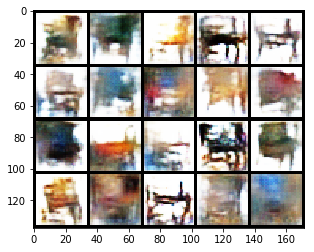

Epoch 230: Train D loss: -0.6169, G loss: 0.3876
Epoch 231: Train D loss: -0.6392, G loss: 0.3989
Epoch 232: Train D loss: -0.6269, G loss: 0.3668
Epoch 233: Train D loss: -0.6208, G loss: 0.3267
Epoch 234: Train D loss: -0.6006, G loss: 0.3478
Epoch 235: Train D loss: -0.6405, G loss: 0.3376
Epoch 236: Train D loss: -0.6255, G loss: 0.4145
Epoch 237: Train D loss: -0.6208, G loss: 0.3717
Epoch 238: Train D loss: -0.6040, G loss: 0.3124
Epoch 239: Train D loss: -0.5637, G loss: 0.3349


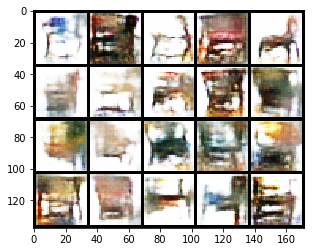

Epoch 240: Train D loss: -0.6930, G loss: 0.4273
Epoch 241: Train D loss: -0.6033, G loss: 0.3814
Epoch 242: Train D loss: -0.6266, G loss: 0.3832
Epoch 243: Train D loss: -0.5626, G loss: 0.3015
Epoch 244: Train D loss: -0.6179, G loss: 0.4086
Epoch 245: Train D loss: -0.6367, G loss: 0.3253
Epoch 246: Train D loss: -0.5475, G loss: 0.2680
Epoch 247: Train D loss: -0.6162, G loss: 0.2718
Epoch 248: Train D loss: -0.6100, G loss: 0.3057
Epoch 249: Train D loss: -0.6372, G loss: 0.4206


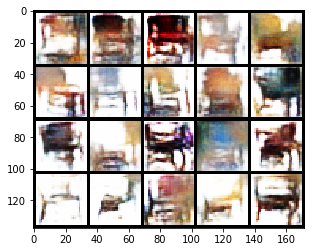

Epoch 250: Train D loss: -0.5909, G loss: 0.3363
Epoch 251: Train D loss: -0.5409, G loss: 0.2165
Epoch 252: Train D loss: -0.6085, G loss: 0.2911
Epoch 253: Train D loss: -0.6093, G loss: 0.3385
Epoch 254: Train D loss: -0.6151, G loss: 0.4036
Epoch 255: Train D loss: -0.5898, G loss: 0.3968
Epoch 256: Train D loss: -0.6219, G loss: 0.3772
Epoch 257: Train D loss: -0.5611, G loss: 0.2543
Epoch 258: Train D loss: -0.5731, G loss: 0.2995
Epoch 259: Train D loss: -0.6556, G loss: 0.3799


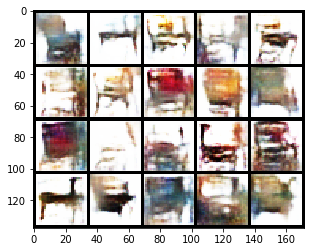

Epoch 260: Train D loss: -0.5793, G loss: 0.2867
Epoch 261: Train D loss: -0.5820, G loss: 0.3679
Epoch 262: Train D loss: -0.6045, G loss: 0.2327
Epoch 263: Train D loss: -0.5749, G loss: 0.3772
Epoch 264: Train D loss: -0.6203, G loss: 0.2189
Epoch 265: Train D loss: -0.5593, G loss: 0.2788
Epoch 266: Train D loss: -0.5974, G loss: 0.3889
Epoch 267: Train D loss: -0.5803, G loss: 0.1553
Epoch 268: Train D loss: -0.5752, G loss: 0.3857
Epoch 269: Train D loss: -0.6145, G loss: 0.3681


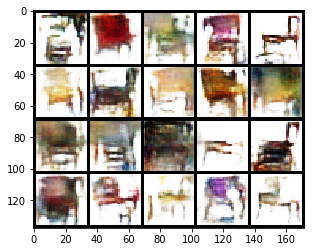

Epoch 270: Train D loss: -0.5433, G loss: 0.3201
Epoch 271: Train D loss: -0.6065, G loss: 0.3425
Epoch 272: Train D loss: -0.5915, G loss: 0.2303
Epoch 273: Train D loss: -0.5661, G loss: 0.2688
Epoch 274: Train D loss: -0.5966, G loss: 0.3543
Epoch 275: Train D loss: -0.6075, G loss: 0.3962
Epoch 276: Train D loss: -0.6023, G loss: 0.3994
Epoch 277: Train D loss: -0.5532, G loss: 0.3245
Epoch 278: Train D loss: -0.5761, G loss: 0.3722
Epoch 279: Train D loss: -0.6018, G loss: 0.4222


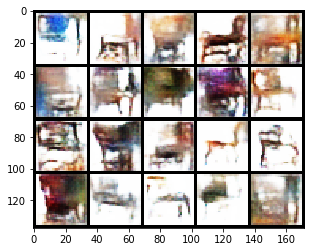

Epoch 280: Train D loss: -0.5490, G loss: 0.3603
Epoch 281: Train D loss: -0.5517, G loss: 0.2391
Epoch 282: Train D loss: -0.5893, G loss: 0.2904
Epoch 283: Train D loss: -0.5978, G loss: 0.4153
Epoch 284: Train D loss: -0.5253, G loss: 0.1467
Epoch 285: Train D loss: -0.5742, G loss: 0.2185
Epoch 286: Train D loss: -0.5618, G loss: 0.3087
Epoch 287: Train D loss: -0.5715, G loss: 0.3458
Epoch 288: Train D loss: -0.6204, G loss: 0.3883
Epoch 289: Train D loss: -0.5147, G loss: 0.2745


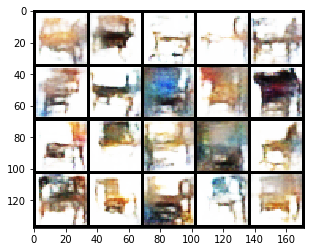

Epoch 290: Train D loss: -0.5390, G loss: 0.3540
Epoch 291: Train D loss: -0.6113, G loss: 0.3609
Epoch 292: Train D loss: -0.5546, G loss: 0.3982
Epoch 293: Train D loss: -0.6150, G loss: 0.4705
Epoch 294: Train D loss: -0.5271, G loss: 0.2089
Epoch 295: Train D loss: -0.5532, G loss: 0.4143
Epoch 296: Train D loss: -0.6274, G loss: 0.3702
Epoch 297: Train D loss: -0.5044, G loss: 0.3294
Epoch 298: Train D loss: -0.6415, G loss: 0.3842
Epoch 299: Train D loss: -0.5975, G loss: 0.4136


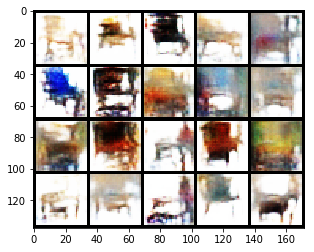

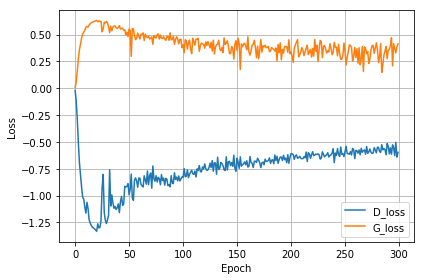

In [18]:
n_d = 5

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

## WGAN-GP(improved wgan)

在WGAN中，需要进行截断, 在实验中发现： 对于比较深的WAGN，它不容易收敛。

大致原因如下：
1. 实验发现最后大多数的权重都在-c 和c上,这就意味了大部分权重只有两个可能数,这太简单了,作为一个深度神经网络来说,这实在是对它强大的拟合能力的浪费.
2. 实验发现容易导致梯度消失或梯度爆炸。判别器是一个多层网络，如果把clip的值设得稍微小了一点,每经过一层网络,梯度就变小一点点,多层之后就会指数衰减；反之,则容易导致梯度爆炸.

所以WGAN-GP使用了Gradient penalty(梯度惩罚）来代替clip.
因为Lipschitz限制是要求判别器的梯度不超过K,所以可以直接使用一个loss term来实现这一点,所以改进后D的优化目标改进为如下:
![wgan_gp](pictures/wgan-gp.svg)

下面是WGAN-GP的具体代码实现,同WGAN,我们也只实现了他的训练代码,而模型我们直接使用DCGAN的模型.

In [19]:
import torch.autograd as autograd

def wgan_gp_train(trainloader, G, D, G_optimizer, D_optimizer, device, z_dim, lambda_=10, n_d=2):
    
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    
    for i, (x, _) in enumerate(trainloader):
        x = x.to(device)

        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = - d_real.mean()
        
        # D fake loss from fake images generated by G
        z = torch.rand(x.size(0), z_dim).to(device)
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = d_fake.mean()
        
        # D gradient penalty
        
        #   a random number epsilon
        epsilon = torch.rand(x.size(0), 1, 1, 1).cuda()
        x_hat = epsilon * x + (1 - epsilon) * g_z
        x_hat.requires_grad_(True)

        y_hat = D(x_hat)
        #   computes the sum of gradients of y_hat with regard to x_hat
        gradients = autograd.grad(outputs=y_hat, inputs=x_hat, grad_outputs=torch.ones(y_hat.size()).cuda(),
                                  create_graph=True, retain_graph=True, only_inputs=True)[0]
        #   computes gradientpenalty
        gradient_penalty =  torch.mean((gradients.view(gradients.size()[0], -1).norm(p=2, dim=1) - 1) ** 2)
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss + lambda_ * gradient_penalty
        d_loss.backward()
        D_optimizer.step()
        
            
        D_total_loss += d_loss.item()

        # update G network
        # G optimizer zero grads
        if (i + 1) % n_d == 0:
            G_optimizer.zero_grad()

            # G loss
            g_z = G(z)
            d_fake = D(g_z)
            g_loss = - d_fake.mean()

            # G backward and step
            g_loss.backward()
            G_optimizer.step()
            
            G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss * n_d / len(trainloader)

Epoch 0: Train D loss: 2.5919, G loss: 1.7363


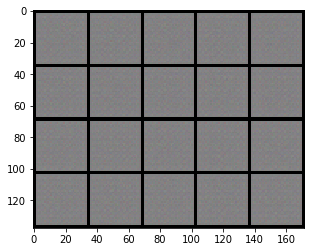

Epoch 1: Train D loss: -6.5004, G loss: 6.1050
Epoch 2: Train D loss: -13.1526, G loss: 14.7819
Epoch 3: Train D loss: -17.8123, G loss: 19.2166
Epoch 4: Train D loss: -20.3830, G loss: 22.9551
Epoch 5: Train D loss: -25.2327, G loss: 24.7386
Epoch 6: Train D loss: -17.9236, G loss: 20.7731
Epoch 7: Train D loss: -14.1315, G loss: 19.9102
Epoch 8: Train D loss: -14.8427, G loss: 19.6825
Epoch 9: Train D loss: -14.1483, G loss: 19.3490


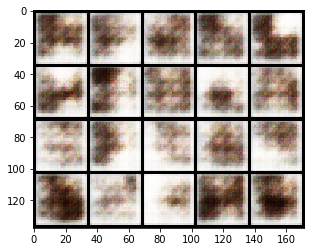

Epoch 10: Train D loss: -13.5081, G loss: 19.9491
Epoch 11: Train D loss: -11.9626, G loss: 19.5358
Epoch 12: Train D loss: -12.0270, G loss: 19.1619
Epoch 13: Train D loss: -12.3356, G loss: 19.9248
Epoch 14: Train D loss: -12.7105, G loss: 20.7018
Epoch 15: Train D loss: -11.8750, G loss: 20.2883
Epoch 16: Train D loss: -12.1353, G loss: 20.3978
Epoch 17: Train D loss: -12.1025, G loss: 20.6677
Epoch 18: Train D loss: -12.0372, G loss: 20.8782
Epoch 19: Train D loss: -11.0079, G loss: 20.7549


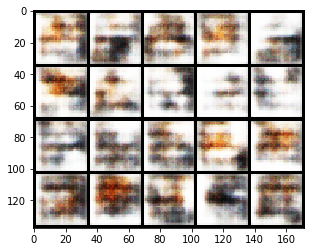

Epoch 20: Train D loss: -11.1339, G loss: 20.2970
Epoch 21: Train D loss: -11.4712, G loss: 21.1495
Epoch 22: Train D loss: -10.8928, G loss: 21.0110
Epoch 23: Train D loss: -10.8293, G loss: 21.1842
Epoch 24: Train D loss: -10.5641, G loss: 21.2808
Epoch 25: Train D loss: -5.0739, G loss: 22.4770
Epoch 26: Train D loss: -9.0415, G loss: 23.7104
Epoch 27: Train D loss: -10.5199, G loss: 21.8366
Epoch 28: Train D loss: -9.7312, G loss: 22.2437
Epoch 29: Train D loss: -11.2273, G loss: 23.0965


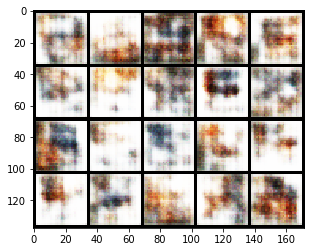

Epoch 30: Train D loss: -11.1076, G loss: 23.4190
Epoch 31: Train D loss: -8.4816, G loss: 22.9603
Epoch 32: Train D loss: -7.4608, G loss: 24.9089
Epoch 33: Train D loss: -10.0810, G loss: 24.6996
Epoch 34: Train D loss: -11.1573, G loss: 25.2486
Epoch 35: Train D loss: -10.7808, G loss: 25.4448
Epoch 36: Train D loss: -8.6799, G loss: 27.1834
Epoch 37: Train D loss: -10.3878, G loss: 26.3711
Epoch 38: Train D loss: -7.7966, G loss: 27.1496
Epoch 39: Train D loss: -8.9499, G loss: 26.3780


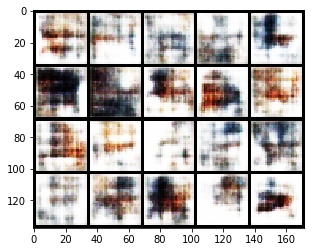

Epoch 40: Train D loss: -9.4657, G loss: 26.4384
Epoch 41: Train D loss: -4.3891, G loss: 23.2244
Epoch 42: Train D loss: -5.4060, G loss: 27.2604
Epoch 43: Train D loss: -7.6995, G loss: 26.3099
Epoch 44: Train D loss: -8.1084, G loss: 25.9957
Epoch 45: Train D loss: -7.5206, G loss: 25.9051
Epoch 46: Train D loss: -7.0287, G loss: 25.2533
Epoch 47: Train D loss: -7.1397, G loss: 26.1184
Epoch 48: Train D loss: -6.6834, G loss: 26.0089
Epoch 49: Train D loss: -6.3516, G loss: 25.7300


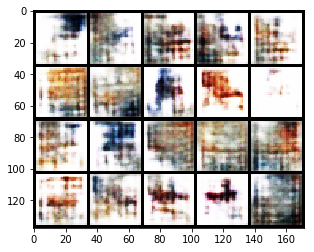

Epoch 50: Train D loss: -7.1611, G loss: 25.1080
Epoch 51: Train D loss: -5.7559, G loss: 26.9727
Epoch 52: Train D loss: -6.2263, G loss: 25.1270
Epoch 53: Train D loss: -5.9059, G loss: 26.3153
Epoch 54: Train D loss: -6.3170, G loss: 25.6972
Epoch 55: Train D loss: -6.4567, G loss: 25.5866
Epoch 56: Train D loss: -6.6545, G loss: 25.9032
Epoch 57: Train D loss: -6.1994, G loss: 24.5768
Epoch 58: Train D loss: -6.0487, G loss: 25.7202
Epoch 59: Train D loss: -5.3544, G loss: 23.1843


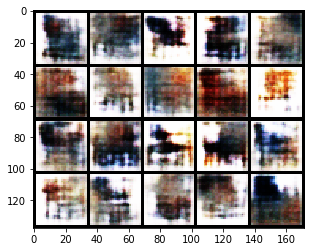

Epoch 60: Train D loss: -5.8534, G loss: 27.4401
Epoch 61: Train D loss: -5.5424, G loss: 25.1378
Epoch 62: Train D loss: -5.5727, G loss: 26.3593
Epoch 63: Train D loss: -6.0383, G loss: 26.3227
Epoch 64: Train D loss: -5.8512, G loss: 27.4760
Epoch 65: Train D loss: -5.3554, G loss: 25.7390
Epoch 66: Train D loss: -6.2503, G loss: 27.4245
Epoch 67: Train D loss: -7.0706, G loss: 27.3508
Epoch 68: Train D loss: -4.7493, G loss: 27.6041
Epoch 69: Train D loss: -3.4840, G loss: 24.4286


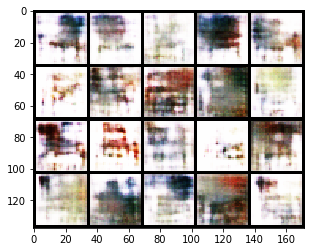

Epoch 70: Train D loss: -4.3833, G loss: 26.8104
Epoch 71: Train D loss: -5.1628, G loss: 26.6989
Epoch 72: Train D loss: -3.2869, G loss: 27.3914
Epoch 73: Train D loss: -4.5047, G loss: 28.6112
Epoch 74: Train D loss: -4.7387, G loss: 31.0332
Epoch 75: Train D loss: -5.5155, G loss: 28.1668
Epoch 76: Train D loss: -5.1990, G loss: 29.7024
Epoch 77: Train D loss: -5.8171, G loss: 29.2360
Epoch 78: Train D loss: -6.6720, G loss: 28.6343
Epoch 79: Train D loss: -5.6656, G loss: 29.8203


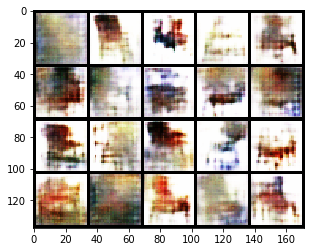

Epoch 80: Train D loss: -6.2753, G loss: 30.6063
Epoch 81: Train D loss: -5.1605, G loss: 30.2735
Epoch 82: Train D loss: -6.5401, G loss: 30.6307
Epoch 83: Train D loss: -5.9710, G loss: 29.5637
Epoch 84: Train D loss: -5.9129, G loss: 31.4728
Epoch 85: Train D loss: -5.8533, G loss: 30.2488
Epoch 86: Train D loss: -5.8074, G loss: 31.1671
Epoch 87: Train D loss: -6.8279, G loss: 34.8093
Epoch 88: Train D loss: -2.4652, G loss: 26.4779
Epoch 89: Train D loss: -0.2598, G loss: 27.3009


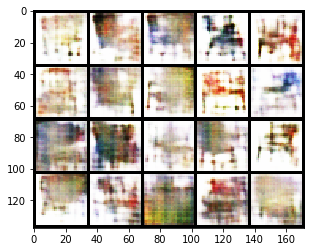

Epoch 90: Train D loss: -1.3241, G loss: 26.5360
Epoch 91: Train D loss: -1.5718, G loss: 28.2817
Epoch 92: Train D loss: -2.0637, G loss: 29.8358
Epoch 93: Train D loss: -3.0110, G loss: 29.5881
Epoch 94: Train D loss: -3.1753, G loss: 29.3761
Epoch 95: Train D loss: -3.6486, G loss: 30.4440
Epoch 96: Train D loss: -3.7570, G loss: 29.1026
Epoch 97: Train D loss: -4.4757, G loss: 31.8286
Epoch 98: Train D loss: -4.6304, G loss: 29.9051
Epoch 99: Train D loss: -4.7524, G loss: 31.1447


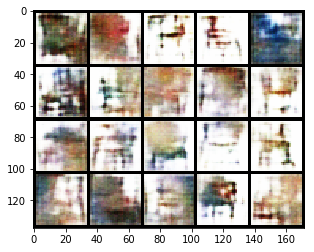

Epoch 100: Train D loss: -5.1365, G loss: 31.1841
Epoch 101: Train D loss: -5.1692, G loss: 31.4720
Epoch 102: Train D loss: -5.5064, G loss: 32.4258
Epoch 103: Train D loss: -5.7823, G loss: 33.5280
Epoch 104: Train D loss: -5.9317, G loss: 31.7293
Epoch 105: Train D loss: -5.6385, G loss: 34.3075
Epoch 106: Train D loss: -6.1860, G loss: 32.4611
Epoch 107: Train D loss: -5.6723, G loss: 34.4445
Epoch 108: Train D loss: -6.1891, G loss: 33.8608
Epoch 109: Train D loss: -5.8265, G loss: 33.4205


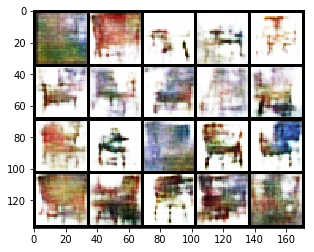

Epoch 110: Train D loss: -5.9044, G loss: 34.4135
Epoch 111: Train D loss: -6.4311, G loss: 34.0181
Epoch 112: Train D loss: -5.8944, G loss: 34.9957
Epoch 113: Train D loss: -6.3434, G loss: 35.4205
Epoch 114: Train D loss: -5.7913, G loss: 33.9328
Epoch 115: Train D loss: -5.7868, G loss: 35.3010
Epoch 116: Train D loss: -6.4763, G loss: 34.3844
Epoch 117: Train D loss: -6.3602, G loss: 35.1908
Epoch 118: Train D loss: -5.6722, G loss: 35.8426
Epoch 119: Train D loss: -6.2491, G loss: 33.3553


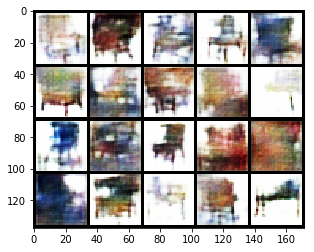

Epoch 120: Train D loss: -5.7893, G loss: 35.5707
Epoch 121: Train D loss: -5.9759, G loss: 34.3126
Epoch 122: Train D loss: -5.6108, G loss: 35.3836
Epoch 123: Train D loss: -5.9021, G loss: 36.0170
Epoch 124: Train D loss: -6.4310, G loss: 36.0905
Epoch 125: Train D loss: -5.8363, G loss: 35.0550
Epoch 126: Train D loss: -6.4382, G loss: 35.0563
Epoch 127: Train D loss: -6.5901, G loss: 35.2633
Epoch 128: Train D loss: -0.5099, G loss: 31.6730
Epoch 129: Train D loss: -2.4751, G loss: 35.8593


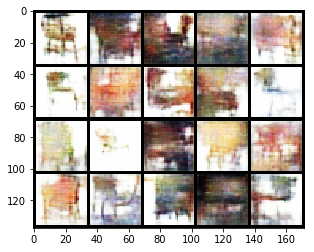

Epoch 130: Train D loss: -4.3797, G loss: 33.4827
Epoch 131: Train D loss: -4.7516, G loss: 38.0199
Epoch 132: Train D loss: -4.9161, G loss: 33.2042
Epoch 133: Train D loss: -5.3969, G loss: 35.9732
Epoch 134: Train D loss: -6.2891, G loss: 35.2115
Epoch 135: Train D loss: -5.9256, G loss: 37.3165
Epoch 136: Train D loss: -4.9249, G loss: 36.3607
Epoch 137: Train D loss: -5.7213, G loss: 37.7638
Epoch 138: Train D loss: -5.9596, G loss: 37.5689
Epoch 139: Train D loss: -6.1420, G loss: 35.7761


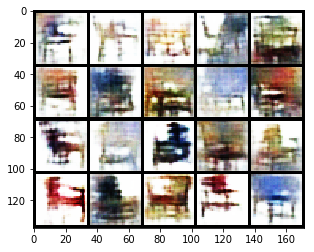

Epoch 140: Train D loss: -5.1706, G loss: 38.5213
Epoch 141: Train D loss: -7.3617, G loss: 36.8368
Epoch 142: Train D loss: -5.6230, G loss: 36.6514
Epoch 143: Train D loss: -4.9871, G loss: 36.4781
Epoch 144: Train D loss: -5.5339, G loss: 37.6093
Epoch 145: Train D loss: -6.7483, G loss: 37.8728
Epoch 146: Train D loss: -6.3351, G loss: 34.9735
Epoch 147: Train D loss: -5.7429, G loss: 38.3707
Epoch 148: Train D loss: -5.8863, G loss: 36.6282
Epoch 149: Train D loss: -6.0610, G loss: 38.2525


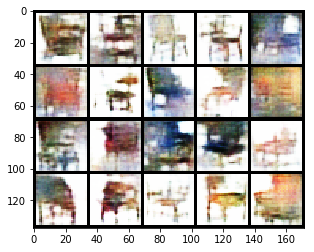

Epoch 150: Train D loss: -6.6945, G loss: 36.9976
Epoch 151: Train D loss: -1.1958, G loss: 35.4660
Epoch 152: Train D loss: -0.3987, G loss: 31.3385
Epoch 153: Train D loss: -0.0078, G loss: 29.1351
Epoch 154: Train D loss: -0.4196, G loss: 28.9742
Epoch 155: Train D loss: -1.0322, G loss: 30.4793
Epoch 156: Train D loss: -0.7965, G loss: 30.8435
Epoch 157: Train D loss: -1.5656, G loss: 31.3721
Epoch 158: Train D loss: -1.7656, G loss: 32.2162
Epoch 159: Train D loss: -1.8684, G loss: 32.1728


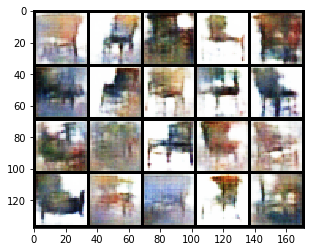

Epoch 160: Train D loss: -1.6434, G loss: 33.1505
Epoch 161: Train D loss: -2.0596, G loss: 33.4881
Epoch 162: Train D loss: -2.2183, G loss: 33.1451
Epoch 163: Train D loss: -2.5426, G loss: 35.5336
Epoch 164: Train D loss: -3.0535, G loss: 33.9914
Epoch 165: Train D loss: -3.2706, G loss: 37.3478
Epoch 166: Train D loss: -3.4155, G loss: 34.3405
Epoch 167: Train D loss: -3.5462, G loss: 36.5767
Epoch 168: Train D loss: -3.8053, G loss: 36.8466
Epoch 169: Train D loss: -4.0446, G loss: 35.6812


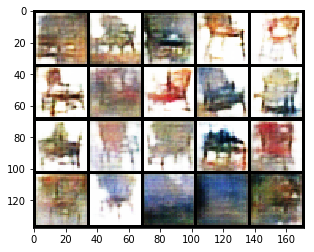

Epoch 170: Train D loss: -4.3286, G loss: 36.8845
Epoch 171: Train D loss: -4.2374, G loss: 35.0869
Epoch 172: Train D loss: -4.4847, G loss: 38.0462
Epoch 173: Train D loss: -4.6098, G loss: 36.9668
Epoch 174: Train D loss: -4.5573, G loss: 36.5792
Epoch 175: Train D loss: -4.5996, G loss: 37.9507
Epoch 176: Train D loss: -4.9096, G loss: 37.0997
Epoch 177: Train D loss: -4.8563, G loss: 38.4907
Epoch 178: Train D loss: -5.1508, G loss: 37.3299
Epoch 179: Train D loss: -5.0272, G loss: 38.5318


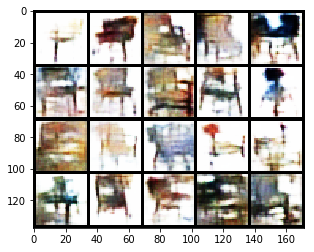

Epoch 180: Train D loss: -5.3232, G loss: 37.5262
Epoch 181: Train D loss: -4.7541, G loss: 40.2641
Epoch 182: Train D loss: -5.3290, G loss: 36.8552
Epoch 183: Train D loss: -5.4018, G loss: 38.9794
Epoch 184: Train D loss: -5.4185, G loss: 40.9429
Epoch 185: Train D loss: -5.6680, G loss: 37.7169
Epoch 186: Train D loss: -5.2176, G loss: 40.6211
Epoch 187: Train D loss: -5.6205, G loss: 38.3201
Epoch 188: Train D loss: -5.4033, G loss: 39.2485
Epoch 189: Train D loss: -5.3033, G loss: 39.1565


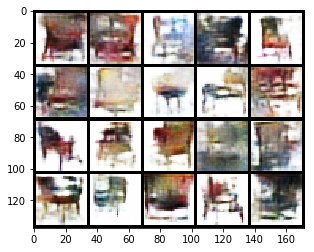

Epoch 190: Train D loss: -5.4965, G loss: 41.3936
Epoch 191: Train D loss: -5.5901, G loss: 39.4664
Epoch 192: Train D loss: -5.2595, G loss: 42.3623
Epoch 193: Train D loss: -5.0797, G loss: 39.9100
Epoch 194: Train D loss: -5.7104, G loss: 41.1818
Epoch 195: Train D loss: -5.8990, G loss: 41.5926
Epoch 196: Train D loss: -5.4659, G loss: 41.5645
Epoch 197: Train D loss: -5.3829, G loss: 39.6083
Epoch 198: Train D loss: -5.5159, G loss: 40.8797
Epoch 199: Train D loss: -5.5929, G loss: 40.7131


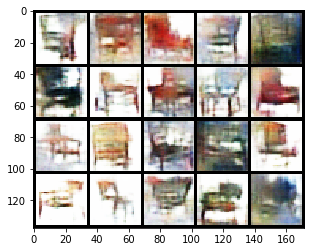

Epoch 200: Train D loss: -6.1385, G loss: 40.1352
Epoch 201: Train D loss: -4.5407, G loss: 42.2616
Epoch 202: Train D loss: -5.1193, G loss: 37.7291
Epoch 203: Train D loss: -5.5122, G loss: 42.4726
Epoch 204: Train D loss: -6.5557, G loss: 38.0223
Epoch 205: Train D loss: -5.9625, G loss: 43.3333
Epoch 206: Train D loss: -6.2016, G loss: 39.6714
Epoch 207: Train D loss: -5.6239, G loss: 41.6040
Epoch 208: Train D loss: -6.1242, G loss: 42.2140
Epoch 209: Train D loss: -5.7569, G loss: 40.6393


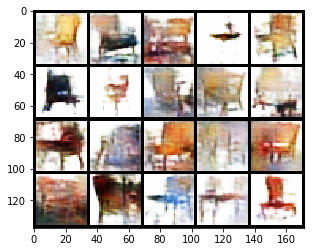

Epoch 210: Train D loss: -5.7933, G loss: 41.5745
Epoch 211: Train D loss: -4.9189, G loss: 39.9549
Epoch 212: Train D loss: -5.2286, G loss: 40.0743
Epoch 213: Train D loss: -6.1919, G loss: 42.6796
Epoch 214: Train D loss: -6.2266, G loss: 42.2768
Epoch 215: Train D loss: -5.9174, G loss: 40.9004
Epoch 216: Train D loss: -6.5905, G loss: 43.9106
Epoch 217: Train D loss: -6.1597, G loss: 42.6475
Epoch 218: Train D loss: -6.1912, G loss: 43.9503
Epoch 219: Train D loss: -6.2922, G loss: 41.8338


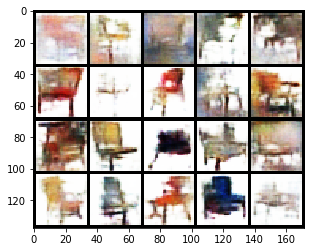

Epoch 220: Train D loss: -4.2743, G loss: 40.5680
Epoch 221: Train D loss: -5.3831, G loss: 43.1528
Epoch 222: Train D loss: -5.7809, G loss: 42.9993
Epoch 223: Train D loss: -6.9405, G loss: 42.4618
Epoch 224: Train D loss: -5.9199, G loss: 43.1277
Epoch 225: Train D loss: -6.5034, G loss: 42.8951
Epoch 226: Train D loss: -6.0073, G loss: 43.7264
Epoch 227: Train D loss: -7.4751, G loss: 42.5715
Epoch 228: Train D loss: -5.2252, G loss: 42.7309
Epoch 229: Train D loss: -6.8432, G loss: 43.8133


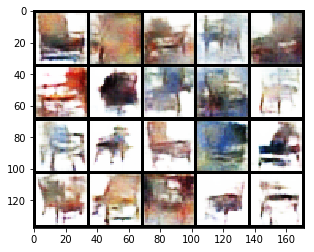

Epoch 230: Train D loss: -4.9570, G loss: 43.4030
Epoch 231: Train D loss: -6.0733, G loss: 44.7327
Epoch 232: Train D loss: -5.8127, G loss: 45.7649
Epoch 233: Train D loss: -6.6399, G loss: 41.9249
Epoch 234: Train D loss: -6.1251, G loss: 42.6173
Epoch 235: Train D loss: -6.8227, G loss: 45.4312
Epoch 236: Train D loss: -3.7727, G loss: 39.5263
Epoch 237: Train D loss: -6.2938, G loss: 44.1140
Epoch 238: Train D loss: -6.3966, G loss: 43.2990
Epoch 239: Train D loss: -1.6468, G loss: 40.4502


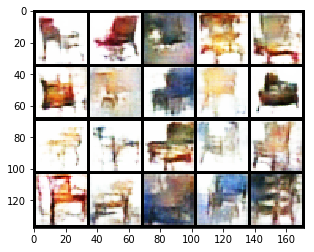

Epoch 240: Train D loss: -0.1417, G loss: 33.9825
Epoch 241: Train D loss: -0.9726, G loss: 34.5106
Epoch 242: Train D loss: -1.8682, G loss: 36.0489
Epoch 243: Train D loss: -2.3248, G loss: 37.6817
Epoch 244: Train D loss: -2.6881, G loss: 36.9557
Epoch 245: Train D loss: -3.2404, G loss: 37.6096
Epoch 246: Train D loss: -3.6402, G loss: 38.9285
Epoch 247: Train D loss: -4.0503, G loss: 37.5987
Epoch 248: Train D loss: -4.0875, G loss: 39.7128
Epoch 249: Train D loss: -4.6184, G loss: 38.9397


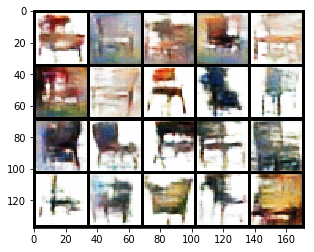

Epoch 250: Train D loss: -4.7858, G loss: 41.4935
Epoch 251: Train D loss: -5.0026, G loss: 40.4978
Epoch 252: Train D loss: -4.8996, G loss: 40.9776
Epoch 253: Train D loss: -5.1331, G loss: 42.2307
Epoch 254: Train D loss: -5.5447, G loss: 41.8989
Epoch 255: Train D loss: -5.3562, G loss: 41.6729
Epoch 256: Train D loss: -5.5526, G loss: 42.4412
Epoch 257: Train D loss: -5.5242, G loss: 43.7275
Epoch 258: Train D loss: -5.7804, G loss: 43.2719
Epoch 259: Train D loss: -6.0140, G loss: 43.9420


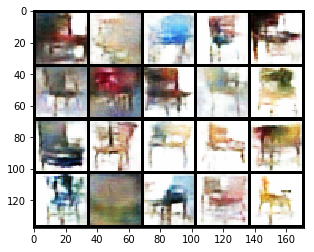

Epoch 260: Train D loss: -5.6637, G loss: 43.0139
Epoch 261: Train D loss: -5.5318, G loss: 44.7254
Epoch 262: Train D loss: -5.8804, G loss: 44.0102
Epoch 263: Train D loss: -5.9130, G loss: 44.4788
Epoch 264: Train D loss: -5.8865, G loss: 44.0868
Epoch 265: Train D loss: -6.2643, G loss: 45.4971
Epoch 266: Train D loss: -6.2033, G loss: 44.1404
Epoch 267: Train D loss: -7.0028, G loss: 43.9162
Epoch 268: Train D loss: -6.4579, G loss: 46.4928
Epoch 269: Train D loss: -6.2066, G loss: 43.6485


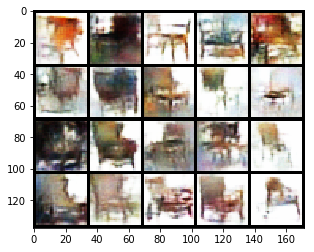

Epoch 270: Train D loss: -6.7503, G loss: 45.2771
Epoch 271: Train D loss: -7.3979, G loss: 44.3392
Epoch 272: Train D loss: -6.4006, G loss: 46.5005
Epoch 273: Train D loss: -6.3313, G loss: 48.0894
Epoch 274: Train D loss: -7.4625, G loss: 45.1487
Epoch 275: Train D loss: -6.8971, G loss: 45.8537
Epoch 276: Train D loss: -6.6344, G loss: 47.7167
Epoch 277: Train D loss: -4.9360, G loss: 45.0959
Epoch 278: Train D loss: -7.0355, G loss: 49.1457
Epoch 279: Train D loss: -6.8455, G loss: 48.1603


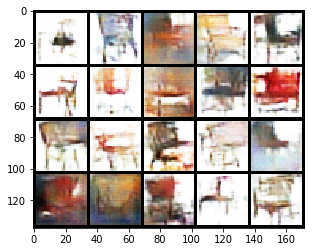

Epoch 280: Train D loss: -6.5013, G loss: 44.1186
Epoch 281: Train D loss: -6.2981, G loss: 48.0576
Epoch 282: Train D loss: -7.6663, G loss: 47.4621
Epoch 283: Train D loss: -6.7688, G loss: 48.0388
Epoch 284: Train D loss: -7.3134, G loss: 44.9738
Epoch 285: Train D loss: -6.1191, G loss: 49.2511
Epoch 286: Train D loss: -7.2421, G loss: 47.4123
Epoch 287: Train D loss: -6.1593, G loss: 47.8067
Epoch 288: Train D loss: -7.5440, G loss: 48.5380
Epoch 289: Train D loss: -6.8918, G loss: 49.0110


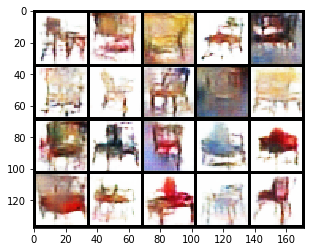

Epoch 290: Train D loss: -6.2086, G loss: 45.7066
Epoch 291: Train D loss: -7.0167, G loss: 48.6324
Epoch 292: Train D loss: -9.7545, G loss: 44.5583
Epoch 293: Train D loss: -6.2762, G loss: 52.3816
Epoch 294: Train D loss: -6.1676, G loss: 39.5445
Epoch 295: Train D loss: -7.0614, G loss: 48.9303
Epoch 296: Train D loss: -8.2181, G loss: 45.8326
Epoch 297: Train D loss: -4.9452, G loss: 48.6053
Epoch 298: Train D loss: -8.3989, G loss: 47.1018
Epoch 299: Train D loss: -7.6127, G loss: 51.3932


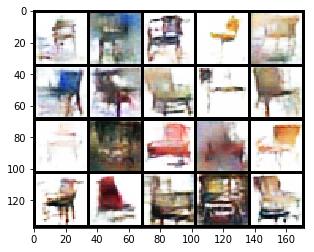

In [23]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:2')

# n_d: train D
n_d = 2
lambda_ = 10

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist = []
g_loss_hist = []

for epoch in range(n_epochs):
    d_loss, g_loss = wgan_gp_train(trainloader, G, D, G_optimizer, D_optimizer, device, 
                           z_dim=latent_dim, lambda_=lambda_, n_d=n_d)
    print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))
    
    d_loss_hist.append(d_loss)
    g_loss_hist.append(g_loss)
    
    if epoch == 0 or (epoch + 1) % 10 == 0:
        visualize_results(G, device, latent_dim)

同理,观察loss曲线和D上的参数分布.

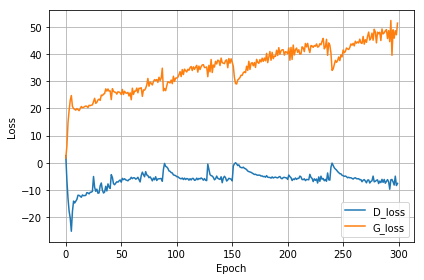

In [24]:
loss_plot(d_loss_hist, g_loss_hist)

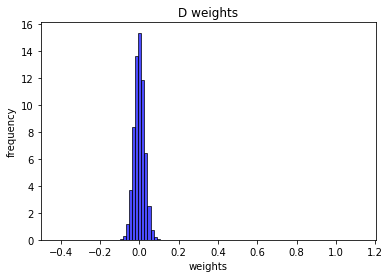

In [25]:
show_d_params(D)

#### **作业**: 
观察WGAN和WGAN-GP生成器生成的图片效果,它们在相同epoch时生成的图片效果(或者说生成图片达到效果所需要epoch数量),它们的loss曲线以及D的参数分布,说说有什么不同?

答：

可以观察到，在相同epoch时WGAN-GP生成的图片效果更加好。相比WGAN，WGAN-GP的收敛速度更加快。在训练的一开始可以看到WGAN-GP很快就能生成了图片物体的大致轮廓，而WGAN相对慢一点。

WGAN的loss曲线中，D的loss曲线的相反数和G的loss曲线是逐渐下降的。而WGAN-GP的loss曲线中，G的loss值是逐渐上升的。

WGAN中的D的参数主要分布在-c和c两处，而WGAN-GP的D的参数主要分布在0左右。